In [2]:
from itertools import islice
import re
import os
os.environ['KMP_DUPLICATE_LIB_OK']='TRUE'

from matplotlib import pyplot as plt
import matplotlib.dates as mdates
from tqdm.notebook import tqdm
from lightning.pytorch.callbacks import EarlyStopping


import torch
import torch.nn as nn
torch.set_float32_matmul_precision('high')  # or 'medium'
from gluonts.evaluation import make_evaluation_predictions, Evaluator
from gluonts.dataset.repository.datasets import get_dataset

from gluonts.dataset.pandas import PandasDataset
from gluonts.dataset.common import ListDataset
import pandas as pd
from pandas.tseries.offsets import MonthEnd
import numpy as np
from gluonts.torch.model.tft import TemporalFusionTransformerEstimator
from pytorch_lightning.callbacks import ModelCheckpoint
import sys
sys.path.append('./lag-llama')
from lag_llama.gluon.estimator import LagLlamaEstimator
from gluonts.torch.model.predictor import PyTorchPredictor
from gluonts.torch.distributions import StudentTOutput
from gluonts.model.forecast_generator import DistributionForecastGenerator
import lightning.pytorch as pl
from typing import List, Optional, Callable, Iterable
from gluonts.dataset.loader import TrainDataLoader,ValidationDataLoader
from gluonts.itertools import Cached
from gluonts.torch.batchify import batchify
from gluonts.dataset.field_names import FieldName
from gluonts.transform import (
    AddObservedValuesIndicator,
    InstanceSplitter,
    ExpectedNumInstanceSampler,
    TestSplitSampler,
)
import math
import pickle

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### Pipeline

In [4]:
#any additional functions that can be used to help with input files in the time_series_conversion function.



# used for business outlook survey
def convert_to_date(qtr):
    year = int(qtr[:4])
    if qtr[-2:] == 'Q4':
        year += 1
    month = {
        'Q1': '04',
        'Q2': '07',
        'Q3': '10',
        'Q4': '01'
    }[qtr[-2:]]
    return f"{year}-{month}-01"

#The dataset must be correctly formatted/aligned to the monthly format in the base files, and has identify date, category, and value variables for the pivot
# file path: self explantory
# times steps: 20
# var_name: dataset name appended to each variable
# date_variable: the date variable name
# category_variable: categorization of value variables
# value_variables: self explantory
def time_series_conversion(file_path,var_name,date_variable,category_variables,values_variables,time_steps=20):

    print(file_path)

    #file input 
    if file_path == 'Business_Outlook_Survey-ed-2023-10-01.csv':
        df = pd.read_csv(file_path,skiprows=57)
    else:
        df = pd.read_csv(file_path)

    #specific instructions for certain files
    if file_path == 'Employment_ByIndustry.csv':
        df = df[df['GEO']=='Canada']
    elif file_path == 'Business_Outlook_Survey-ed-2023-10-01.csv':
        df[date_variable[0]] = df[date_variable[0]].apply(convert_to_date)
        df = df[df[date_variable[0]]>= '2001-01-01']
        df[date_variable[0]] = pd.to_datetime(df[date_variable[0]])
        df = df.set_index(date_variable[0])
        df = df.shift(1, freq='D').resample('MS').bfill()
        df.reset_index(inplace=True)
    elif file_path == '36100434.csv':
        df[date_variable[0]] = pd.to_datetime(df[date_variable[0]], format='%Y-%m').dt.strftime('%Y-%m-%d')
        df = df[(df['North American Industry Classification System (NAICS)'] == 'All industries [T001]') & 
                (df['Seasonal adjustment'] == 'Seasonally adjusted at annual rates') &
                (df['Prices'] == '2017 constant prices') &
                (df[date_variable[0]]>= '2001-01-01')]
    elif file_path == '18100004.csv':
        df[date_variable[0]] = pd.to_datetime(df[date_variable[0]], format='%Y-%m').dt.strftime('%Y-%m-%d')
        df = df[(df['Products and product groups'] == 'All-items') & 
                (df['GEO'] == 'Canada') &
                (df[date_variable[0]]>= '2001-01-01')]
    elif file_path == '10100139.csv':
        df[date_variable[0]] = pd.to_datetime(df[date_variable[0]])
        df = df[df[date_variable[0]].dt.day == 1]
        df = df[((df['Financial market statistics'] == 'Bank rate' ) | 
                (df['Financial market statistics'] == 'Target rate' )) &
                (df[date_variable[0]]>= '2001-01-01')]
        df[date_variable[0]] = df[date_variable[0]].dt.strftime('%Y-%m-%d')
    elif file_path == 'covid19-download.csv':
        df[date_variable[0]] = pd.to_datetime(df[date_variable[0]])
        df = df[df['prname'] == "Canada"]
        df = df.groupby(df[date_variable[0]].dt.to_period('M')).agg({
            date_variable[0]: 'first',
            'prname': 'first', 
            'numtotal_last7': 'sum'})
        df.reset_index(drop=True, inplace=True)
        df['date'] = df['date'].dt.to_period('M').dt.to_timestamp()
        df[date_variable[0]] = df[date_variable[0]].dt.strftime('%Y-%m-%d')
    elif file_path == 'Hiring_Lab_full_country_data_to_2024-03-08.csv':
        df = df[(df['jobcountry']=='Canada') &
                (df['Postings Type']=='Overall Postings')&
                (df['Index Type']=='Indeed Job Postings Index, Feb 01 2020 = 100')]
        df[date_variable[0]] = pd.to_datetime(df['Date'])
        df = df[df[date_variable[0]].dt.is_month_start]
        df[date_variable[0]] = df[date_variable[0]].dt.strftime('%Y-%m-%d')
    elif file_path == '17100009.csv':
        df[date_variable[0]] = pd.to_datetime(df[date_variable[0]], format='%Y-%m').dt.strftime('%Y-%m-%d')
        df = df[(df[date_variable[0]]>= '2001-01-01')&(df['GEO'] == 'Canada')]
        df[date_variable[0]] = pd.to_datetime(df[date_variable[0]])
        df = df.set_index(date_variable[0])
        df = df.shift(1, freq='D').resample('MS').bfill()
        df.reset_index(inplace=True)
    
    #filter on pivot variables and then pivot dataframe accordingly
    df = df[date_variable + category_variables + values_variables]
    if len(category_variables)>0:
        df = df.pivot(index=date_variable,columns = category_variables,values=values_variables).reset_index()
        #... also fix multi index issues
        for c in category_variables:
            df = df.reset_index(drop=True)
        df.columns = ['_'.join(map(str, col)).strip() for col in df.columns.values]
        df.rename(columns= {df.columns[0]:'REF_DATE'},inplace=True)
    df[df.columns[0]]=pd.to_datetime(df[df.columns[0]]).dt.strftime('%Y-%m-%d')
    df.set_index(df.columns[0], inplace=True)

    #fix add timestep columns
    for col in df:
        for lag in range(1, time_steps + 1):
            df[f'{col}_t-{lag}'] = df[col].shift(lag)

    #add id to columns so that they don't overlap with other files
    df.columns = var_name + df.columns

    return df

In [5]:
# Define a function to extract timesteps and handle columns without timesteps
def extract_timestep(column_name):

    timestep_pattern = re.compile(r"_t-(\d+)$")

    match = timestep_pattern.search(column_name)
    if match:
        # Return the timestep as an integer to sort numerically
        return int(match.group(1))
    else:
        # Assign a default value that sorts before the timesteps (e.g., -1)
        return -1

def data_creation(time_steps):

    #base data
    df_job = time_series_conversion('JobVacancies_ByIndustry.csv','job_',['REF_DATE'],['North American Industry Classification System (NAICS)','Statistics'],['VALUE'],time_steps)
    df_ear = time_series_conversion('Earnings_ByIndustry.csv','ear_',['REF_DATE'],['North American Industry Classification System (NAICS)'],['VALUE'],time_steps)
    df_emp = time_series_conversion('Employment_ByIndustry.csv','emp_',['REF_DATE'],['North American Industry Classification System (NAICS)'],['VALUE'],time_steps)
    df_hou = time_series_conversion('Hours_ByIndustry.csv','hou_',['REF_DATE'],['North American Industry Classification System (NAICS)'],['VALUE',],time_steps)
    df_bus = time_series_conversion('Business_Outlook_Survey-ed-2023-10-01.csv','bus_',['date'],[],['EMPLOY','COSTS','OUTPUTS'],time_steps)
    df_gdp = time_series_conversion('36100434.csv','gdp_',['REF_DATE'],[],['VALUE'],time_steps)
    df_cpi = time_series_conversion('18100004.csv','cpi_',['REF_DATE'],[],['VALUE'],time_steps)
    df_inf = time_series_conversion('10100139.csv','inf_',['REF_DATE'],['Financial market statistics'],['VALUE'],time_steps)
    df_pop = time_series_conversion('17100009.csv','pop_',['REF_DATE'],['GEO'],['VALUE'],time_steps)
    df_covid = time_series_conversion('covid19-download.csv','covid_',['date'],['prname'],['numtotal_last7'],time_steps)
    df_indeed = time_series_conversion('Hiring_Lab_full_country_data_to_2024-03-08.csv','indeed_',['Date'],['Sector'],['Non-seasonally adjusted percentage'],time_steps)
    output_var_size = sum([len(dfs.columns) for dfs in [df_job, df_ear, df_emp, df_hou]])/(time_steps+1)
    input_var_size = sum([len(dfs.columns) for dfs in [df_pop,df_indeed,df_covid,df_inf,df_cpi,df_gdp,df_bus,df_job, df_ear, df_emp, df_hou]])/(time_steps+1)
    df = df_pop
    for df1 in [df_covid,df_indeed,df_inf,df_cpi,df_gdp,df_bus,df_job,df_ear,df_emp,df_hou]:
        df = pd.merge(df,df1,how = 'outer',left_index=True,right_index=True)

    # Sort the DataFrame's columns by the extracted timestep
    sorted_columns = sorted(df.columns, key=extract_timestep,reverse=True)
    df = df[sorted_columns]
    df = df[(df.index >= '2000-02-01') & (df.index <= '2023-12-01')]
    df.fillna(0,inplace=True)
    
    return df_job,df_ear,df_emp,df_hou,df,input_var_size,output_var_size

In [6]:
def convert_to_csv(df,input_var_size):
    labour_ind = ['job_','ear_','emp_','hou_']
    for ind in labour_ind:
        if ind == 'job_':
            df_col = [col for col in df.columns if col.startswith(ind) and col.endswith('cies')]
            other_col = [col for col in df.columns if not(col.startswith(ind)) or (col.startswith(ind) and not(col.endswith('cies')))]
        else:
            df_col = [col for col in df.columns if col.startswith(ind)]
            other_col = [col for col in df.columns if not(col.startswith(ind))]
        df[other_col] = df[other_col].shift(1)
        df.fillna(0,inplace=True)
        melt_df = df.iloc[:,-int(input_var_size):][df_col]
        melt_df = melt_df.reset_index()
        melt_df = pd.melt(melt_df, id_vars=['index'], var_name='feature_name', value_name='feature_value')
        melt_df = melt_df.set_index('index')
        melt_df.head()
        df_gluton = pd.merge(melt_df,df,how = 'left',left_index=True,right_index=True)
        df_gluton.to_csv(f'{ind}melt_complete_data.csv')

In [67]:
time_steps = 0
df_job,df_ear,df_emp,df_hou,df,input_var_size,output_var_size = data_creation(time_steps)

JobVacancies_ByIndustry.csv
Earnings_ByIndustry.csv
Employment_ByIndustry.csv
Hours_ByIndustry.csv
Business_Outlook_Survey-ed-2023-10-01.csv


FileNotFoundError: [Errno 2] No such file or directory: 'Business_Outlook_Survey-ed-2023-10-01.csv'

In [6]:
convert_to_csv(df,input_var_size)

NameError: name 'df' is not defined

### Important functions


In [4]:
def get_lag_llama_predictions(dataset, prediction_length, model_weights_path = "lag-llama.ckpt",context_length=32, num_samples=20, device="cuda", batch_size=64, nonnegative_pred_samples=True):
    ckpt = torch.load(model_weights_path, map_location=device)
    # ckpt = torch.load(r"lightning_logs\version_7\checkpoints\epoch=19-step=1000.ckpt", map_location=device)
    estimator_args = ckpt["hyper_parameters"]["model_kwargs"]

    estimator = LagLlamaEstimator(
        ckpt_path="lag-llama.ckpt",
        prediction_length=prediction_length,
        context_length=context_length,

        # estimator args
        input_size=estimator_args["input_size"],
        n_layer=estimator_args["n_layer"],
        n_embd_per_head=estimator_args["n_embd_per_head"],
        n_head=estimator_args["n_head"],
        scaling=estimator_args["scaling"],
        time_feat=estimator_args["time_feat"],

        nonnegative_pred_samples=nonnegative_pred_samples,

        # linear positional encoding scaling
        rope_scaling={
            "type": "linear",
            "factor": max(1.0, (context_length + prediction_length) / estimator_args["context_length"]),
        },

        batch_size=batch_size,
        num_parallel_samples=num_samples,
    )

    lightning_module = estimator.create_lightning_module()
    transformation = estimator.create_transformation()
    predictor = estimator.create_predictor(transformation, lightning_module)

    forecast_it, ts_it = make_evaluation_predictions(
        dataset=dataset,
        predictor=predictor,
        num_samples=num_samples
    )
    forecasts = list(tqdm(forecast_it, total=len(dataset), desc="Forecasting batches"))
    tss = list(tqdm(ts_it, total=len(dataset), desc="Ground truth"))

    return forecasts, tss

def convertcolumns_tofloat(df):
    for col in df.columns:
        # Check if column is not of string type
        if df[col].dtype != 'object' and pd.api.types.is_string_dtype(df[col]) == False:
            df[col] = df[col].astype('float32')


def check_and_modify_2020_year(df_jobs):

    columns = df_jobs.columns
    
    for category in df_jobs['North American Industry Classification System (NAICS)'].unique():
        category_df = df_jobs[df_jobs['North American Industry Classification System (NAICS)'] == category]
        
        if 2020 in category_df.index.year:
            year_2020_df = category_df[category_df.index.year == 2020]
            
            if len(year_2020_df) < 12:
                all_months = pd.date_range(start='2020-01-01', end='2020-12-01', freq='MS')
                missing_months = set(all_months) - set(year_2020_df.index)
                
                for month in missing_months:
                    # Create a new row with the same columns as the original DataFrame
                    new_row = pd.DataFrame(index=[month], columns=columns)
                    new_row['North American Industry Classification System (NAICS)'] = category
                    new_row['VALUE'] = None
                    # Ensure the new row has the same dtypes as the original DataFrame
                    new_row = new_row.astype(df_jobs.dtypes)
                    
                    df_jobs = pd.concat([df_jobs, new_row])
    
    df_jobs = df_jobs.sort_index()
    return df_jobs


def No_external_load_dataset(path_to_csv):
    df_earnings_ = pd.read_csv(path_to_csv, index_col=0, parse_dates=True)
    df_earnings_ = df_earnings_[df_earnings_['GEO']=='Canada']
    
    if 'Statistics' in df_earnings_.keys():
        print('Job Vacancies Time')
        df_earnings_ = df_earnings_[df_earnings_['Statistics'] == 'Job vacancies']
        df_earnings_ = df_earnings_[['North American Industry Classification System (NAICS)', 'VALUE']]
        # df_earnings_ = df_earnings_[df_earnings_['North American Industry Classification System (NAICS)'] == 'Total, all industries']
        df_earnings_ = check_and_modify_2020_year(df_earnings_)

    # df_earnings_ = df_earnings_[df_earnings_['North American Industry Classification System (NAICS)'] == 'Total, all industries']
    df_earnings_ = df_earnings_[['North American Industry Classification System (NAICS)', 'VALUE']]

    convertcolumns_tofloat(df_earnings_)
    df_earnings_
    # # # Split the DataFrame into train and test sets
    earnings_train_df = df_earnings_[df_earnings_.index <= '2022-06']
    earnings_val_df = df_earnings_[df_earnings_.index <= '2023-6']
    earnings_test_df = df_earnings_
    # # # Create the Pandas
    train_earnings_dataset = PandasDataset.from_long_dataframe(earnings_train_df, target="VALUE", item_id="North American Industry Classification System (NAICS)")
    val_earnings_dataset = PandasDataset.from_long_dataframe(earnings_val_df, target="VALUE", item_id="North American Industry Classification System (NAICS)")
    test_earnings_dataset = PandasDataset.from_long_dataframe(earnings_test_df, target="VALUE", item_id="North American Industry Classification System (NAICS)")

    return train_earnings_dataset, val_earnings_dataset, test_earnings_dataset

def with_external_load_dataset(path_to_csv, selected_features=None):
    df_earnings_ = pd.read_csv(path_to_csv, index_col=0, parse_dates=True)
    df_earnings_['feature_value'] = df_earnings_['feature_value'].replace(0, np.nan)
    
    convertcolumns_tofloat(df_earnings_)


    # Split the DataFrame into train and test sets
    earnings_train_df = df_earnings_[df_earnings_. index <= '2022-06']
    earnings_val_df = df_earnings_[df_earnings_.index <= '2022-12']
    earnings_test_df = df_earnings_[df_earnings_.index < '2023-12']
    
    # Create the Pandas
    
        # Get feature columns other than "feature_value" and 'feature_name'
    if selected_features is not None:
        feat_columns = selected_features
    else:
        feat_columns = [col for col in df_earnings_.columns if col not in ["feature_value", "feature_name"]]
    
    
    train_earnings_dataset = PandasDataset.from_long_dataframe(earnings_train_df, target="feature_value", item_id = 'feature_name', feat_dynamic_real = feat_columns)
    val_earnings_dataset = PandasDataset.from_long_dataframe(earnings_val_df, target="feature_value", item_id = 'feature_name', feat_dynamic_real = feat_columns)
    test_earnings_dataset = PandasDataset.from_long_dataframe(earnings_test_df, target="feature_value", item_id = 'feature_name', feat_dynamic_real = feat_columns)

    return train_earnings_dataset,val_earnings_dataset, test_earnings_dataset



def lama_tune(starting_weights_path="lag-llama.ckpt", device = "cuda", prediction_length = 11, context_length_factor = 6, num_samples = 100, max_epochs = 50, batch_size = 64, lr = 5e-4):
    ckpt = torch.load(starting_weights_path, map_location=device)
    estimator_args = ckpt["hyper_parameters"]["model_kwargs"]
    early_stopping_callback = EarlyStopping(
    monitor='val_loss',  
    patience=15,        
    verbose=True,
    mode='min'           
    )
    estimator = LagLlamaEstimator(
            ckpt_path=starting_weights_path,
            prediction_length=prediction_length,
            context_length=prediction_length * context_length_factor,

            # distr_output="neg_bin",
            # scaling="mean",
            track_loss_per_series= True,
            nonnegative_pred_samples=True,
            aug_prob=0,
            lr=lr,

            # estimator args
            input_size=estimator_args["input_size"],
            n_layer=estimator_args["n_layer"],
            n_embd_per_head=estimator_args["n_embd_per_head"],
            n_head=estimator_args["n_head"],
            time_feat=estimator_args["time_feat"],

            # rope_scaling={
            #     "type": "linear",
            #     "factor": max(1.0, (context_length + prediction_length) / estimator_args["context_length"]),
            # },

            

            batch_size=batch_size,
            num_parallel_samples=num_samples,
            trainer_kwargs = {"max_epochs": max_epochs,
                              'callbacks': [early_stopping_callback]}, # <- lightning trainer arguments
        )
    return estimator

def mean_abs_scaling(context, min_scale=1e-5):
    return context.abs().mean(1).clamp(min_scale, None).unsqueeze(1)

def custom_collate_fn(batch):
    past_targets = []
    future_targets = []
    dynamic_features = []
    # print("BATCH INDICATOR ##############################################################################################################################################")
    for item in batch:
        # Assume each 'item' in the batch has 'time_series', and 'dynamic_features'
        time_series = torch.tensor(item['target'], dtype=torch.float).to(device)  # This should be your full series data
        features = torch.tensor(item['feat_dynamic_real'], dtype=torch.float).to(device)  # Your dynamic features for each time point

        # Define how far back you look and how far ahead you predict
        prediction_length = 11  # For example, predict the next 5 data points
        context_length = prediction_length * 6
        # print(time_series[-(context_length+prediction_length):-prediction_length])
        # print(time_series[-prediction_length:])
        # print(sdgsdg)
        # print("full:",time_series.shape)
        # print("future:",time_series[-prediction_length:].shape)
        # print("past:",time_series[context_length:-prediction_length].shape)
        past_targets.append(time_series[-(context_length+prediction_length):-prediction_length])
        future_targets.append(time_series[-prediction_length:])
        dynamic_features.append(features)

    # Convert lists to tensors
    past_targets_batch = torch.stack(past_targets).to(device)
    future_targets_batch = torch.stack(future_targets).to(device)
    dynamic_features_batch = torch.stack(dynamic_features).to(device)
    # Use 'batchify' to stack your arrays/tensors into batches
    # past_targets_batch = batchify(past_targets)
    # future_targets_batch = batchify(future_targets)
    
    # If you're using dynamic features
    if 'feat_dynamic_real' in batch[0]:
        # dynamic_features_batch = batchify(dynamic_features)
        return {'past_target': past_targets_batch, 'future_target': future_targets_batch, 'feat_dynamic_real': dynamic_features_batch}

    return {'past_target': past_targets_batch, 'future_target': future_targets_batch}



### Probabilistic feed-forward network class

In [4]:
class FeedForwardNetwork(nn.Module):
    def __init__(
        self,
        prediction_length: int,
        context_length: int,
        hidden_dimensions: List[int],
        distr_output=StudentTOutput(),
        batch_norm: bool = False,
        scaling: Callable = mean_abs_scaling,
    ) -> None:
        super().__init__()

        assert prediction_length > 0
        assert context_length > 0
        assert len(hidden_dimensions) > 0

        self.prediction_length = prediction_length
        self.context_length = context_length
        self.hidden_dimensions = hidden_dimensions
        self.distr_output = distr_output
        self.batch_norm = batch_norm
        self.scaling = scaling

        dimensions = [context_length] , hidden_dimensions[:-1]

        modules = []
        for in_size, out_size in zip(dimensions[:-1], dimensions[1:]):
            modules += [self.__make_lin(in_size, out_size), nn.ReLU()]
            if batch_norm:
                modules.append(nn.BatchNorm1d(out_size))
        modules.append(
            self.__make_lin(dimensions[-1], prediction_length * hidden_dimensions[-1])
        )

        self.nn = nn.Sequential(*modules)
        self.args_proj = self.distr_output.get_args_proj(hidden_dimensions[-1])

    @staticmethod
    def __make_lin(dim_in, dim_out):
        lin = nn.Linear(dim_in, dim_out)
        torch.nn.init.uniform_(lin.weight, -0.07, 0.07)
        torch.nn.init.zeros_(lin.bias)
        return lin

    def forward(self, context):
        scale = self.scaling(context)
        scaled_context = context / scale
        nn_out = self.nn(scaled_context)
        nn_out_reshaped = nn_out.reshape(
            -1, self.prediction_length, self.hidden_dimensions[-1]
        )
        distr_args = self.args_proj(nn_out_reshaped)
        return distr_args, torch.zeros_like(scale), scale

    def get_predictor(self, input_transform, batch_size=32):
        return PyTorchPredictor(
            prediction_length=self.prediction_length,
            input_names=["past_target"],
            prediction_net=self,
            batch_size=batch_size,
            input_transform=input_transform,
            forecast_generator=DistributionForecastGenerator(self.distr_output),)
    
class LightningFeedForwardNetwork(FeedForwardNetwork, pl.LightningModule):
    def __init__(self,lr , *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.lr = lr
        self.to(device)

    def training_step(self, batch):
        context = batch["past_target"].to(device)
        target = batch["future_target"].to(device)
        context[torch.isnan(context)] = 0
        target[torch.isnan(target)] = 0
        assert context.shape[-1] == self.context_length
        assert target.shape[-1] == self.prediction_length
        distr_args, loc, scale = self(context)
        distr = self.distr_output.distribution(distr_args, loc, scale)
        loss = -distr.log_prob(target)
        return loss.mean()
    
    def validation_step(self, batch):
            context = batch["past_target"].to(device)
            target = batch["future_target"].to(device)
            context[torch.isnan(context)] = 0
            target[torch.isnan(target)] = 0

            assert context.shape[-1] == self.context_length
            assert target.shape[-1] == self.prediction_length

            distr_args, loc, scale = self(context)
            distr = self.distr_output.distribution(distr_args, loc, scale)
            loss = -distr.log_prob(target)

            # Optionally log validation loss using log_dict
            self.log('val_loss', loss.mean(), on_step=False, on_epoch=True, prog_bar=True)
            
            return {'val_loss': loss.mean()}
    
    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.lr)
        return optimizer

def run_feed_forward_model(path_to_csv, prediction_length = 11, context_length_factor = 6, hidden_dimensions = [96, 48], max_epochs = 50, batch_size=64, lr = 5e-4, with_external = True, selected_features= None):

    train_earnings_dataset, val_earnings_dataset, test_earnings_dataset = with_external_load_dataset(path_to_csv, selected_features=selected_features) if with_external else No_external_load_dataset(path_to_csv)

    length_of_dataset = sum(1 for _ in train_earnings_dataset)

    num_batches_per_epoch = math.ceil(length_of_dataset / batch_size)
    print(length_of_dataset)
    print(f"Number of training batches per epoch: {num_batches_per_epoch}")     

    train_data_loader = TrainDataLoader(train_earnings_dataset, batch_size=batch_size,num_batches_per_epoch=num_batches_per_epoch, stack_fn=custom_collate_fn)

    val_data_loader = ValidationDataLoader(val_earnings_dataset, batch_size=batch_size, stack_fn=custom_collate_fn)

    context_length = prediction_length * context_length_factor

    net = LightningFeedForwardNetwork(lr,
            prediction_length=prediction_length,
            context_length=context_length,
            hidden_dimensions=hidden_dimensions,
            distr_output=StudentTOutput())
    
    early_stopping_callback = EarlyStopping(
    monitor='val_loss',  
    patience=15,        
    verbose=False,
    mode='min'           
    )
    
    trainer = pl.Trainer(max_epochs=max_epochs,callbacks = early_stopping_callback)

    trainer.fit(model = net, train_dataloaders = train_data_loader,val_dataloaders=val_data_loader)

    prediction_splitter = InstanceSplitter(
    target_field=FieldName.TARGET,
    is_pad_field=FieldName.IS_PAD,
    start_field=FieldName.START,
    forecast_start_field=FieldName.FORECAST_START,
    instance_sampler=TestSplitSampler(),
    past_length=context_length,
    future_length=prediction_length,
    time_series_fields=[FieldName.OBSERVED_VALUES],)

    mask_unobserved = AddObservedValuesIndicator(
    target_field=FieldName.TARGET,
    output_field=FieldName.OBSERVED_VALUES,
    )

    predictor_pytorch = net.get_predictor(mask_unobserved + prediction_splitter)

    forecast_it, ts_it = make_evaluation_predictions(
    dataset=test_earnings_dataset,
    predictor=predictor_pytorch
    )

    forecasts = list(tqdm(forecast_it, total=len(test_earnings_dataset), desc="Forecasting batches",miniters=10))
    tss = list(tqdm(ts_it, total=len(test_earnings_dataset), desc="Ground truth",miniters=10))

    return forecasts,tss

### Temporal Fusion Transformer

In [8]:
def run_tft(path_to_csv, prediction_length = 11, context_length_factor = 6, max_epochs = 50, batch_size=64, lr = 5e-4, with_external= True, selected_features= None):

    train_earnings_dataset, val_earnings_dataset, test_earnings_dataset = with_external_load_dataset(path_to_csv, selected_features=selected_features) if with_external else No_external_load_dataset(path_to_csv)

    length_of_dataset = sum(1 for _ in train_earnings_dataset)

    num_batches_per_epoch = math.ceil(length_of_dataset / batch_size)
    print(length_of_dataset)
    print(f"Number of training batches per epoch: {num_batches_per_epoch}")       

    context_length = prediction_length * context_length_factor

    estimator = TemporalFusionTransformerEstimator(
        freq='1M',
        prediction_length=prediction_length,
        context_length=context_length,
        num_heads=4,
        hidden_dim=32,
        variable_dim=32,
        lr = lr,
        batch_size=batch_size
        )
    
    early_stopping_callback = EarlyStopping(
        monitor='val_loss',  
        patience=10,        
        verbose=False,
        mode='min',
        # log_rank_zero_only=True          
        )
#     checkpoint_callback = ModelCheckpoint(
#     monitor='val_loss',
#     save_top_k=1,
#     verbose=False,  # Turn off messages about checkpoints
# )
        
    predictor = estimator.train(train_earnings_dataset,val_earnings_dataset,max_epochs=max_epochs,callbacks = early_stopping_callback)

    forecast_it, ts_it = make_evaluation_predictions(
    dataset=test_earnings_dataset,
    predictor=predictor
    )

    forecasts = list(tqdm(forecast_it, total=len(test_earnings_dataset), desc="Forecasting batches"))
    tss = list(tqdm(ts_it, total=len(test_earnings_dataset), desc="Ground truth"))

    return forecasts,tss

### Llama_models class

In [5]:
class llama_models:
    def __init__(self, path_to_csv, lr = 5e-4, prediction_length = 11, batch_size =64, num_samples = 100, context_length_factor = 6, device = "cuda", with_external = True, selected_features = None):

        self.prediction_length = prediction_length
        self.num_samples = num_samples  # number of samples sampled from the probability distribution for each timestep
        self.context_length_factor = context_length_factor
        self.path_to_csv = path_to_csv
        self.context_length = self.prediction_length * self.context_length_factor
        self.device = device
        self.batch_size=batch_size
        self.train_earnings_dataset, self.val_earnings_dataset, self.test_earnings_dataset = with_external_load_dataset(self.path_to_csv, selected_features) if with_external else No_external_load_dataset(self.path_to_csv)
        self.lr = lr

    

    def baseline_llama_on_csv(self,  model_weights_path = "lag-llama.ckpt"):
        forecasts, tss = get_lag_llama_predictions(
        model_weights_path = model_weights_path,
        dataset= self.test_earnings_dataset,
        prediction_length= self.prediction_length,
        num_samples= self.num_samples,
        context_length= self.context_length,
        device= self.device,
        batch_size=self.batch_size
        )
        return forecasts, tss
    
    def fine_tuned_model(self, initial_weights_path = "lag-llama.ckpt", max_epochs = 50):
        estimator = lama_tune(
            starting_weights_path= initial_weights_path,
            device = self.device,
            prediction_length = self.prediction_length,
            context_length_factor = self.context_length_factor,
            num_samples = self.num_samples,
            max_epochs= max_epochs,
            batch_size=self.batch_size,
            lr=self.lr
            )
        earnings_predictor = estimator.train(training_data=self.train_earnings_dataset, validation_data= self.val_earnings_dataset, cache_data=True, shuffle_buffer_length=1000)
        forecast_it, ts_it = make_evaluation_predictions(
        dataset=self.test_earnings_dataset,
        predictor=earnings_predictor,
        num_samples=self.num_samples
            )

        forecasts = list(tqdm(forecast_it, total=len(self.test_earnings_dataset), desc="Forecasting batches"))
        tss = list(tqdm(ts_it, total=len(self.test_earnings_dataset), desc="Ground truth"))

        return forecasts,tss

### plots and evaluation

In [6]:
class plots_and_evaluation:
    
    def __init__(self, forecasts,tss, prediction_length = 11, title= '', plot_only = None):
        self.forecasts = forecasts
        self.tss = tss
        self.prediction_length = prediction_length
        self.title = title
        self.plot_only = plot_only
    
    def plot_forcasts_all(self, zoom_to_predicted = False, save_path = None):
        plt.figure(figsize=(10,7) if self.plot_only else (20, 27))  # Adjust the figure size as needed
        date_formater = mdates.DateFormatter('%Y,%m')
        plt.rcParams.update({'font.size': 9})
        # Iterate through all 22 series and plot the predicted samples
        for idx, (forecast, ts) in enumerate(zip(self.forecasts, self.tss)):
            
            if self.plot_only:
                ax = plt.subplot(1,1, 1)  # Change the grid size to 5x5
                if  self.plot_only in forecast.item_id:
                    zoom = -2 if zoom_to_predicted else 2
                    plt.plot(ts[zoom * self.prediction_length:].to_timestamp(), label="target")
                    forecast.plot(color='g', show_label=True)
                    plt.xticks(rotation=60)
                    ax.xaxis.set_major_formatter(date_formater)
                    ax.set_title(self.title+': '+forecast.item_id)
            else:
                ax = plt.subplot(6,4, idx + 1)  # Change the grid size to 5x5
                plt.plot(ts[-4 * self.prediction_length:].to_timestamp(), label="target")
                forecast.plot(color='g', show_label=True)
                plt.xticks(rotation=60)
                ax.xaxis.set_major_formatter(date_formater)
                ax.set_title(self.title+': '+forecast.item_id)
        
        plt.gcf().tight_layout()
        plt.legend()
        # Save the figure if a save path is provided
        if save_path is not None:
            plt.savefig(save_path)
        else:
            plt.show()

    def evaluate(self):
        evaluator = Evaluator()
        agg_metrics, ts_metrics = evaluator(iter(self.tss), iter(self.forecasts))
        return agg_metrics, ts_metrics

In [223]:
class plots_and_evaluation_2:
    
    def __init__(self, forecasts, tss, forecasts_2, tss_2, prediction_length=11, title='', plot_only=None):
        self.forecasts = forecasts
        self.tss = tss
        self.forecasts_2 = forecasts_2
        self.tss_2 = tss_2
        self.prediction_length = prediction_length
        self.title = title
        self.plot_only = plot_only
    
    def plot_forcasts_all(self, Dataset_name,zoom_to_predicted=False, save_path=None):
        plt.figure(figsize=(10,7) if self.plot_only else (20, 27))
        date_formater = mdates.DateFormatter('%Y,%m')
        plt.rcParams.update({'font.size': 9})

        for idx, ((forecast, ts), (forecast_2, ts_2)) in enumerate(zip(zip(self.forecasts, self.tss), zip(self.forecasts_2, self.tss_2))):
            if self.plot_only:
                ax = plt.subplot(1, 1, 1)
                if self.plot_only in forecast.item_id:
                    zoom = -5 if zoom_to_predicted else 20
                    plt.plot(ts[zoom * self.prediction_length:].to_timestamp(), label=f"Target: {Dataset_name} - { self.plot_only}")
                    forecast.plot(ax=ax, color='green', name=f"Fine-Tuned", show_label=True)
                    # plt.plot(ts_2[zoom * self.prediction_length:].to_timestamp(), label="Target 2", color='orange')
                    forecast_2.plot(ax=ax, color='red', name="Baseline", show_label=True)
                    plt.xticks(rotation=60)
                    ax.xaxis.set_major_formatter(date_formater)
                    ax.set_title(self.title + ': ' + forecast.item_id)
                    ax.set_xlabel('Date', fontsize=12)  # Set x-axis label with a specific size
                    ax.set_ylabel('Value', fontsize=12)  # Set y-axis label with a specific size
                    ax.set_title(self.title + ': ' + forecast.item_id, fontsize=14)  # Set title with a specific size
                    ax.tick_params(axis='x', labelsize=10)  # Adjust x-axis tick label sizes
                    ax.tick_params(axis='y', labelsize=10)  # Adjust y-axis tick label sizes

            else:
                ax = plt.subplot(6, 4, idx + 1)
                plt.plot(ts[-4 * self.prediction_length:].to_timestamp(), label="Target", color='blue')
                forecast.plot(ax=ax, color='green', name="Fine-Tuned", show_label=True)
                # plt.plot(ts_2[-4 * self.prediction_length:].to_timestamp(), label="Target 2", color='orange')
                forecast_2.plot(ax=ax, color='red', name="Baseline", show_label=True)
                plt.xticks(rotation=60)
                ax.xaxis.set_major_formatter(date_formater)
                ax.set_title(forecast.item_id)

        plt.gcf().tight_layout()
        plt.legend()
        if save_path is not None:
            plt.savefig(save_path)
        else:
            plt.show()

    def evaluate(self):
        evaluator = Evaluator()
        agg_metrics, ts_metrics = evaluator(iter(self.tss), iter(self.forecasts))
        agg_metrics_2, ts_metrics_2 = evaluator(iter(self.tss_2), iter(self.forecasts_2))
        return agg_metrics, ts_metrics, agg_metrics_2, ts_metrics_2


# Evaluation Class

In [8]:
class EvaluationResults:
    def __init__(self, dataset_name, context_factor, model_type, overall_mape,overall_mase, all_industries_mape, forecasts, ts):
        self.dataset_name = dataset_name
        self.model_type = model_type
        self.overall_mape = overall_mape
        self.all_industries_mape = all_industries_mape
        self.forecasts = forecasts
        self.ts = ts
        self.context_factor = context_factor
        self.overall_mase = overall_mase

    def to_dict(self, feature_indices=None):
        result_dict = {
            "Dataset": self.dataset_name,
            'context_factor': self.context_factor,
            "Model Type": self.model_type,
            "Overall MAPE": self.overall_mape,
            "Overall MASE": self.overall_mase,
            "All Industries MAPE": self.all_industries_mape
        }
        if feature_indices is not None:
            result_dict['Feature Indices'] = feature_indices
        return result_dict

def evaluate_model(model_name, dataset_name, path_to_csv, model_type, batch_size=64, prediction_length = 11, context_length_factor = 6, max_epochs=100, with_external = False, initial_weights_path = r"lag-llama.ckpt", selected_features = None):
    if model_name == 'lag-llama':
        llama_models_obj = llama_models(path_to_csv=path_to_csv,batch_size =batch_size, prediction_length = prediction_length, context_length_factor = context_length_factor, with_external= with_external, selected_features= selected_features)

        if model_type == 'baseline':
            forecasts, ts = llama_models_obj.baseline_llama_on_csv()
        elif model_type == 'fine_tuned':
            forecasts, ts = llama_models_obj.fine_tuned_model(max_epochs=max_epochs, initial_weights_path= initial_weights_path)
        else:
            raise ValueError("Invalid model type. Choose 'baseline' or 'fine_tuned'.")
        
    elif model_name == 'FeedForwardNetwork':
        forecasts, ts = run_feed_forward_model(path_to_csv=path_to_csv, prediction_length = prediction_length, context_length_factor = context_length_factor, with_external= with_external, selected_features= selected_features)

    elif model_name == 'tft':
        forecasts, ts = run_tft(path_to_csv=path_to_csv, prediction_length = prediction_length, context_length_factor = context_length_factor, with_external= with_external, selected_features= selected_features)

    agg_metrics, ts_metrics = plots_and_evaluation(forecasts, ts).evaluate()
    overall_mape = agg_metrics['MAPE']
    overall_mase = agg_metrics['MASE']
    
    if 'job' in dataset_name:
        print('ITS JOB TIME')
        column= dataset_name[:3]+'_VALUE_'+'Total, all industries'+'_Job vacancies' if with_external else 'Total, all industries'
        # print(f'col: {column}')
        # print(f'item id: {ts_metrics}')
        all_industries_mape = ts_metrics[ts_metrics['item_id'] == column]['MAPE'].item()
    else: 
        column = dataset_name[:3]+'_VALUE_'+'Industrial aggregate excluding unclassified businesses [11-91N]' if with_external else 'Industrial aggregate excluding unclassified businesses [11-91N]'
        all_industries_mape = ts_metrics[ts_metrics['item_id'] == column]['MAPE'].item()

    return EvaluationResults(dataset_name,context_length_factor, model_type, overall_mape, overall_mase, all_industries_mape, forecasts, ts)



# ALL DATA FILES (No External)


In [78]:
# Create a directory for plots if it doesn't exist
# plots_dir = "Results-j-e-e-h-2"
# os.makedirs(plots_dir, exist_ok=True)

# # Evaluate models and save plots
# results = []
# datasets = [('Job', 'Project Data\Data_without_external\JobVacancies_ByIndustry.csv'), ('Emp', 'Project Data\Data_without_external\Employment_ByIndustry.csv'), ('Earn', 'Project Data\Data_without_external\Earnings_ByIndustry.csv'), ('Hours', 'Project Data\Data_without_external\Hours_ByIndustry.csv')]

# for dataset_name, path_to_csv in tqdm(datasets, desc=f"Processing datasets"): 
    
#     print(f'processing{dataset_name}')   
#     for model_type in ['baseline', 'fine_tuned']:
#         result = evaluate_model(dataset_name, path_to_csv, model_type, with_external= False)
#         results.append(result)

#         # Save plots
#         plot_obj = plots_and_evaluation(forecasts= result.forecasts, tss= result.ts, title = dataset_name+'_'+model_type)
#         save_path = os.path.join(plots_dir, f"{result.dataset_name}_{result.model_type}_forecasts.png")
#         plot_obj.plot_forcasts_all(save_path=save_path)


In [79]:
# # Create DataFrame
# results_df = pd.DataFrame([result.to_dict() for result in results])
# # Save results to CSV
# results_df.to_csv(plots_dir+'\evaluation_results.csv', index=False)

# ALL DATA FILES (With External)

Processing datasets:   0%|          | 0/4 [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                           | Params | In sizes                                                                           | Out sizes 
-----------------------------------------------------------------------------------------------------------------------------------------------------------
0 | model | TemporalFusionTransformerModel | 87.4 K | [[1, 66], [1, 66], [1, 1], [1, 1], [1, 77, 1], [1, 77, 0], [1, 66, 0], [1, 66, 0]] | [1, 9, 11]
-----------------------------------------------------------------------------------------------------------------------------------------------------------
87.4 K    Trainable params
0         Non-trainable params
87.4 K    Total params
0.350     Total estimated model params size (MB)


21
Number of training batches per epoch: 1


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 0, global step 50: 'val_loss' reached 156944.09375 (best 156944.09375), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_240\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 1, global step 100: 'val_loss' reached 115604.36719 (best 115604.36719), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_240\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2, global step 150: 'val_loss' reached 92437.89844 (best 92437.89844), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_240\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' reached 83423.86719 (best 83423.86719), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_240\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' reached 76195.60156 (best 76195.60156), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_240\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' reached 73423.97656 (best 73423.97656), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_240\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' reached 64835.00781 (best 64835.00781), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_240\\checkpoints\\epoch=6-step=350.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' reached 64727.59375 (best 64727.59375), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_240\\checkpoints\\epoch=10-step=550.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 33, global step 1700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 34, global step 1750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 35, global step 1800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 36, global step 1850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 37, global step 1900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 38, global step 1950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 39, global step 2000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 40, global step 2050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 41, global step 2100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 42, global step 2150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 43, global step 2200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 44, global step 2250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 45, global step 2300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 46, global step 2350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 47, global step 2400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 48, global step 2450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 49, global step 2500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 50, global step 2550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 51, global step 2600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 52, global step 2650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 53, global step 2700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 54, global step 2750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 55, global step 2800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 56, global step 2850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 57, global step 2900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 58, global step 2950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 59, global step 3000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 60, global step 3050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 61, global step 3100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 62, global step 3150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 63, global step 3200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 64, global step 3250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 65, global step 3300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 66, global step 3350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 67, global step 3400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 68, global step 3450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 69, global step 3500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 70, global step 3550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 71, global step 3600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 72, global step 3650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 73, global step 3700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 74, global step 3750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 75, global step 3800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 76, global step 3850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 77, global step 3900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 78, global step 3950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 79, global step 4000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 80, global step 4050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 81, global step 4100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 82, global step 4150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 83, global step 4200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 84, global step 4250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 85, global step 4300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 86, global step 4350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 87, global step 4400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 88, global step 4450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 89, global step 4500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 90, global step 4550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 91, global step 4600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 92, global step 4650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 93, global step 4700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 94, global step 4750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 95, global step 4800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 96, global step 4850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 97, global step 4900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 98, global step 4950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 99, global step 5000: 'val_loss' was not in top 1
`Trainer.fit` stopped: `max_epochs=100` reached.


Forecasting batches:   0%|          | 0/21 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/21 [00:00<?, ?it/s]

Running evaluation: 0it [00:00, ?it/s]The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean predicti

ITS JOB TIME


NameError: name 'wrap' is not defined

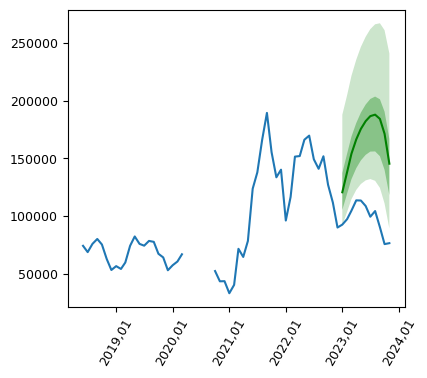

In [27]:
# Create a directory for plots if it doesn't exist
plots_dir = "Results-j-e-e-h-with-external-gulons"
os.makedirs(plots_dir, exist_ok=True)

# Evaluate models and save plots
results = []
datasets = [('job+Ex', '.\job_melt_complete_data.csv', 6), ('emp+Ex', '.\emp_melt_complete_data.csv', 6), ('ear+Ex', '.\ear_melt_complete_data.csv', 6), ('hou+Ex', '.\hou_melt_complete_data.csv', 6)]
model_name = 'tft'
for dataset_name, path_to_csv, cl in tqdm(datasets, desc=f"Processing datasets"): 
    if model_name == 'lag-llama':
        print(f'processing: {dataset_name}')   
        for model_type in ['baseline', 'fine_tuned']:
            result = evaluate_model(model_name,dataset_name, path_to_csv, model_type, with_external= True, context_length_factor = cl)
            results.append(result)
    elif model_name == 'FeedForwardNetwork':
        model_type=''
        result = evaluate_model(model_name,dataset_name, path_to_csv, model_type, with_external= True, context_length_factor = cl)
        results.append(result)
    elif model_name == 'tft':
        model_type=''
        result = evaluate_model(model_name,dataset_name, path_to_csv, model_type, with_external= True, context_length_factor = cl)
        results.append(result)        

    # Save plots
    plot_obj = plots_and_evaluation(forecasts= result.forecasts, tss= result.ts, title = dataset_name+'_'+model_type)
    save_path = os.path.join(plots_dir, f"{result.dataset_name}_{result.model_type}_forecasts.png")
    plot_obj.plot_forcasts_all(save_path=save_path)
    # Create DataFrame
    results_df = pd.DataFrame([result.to_dict() for result in results])
    # Save results to CSV
    results_df.to_csv(plots_dir+f'\{plots_dir}evaluation_sults.csv', index=False)

In [ ]:
# Create DataFrame
results_df = pd.DataFrame([result.to_dict() for result in results])
# Save results to CSV
results_df.to_csv(plots_dir+f'\{plots_dir}evaluation_sults.csv', index=False)

# Actual Forward selection

In [18]:
df = pd.read_csv('job_melt_complete_data.csv')

covid_features = [col for col in df.columns if col.startswith('covid')] 
indeed_features = [col for col in df.columns if col.startswith('indeed')]
Bank_rate_features = [col for col in df.columns if col.startswith('inf_VALUE_Bank rate')]
Target_rate_features = [col for col in df.columns if col.startswith('inf_VALUE_Target rate')]
cpi_features = [col for col in df.columns if col.startswith('cpi_VALUE')]
gdp_features = [col for col in df.columns if col.startswith('gdp_VALUE')]
bus_features = [col for col in df.columns if col.startswith('bus')]
job_features = [col for col in df.columns if col.startswith('job')]
ear_features = [col for col in df.columns if col.startswith('ear')]
emp_features = [col for col in df.columns if col.startswith('emp')]
hou_features = [col for col in df.columns if col.startswith('hou')]

features_groups = [covid_features , indeed_features , Bank_rate_features , 
                         Target_rate_features , cpi_features , gdp_features , 
                         bus_features , job_features , ear_features , emp_features , 
                         hou_features]


In [15]:
plots_dir = "forwardS-j-baseline"
os.makedirs(plots_dir, exist_ok=True)
df = pd.read_csv('job_melt_complete_data.csv')

# Define feature groups
feature_groups = [
    [col for col in df.columns if col.startswith(prefix)] 
    for prefix in ['covid', 'indeed', 'inf_VALUE_Bank rate', 'inf_VALUE_Target rate',
                   'cpi_VALUE', 'gdp_VALUE', 'bus', 'job', 'ear', 'emp', 'hou']
]

# Initialize variables
results = []
datasets = [('job+Ex', './job_melt_complete_data.csv', 1.2)]
model_name = 'lag-llama'
good_features_groups_idxs = []
best_score = float('inf')  # Start with infinity, the lower MAPE the better
# Initialize variables
current_feature_indices = []  # To track the indices in the current iteration
selected_features = []  # Start with no additional features

# Establish baseline performance with no additional features
baseline_result = evaluate_model(model_name, datasets[0][0], datasets[0][1], 'baseline',
                                 with_external=True, context_length_factor=datasets[0][2])
baseline_score = baseline_result.overall_mape
results.append(baseline_result.to_dict())

# Forward selection process
for dataset_name, path_to_csv, cl in tqdm(datasets, desc="Processing datasets"):
    for i, feature_group in tqdm(enumerate(feature_groups), desc="Forward feature selection"):
        current_features = selected_features + feature_group  # Add new group to selected features
        current_feature_indices= good_features_groups_idxs + [i]  # Include all previous good indices and the current index
        print(f'Processing {dataset_name} with feature group {i}')
        
        # Evaluate with the current set of selected features
        for model_type in ['baseline']:
            result = evaluate_model(model_name, dataset_name, path_to_csv, model_type,
                                    with_external=True, context_length_factor=cl,
                                    selected_features=current_features)
            new_score = result.overall_mape
            if new_score < best_score:
                best_score = new_score
                good_features_groups_idxs = current_feature_indices[:]  # Copy the current indices
                print(f'New best score: {best_score}, with feature groups: {good_features_groups_idxs}')
                selected_features = current_features  # Update the selected features


            # Convert the result to a dictionary and include the feature indices
            result_dict = result.to_dict(feature_indices=current_feature_indices)
            results.append(result_dict)

            # # Save plots and results
            # plot_obj = plots_and_evaluation(forecasts=result.forecasts, tss=result.ts,
            #                                 title=f'{dataset_name}_{model_type}')
            # save_path = os.path.join(plots_dir, f"{dataset_name}_{model_type}_forecasts.png")
            # plot_obj.plot_forcasts_all(save_path=save_path)

        # Save results to CSV
        results_df = pd.DataFrame(results)
        results_df.to_csv(os.path.join(plots_dir, f"{plots_dir}_evaluation_results.csv"), index=False)

final_selected_features = []
for idx in good_features_groups_idxs:
    final_selected_features.extend(feature_groups[idx])  # Cumulatively add feature groups

print("Final selected features:", final_selected_features)


Ground truth: 100%|██████████| 21/21 [00:00<00:00, 399.87it/s]
Running evaluation: 21it [00:00, 278.70it/s]


ITS JOB TIME


Processing datasets:   0%|          | 0/1 [00:00<?, ?it/s]

Processing job+Ex with feature group 0




Forecasting batches: 100%|██████████| 21/21 [00:01<00:00, 20.58it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 555.49it/s]

Running evaluation: 21it [00:00, 201.76it/s]


ITS JOB TIME
New best score: 0.20575793150699498, with feature groups: [0]
Processing job+Ex with feature group 1




Forecasting batches: 100%|██████████| 21/21 [00:01<00:00, 20.45it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 470.64it/s]

Running evaluation: 21it [00:00, 270.29it/s]


ITS JOB TIME
New best score: 0.2040117024343251, with feature groups: [0, 1]
Processing job+Ex with feature group 2




Forecasting batches: 100%|██████████| 21/21 [00:01<00:00, 20.49it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 504.15it/s]

Running evaluation: 21it [00:00, 252.32it/s]


ITS JOB TIME
New best score: 0.2025788928523208, with feature groups: [0, 1, 2]
Processing job+Ex with feature group 3




Forecasting batches: 100%|██████████| 21/21 [00:01<00:00, 20.59it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 413.90it/s]

Running evaluation: 21it [00:00, 235.96it/s]


ITS JOB TIME
Processing job+Ex with feature group 4




Forecasting batches: 100%|██████████| 21/21 [00:01<00:00, 20.52it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 505.53it/s]

Running evaluation: 21it [00:00, 242.44it/s]


ITS JOB TIME
Processing job+Ex with feature group 5




Forecasting batches: 100%|██████████| 21/21 [00:01<00:00, 20.47it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 524.95it/s]

Running evaluation: 21it [00:00, 251.71it/s]


ITS JOB TIME
New best score: 0.20161825113998347, with feature groups: [0, 1, 2, 5]
Processing job+Ex with feature group 6




Forecasting batches: 100%|██████████| 21/21 [00:01<00:00, 20.56it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 355.91it/s]

Running evaluation: 21it [00:00, 234.58it/s]


ITS JOB TIME
Processing job+Ex with feature group 7




Forecasting batches: 100%|██████████| 21/21 [00:00<00:00, 21.72it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 537.82it/s]

Running evaluation: 21it [00:00, 255.23it/s]


ITS JOB TIME
Processing job+Ex with feature group 8




Forecasting batches: 100%|██████████| 21/21 [00:00<00:00, 21.67it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 525.00it/s]

Running evaluation: 21it [00:00, 277.17it/s]


ITS JOB TIME
Processing job+Ex with feature group 9




Forecasting batches: 100%|██████████| 21/21 [00:00<00:00, 21.78it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 550.94it/s]

Running evaluation: 21it [00:00, 270.61it/s]


ITS JOB TIME
Processing job+Ex with feature group 10




Forecasting batches: 100%|██████████| 21/21 [00:00<00:00, 21.76it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 369.56it/s]

Running evaluation: 21it [00:00, 250.83it/s]
Forward feature selection: 11it [00:16,  1.47s/it]
Processing datasets: 100%|██████████| 1/1 [00:16<00:00, 16.17s/it]

ITS JOB TIME
Final selected features: ['covid_numtotal_last7_Canada', 'indeed_Non-seasonally adjusted percentage_Accounting', 'indeed_Non-seasonally adjusted percentage_Administrative Assistance', 'indeed_Non-seasonally adjusted percentage_Architecture', 'indeed_Non-seasonally adjusted percentage_Arts and Entertainment', 'indeed_Non-seasonally adjusted percentage_Banking and Finance', 'indeed_Non-seasonally adjusted percentage_Beauty and Wellness', 'indeed_Non-seasonally adjusted percentage_Cleaning and Sanitation', 'indeed_Non-seasonally adjusted percentage_Community and Social Service', 'indeed_Non-seasonally adjusted percentage_Construction', 'indeed_Non-seasonally adjusted percentage_Customer Service', 'indeed_Non-seasonally adjusted percentage_Dental', 'indeed_Non-seasonally adjusted percentage_Driving', 'indeed_Non-seasonally adjusted percentage_Education and Instruction', 'indeed_Non-seasonally adjusted percentage_Food Preparation and Service', 'indeed_Non-seasonally adjusted pe

In [16]:

final_selected_features = []
for idx in good_features_groups_idxs:
    final_selected_features.extend(feature_groups[idx])  # Cumulatively add feature groups

print("Final selected features:", final_selected_features)

Final selected features: ['covid_numtotal_last7_Canada', 'indeed_Non-seasonally adjusted percentage_Accounting', 'indeed_Non-seasonally adjusted percentage_Administrative Assistance', 'indeed_Non-seasonally adjusted percentage_Architecture', 'indeed_Non-seasonally adjusted percentage_Arts and Entertainment', 'indeed_Non-seasonally adjusted percentage_Banking and Finance', 'indeed_Non-seasonally adjusted percentage_Beauty and Wellness', 'indeed_Non-seasonally adjusted percentage_Cleaning and Sanitation', 'indeed_Non-seasonally adjusted percentage_Community and Social Service', 'indeed_Non-seasonally adjusted percentage_Construction', 'indeed_Non-seasonally adjusted percentage_Customer Service', 'indeed_Non-seasonally adjusted percentage_Dental', 'indeed_Non-seasonally adjusted percentage_Driving', 'indeed_Non-seasonally adjusted percentage_Education and Instruction', 'indeed_Non-seasonally adjusted percentage_Food Preparation and Service', 'indeed_Non-seasonally adjusted percentage_Hosp

# One feature group at a time

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 454.24it/s]
Running evaluation: 21it [00:00, 216.87it/s]


ITS JOB TIME


Processing datasets:   0%|          | 0/1 [00:00<?, ?it/s]

Processing job+Ex with feature group 0


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.759
Epoch 0, global step 50: 'val_loss' reached 9.75885 (best 9.75885), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_272\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.112 >= min_delta = 0.0. New best score: 9.647
Epoch 1, global step 100: 'val_loss' reached 9.64727 (best 9.64727), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_272\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 9.640
Epoch 2, global step 150: 'val_loss' reached 9.63953 (best 9.63953), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_272\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.182 >= min_delta = 0.0. New best score: 9.457
Epoch 3, global step 200: 'val_loss' reached 9.45713 (best 9.45713), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_272\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.026 >= min_delta = 0.0. New best score: 9.431
Epoch 5, global step 300: 'val_loss' reached 9.43100 (best 9.43100), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_272\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.017 >= min_delta = 0.0. New best score: 9.414
Epoch 13, global step 700: 'val_loss' reached 9.41434 (best 9.41434), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_272\\checkpoints\\epoch=13-step=700.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.251 >= min_delta = 0.0. New best score: 9.163
Epoch 14, global step 750: 'val_loss' reached 9.16295 (best 9.16295), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_272\\checkpoints\\epoch=14-step=750.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.163. Signaling Trainer to stop.
Epoch 29, global step 1500: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:25<00:00,  1.20s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 500.02it/s]

Running evaluation: 21it [00:00, 248.38it/s]


ITS JOB TIME
New best score for feature group 0: 0.17280699499757773


Processing job+Ex with feature group 1


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.760
Epoch 0, global step 50: 'val_loss' reached 9.76034 (best 9.76034), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_273\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.086 >= min_delta = 0.0. New best score: 9.675
Epoch 1, global step 100: 'val_loss' reached 9.67458 (best 9.67458), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_273\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.076 >= min_delta = 0.0. New best score: 9.599
Epoch 2, global step 150: 'val_loss' reached 9.59881 (best 9.59881), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_273\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.094 >= min_delta = 0.0. New best score: 9.505
Epoch 3, global step 200: 'val_loss' reached 9.50462 (best 9.50462), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_273\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.017 >= min_delta = 0.0. New best score: 9.488
Epoch 4, global step 250: 'val_loss' reached 9.48789 (best 9.48789), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_273\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.093 >= min_delta = 0.0. New best score: 9.395
Epoch 7, global step 400: 'val_loss' reached 9.39468 (best 9.39468), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_273\\checkpoints\\epoch=7-step=400.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.207 >= min_delta = 0.0. New best score: 9.188
Epoch 9, global step 500: 'val_loss' reached 9.18783 (best 9.18783), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_273\\checkpoints\\epoch=9-step=500.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.027 >= min_delta = 0.0. New best score: 9.160
Epoch 14, global step 750: 'val_loss' reached 9.16046 (best 9.16046), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_273\\checkpoints\\epoch=14-step=750.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.160. Signaling Trainer to stop.
Epoch 29, global step 1500: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:27<00:00,  1.31s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 415.49it/s]

Running evaluation: 21it [00:00, 141.07it/s]


ITS JOB TIME
New best score for feature group 1: 0.17280699499757773


Processing job+Ex with feature group 2


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.881
Epoch 0, global step 50: 'val_loss' reached 9.88144 (best 9.88144), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_274\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.210 >= min_delta = 0.0. New best score: 9.672
Epoch 1, global step 100: 'val_loss' reached 9.67151 (best 9.67151), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_274\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.113 >= min_delta = 0.0. New best score: 9.558
Epoch 2, global step 150: 'val_loss' reached 9.55820 (best 9.55820), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_274\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.086 >= min_delta = 0.0. New best score: 9.472
Epoch 3, global step 200: 'val_loss' reached 9.47233 (best 9.47233), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_274\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.031 >= min_delta = 0.0. New best score: 9.441
Epoch 4, global step 250: 'val_loss' reached 9.44136 (best 9.44136), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_274\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.095 >= min_delta = 0.0. New best score: 9.347
Epoch 6, global step 350: 'val_loss' reached 9.34678 (best 9.34678), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_274\\checkpoints\\epoch=6-step=350.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.040 >= min_delta = 0.0. New best score: 9.307
Epoch 7, global step 400: 'val_loss' reached 9.30662 (best 9.30662), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_274\\checkpoints\\epoch=7-step=400.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.095 >= min_delta = 0.0. New best score: 9.211
Epoch 11, global step 600: 'val_loss' reached 9.21148 (best 9.21148), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_274\\checkpoints\\epoch=11-step=600.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.060 >= min_delta = 0.0. New best score: 9.151
Epoch 21, global step 1100: 'val_loss' reached 9.15116 (best 9.15116), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_274\\checkpoints\\epoch=21-step=1100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 33, global step 1700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 34, global step 1750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 35, global step 1800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.151. Signaling Trainer to stop.
Epoch 36, global step 1850: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:49<00:00,  2.34s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 445.80it/s]

Running evaluation: 21it [00:00, 248.41it/s]


ITS JOB TIME
New best score for feature group 2: 0.17280699499757773


Processing job+Ex with feature group 3


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.837
Epoch 0, global step 50: 'val_loss' reached 9.83672 (best 9.83672), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_275\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.156 >= min_delta = 0.0. New best score: 9.680
Epoch 1, global step 100: 'val_loss' reached 9.68028 (best 9.68028), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_275\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.089 >= min_delta = 0.0. New best score: 9.591
Epoch 2, global step 150: 'val_loss' reached 9.59123 (best 9.59123), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_275\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.069 >= min_delta = 0.0. New best score: 9.522
Epoch 3, global step 200: 'val_loss' reached 9.52235 (best 9.52235), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_275\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.029 >= min_delta = 0.0. New best score: 9.493
Epoch 4, global step 250: 'val_loss' reached 9.49345 (best 9.49345), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_275\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.075 >= min_delta = 0.0. New best score: 9.419
Epoch 8, global step 450: 'val_loss' reached 9.41857 (best 9.41857), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_275\\checkpoints\\epoch=8-step=450.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.137 >= min_delta = 0.0. New best score: 9.282
Epoch 16, global step 850: 'val_loss' reached 9.28188 (best 9.28188), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_275\\checkpoints\\epoch=16-step=850.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.282. Signaling Trainer to stop.
Epoch 31, global step 1600: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:29<00:00,  1.41s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 391.30it/s]

Running evaluation: 21it [00:00, 186.62it/s]


ITS JOB TIME
New best score for feature group 3: 0.17280699499757773


Processing job+Ex with feature group 4


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.895
Epoch 0, global step 50: 'val_loss' reached 9.89462 (best 9.89462), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_276\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.182 >= min_delta = 0.0. New best score: 9.713
Epoch 1, global step 100: 'val_loss' reached 9.71287 (best 9.71287), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_276\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.228 >= min_delta = 0.0. New best score: 9.485
Epoch 3, global step 200: 'val_loss' reached 9.48508 (best 9.48508), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_276\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.051 >= min_delta = 0.0. New best score: 9.435
Epoch 4, global step 250: 'val_loss' reached 9.43452 (best 9.43452), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_276\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.045 >= min_delta = 0.0. New best score: 9.390
Epoch 7, global step 400: 'val_loss' reached 9.38951 (best 9.38951), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_276\\checkpoints\\epoch=7-step=400.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.192 >= min_delta = 0.0. New best score: 9.198
Epoch 8, global step 450: 'val_loss' reached 9.19771 (best 9.19771), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_276\\checkpoints\\epoch=8-step=450.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.051 >= min_delta = 0.0. New best score: 9.147
Epoch 11, global step 600: 'val_loss' reached 9.14717 (best 9.14717), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_276\\checkpoints\\epoch=11-step=600.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.147. Signaling Trainer to stop.
Epoch 26, global step 1350: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:25<00:00,  1.22s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 550.48it/s]

Running evaluation: 21it [00:00, 249.03it/s]


ITS JOB TIME
New best score for feature group 4: 0.17280699499757773


Processing job+Ex with feature group 5


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.809
Epoch 0, global step 50: 'val_loss' reached 9.80950 (best 9.80950), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_277\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.209 >= min_delta = 0.0. New best score: 9.601
Epoch 1, global step 100: 'val_loss' reached 9.60087 (best 9.60087), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_277\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.075 >= min_delta = 0.0. New best score: 9.525
Epoch 3, global step 200: 'val_loss' reached 9.52538 (best 9.52538), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_277\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.011 >= min_delta = 0.0. New best score: 9.515
Epoch 4, global step 250: 'val_loss' reached 9.51461 (best 9.51461), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_277\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.153 >= min_delta = 0.0. New best score: 9.361
Epoch 5, global step 300: 'val_loss' reached 9.36143 (best 9.36143), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_277\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 9.361
Epoch 7, global step 400: 'val_loss' reached 9.36109 (best 9.36109), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_277\\checkpoints\\epoch=7-step=400.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.090 >= min_delta = 0.0. New best score: 9.271
Epoch 9, global step 500: 'val_loss' reached 9.27085 (best 9.27085), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_277\\checkpoints\\epoch=9-step=500.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.027 >= min_delta = 0.0. New best score: 9.244
Epoch 21, global step 1100: 'val_loss' reached 9.24398 (best 9.24398), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_277\\checkpoints\\epoch=21-step=1100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.146 >= min_delta = 0.0. New best score: 9.098
Epoch 26, global step 1350: 'val_loss' reached 9.09808 (best 9.09808), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_277\\checkpoints\\epoch=26-step=1350.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 33, global step 1700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 34, global step 1750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 35, global step 1800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 36, global step 1850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 37, global step 1900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 38, global step 1950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 39, global step 2000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 40, global step 2050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.098. Signaling Trainer to stop.
Epoch 41, global step 2100: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:27<00:00,  1.32s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 397.98it/s]

Running evaluation: 21it [00:00, 228.00it/s]


ITS JOB TIME
New best score for feature group 5: 0.17280699499757773


Processing job+Ex with feature group 6


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.841
Epoch 0, global step 50: 'val_loss' reached 9.84115 (best 9.84115), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_278\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.265 >= min_delta = 0.0. New best score: 9.576
Epoch 1, global step 100: 'val_loss' reached 9.57612 (best 9.57612), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_278\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 9.575
Epoch 2, global step 150: 'val_loss' reached 9.57534 (best 9.57534), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_278\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.089 >= min_delta = 0.0. New best score: 9.486
Epoch 3, global step 200: 'val_loss' reached 9.48638 (best 9.48638), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_278\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.093 >= min_delta = 0.0. New best score: 9.393
Epoch 4, global step 250: 'val_loss' reached 9.39318 (best 9.39318), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_278\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.122 >= min_delta = 0.0. New best score: 9.271
Epoch 7, global step 400: 'val_loss' reached 9.27133 (best 9.27133), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_278\\checkpoints\\epoch=7-step=400.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.271. Signaling Trainer to stop.
Epoch 22, global step 1150: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:28<00:00,  1.35s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 348.04it/s]

Running evaluation: 21it [00:00, 209.88it/s]


ITS JOB TIME
New best score for feature group 6: 0.17280699499757773


Processing job+Ex with feature group 7


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.799
Epoch 0, global step 50: 'val_loss' reached 9.79869 (best 9.79869), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_279\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.185 >= min_delta = 0.0. New best score: 9.613
Epoch 1, global step 100: 'val_loss' reached 9.61338 (best 9.61338), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_279\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.057 >= min_delta = 0.0. New best score: 9.556
Epoch 2, global step 150: 'val_loss' reached 9.55628 (best 9.55628), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_279\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.019 >= min_delta = 0.0. New best score: 9.537
Epoch 3, global step 200: 'val_loss' reached 9.53682 (best 9.53682), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_279\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.014 >= min_delta = 0.0. New best score: 9.523
Epoch 4, global step 250: 'val_loss' reached 9.52257 (best 9.52257), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_279\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.107 >= min_delta = 0.0. New best score: 9.416
Epoch 5, global step 300: 'val_loss' reached 9.41583 (best 9.41583), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_279\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.416. Signaling Trainer to stop.
Epoch 20, global step 1050: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:28<00:00,  1.35s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 445.45it/s]

Running evaluation: 21it [00:00, 214.27it/s]


ITS JOB TIME
New best score for feature group 7: 0.17280699499757773


Processing job+Ex with feature group 8


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.905
Epoch 0, global step 50: 'val_loss' reached 9.90471 (best 9.90471), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_280\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.234 >= min_delta = 0.0. New best score: 9.671
Epoch 1, global step 100: 'val_loss' reached 9.67079 (best 9.67079), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_280\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.092 >= min_delta = 0.0. New best score: 9.579
Epoch 2, global step 150: 'val_loss' reached 9.57894 (best 9.57894), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_280\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.123 >= min_delta = 0.0. New best score: 9.456
Epoch 4, global step 250: 'val_loss' reached 9.45591 (best 9.45591), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_280\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 9.452
Epoch 6, global step 350: 'val_loss' reached 9.45182 (best 9.45182), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_280\\checkpoints\\epoch=6-step=350.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.043 >= min_delta = 0.0. New best score: 9.409
Epoch 11, global step 600: 'val_loss' reached 9.40893 (best 9.40893), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_280\\checkpoints\\epoch=11-step=600.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.151 >= min_delta = 0.0. New best score: 9.258
Epoch 18, global step 950: 'val_loss' reached 9.25821 (best 9.25821), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_280\\checkpoints\\epoch=18-step=950.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.258. Signaling Trainer to stop.
Epoch 33, global step 1700: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:37<00:00,  1.77s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 536.67it/s]

Running evaluation: 21it [00:00, 245.38it/s]


ITS JOB TIME
New best score for feature group 8: 0.17280699499757773


Processing job+Ex with feature group 9


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.803
Epoch 0, global step 50: 'val_loss' reached 9.80259 (best 9.80259), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_281\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.213 >= min_delta = 0.0. New best score: 9.589
Epoch 1, global step 100: 'val_loss' reached 9.58942 (best 9.58942), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_281\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.095 >= min_delta = 0.0. New best score: 9.495
Epoch 2, global step 150: 'val_loss' reached 9.49474 (best 9.49474), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_281\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.037 >= min_delta = 0.0. New best score: 9.458
Epoch 3, global step 200: 'val_loss' reached 9.45779 (best 9.45779), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_281\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.043 >= min_delta = 0.0. New best score: 9.415
Epoch 4, global step 250: 'val_loss' reached 9.41466 (best 9.41466), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_281\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.075 >= min_delta = 0.0. New best score: 9.340
Epoch 6, global step 350: 'val_loss' reached 9.34013 (best 9.34013), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_281\\checkpoints\\epoch=6-step=350.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 9.335
Epoch 9, global step 500: 'val_loss' reached 9.33451 (best 9.33451), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_281\\checkpoints\\epoch=9-step=500.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.335. Signaling Trainer to stop.
Epoch 24, global step 1250: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:25<00:00,  1.20s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 426.95it/s]

Running evaluation: 21it [00:00, 237.42it/s]


ITS JOB TIME
New best score for feature group 9: 0.17280699499757773


Processing job+Ex with feature group 10


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.851
Epoch 0, global step 50: 'val_loss' reached 9.85061 (best 9.85061), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_282\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.297 >= min_delta = 0.0. New best score: 9.553
Epoch 1, global step 100: 'val_loss' reached 9.55329 (best 9.55329), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_282\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.022 >= min_delta = 0.0. New best score: 9.531
Epoch 2, global step 150: 'val_loss' reached 9.53145 (best 9.53145), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_282\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.048 >= min_delta = 0.0. New best score: 9.483
Epoch 4, global step 250: 'val_loss' reached 9.48348 (best 9.48348), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_282\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.047 >= min_delta = 0.0. New best score: 9.436
Epoch 5, global step 300: 'val_loss' reached 9.43610 (best 9.43610), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_282\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.016 >= min_delta = 0.0. New best score: 9.420
Epoch 7, global step 400: 'val_loss' reached 9.42005 (best 9.42005), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_282\\checkpoints\\epoch=7-step=400.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 9.419
Epoch 9, global step 500: 'val_loss' reached 9.41864 (best 9.41864), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_282\\checkpoints\\epoch=9-step=500.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.065 >= min_delta = 0.0. New best score: 9.354
Epoch 16, global step 850: 'val_loss' reached 9.35387 (best 9.35387), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_282\\checkpoints\\epoch=16-step=850.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.249 >= min_delta = 0.0. New best score: 9.105
Epoch 18, global step 950: 'val_loss' reached 9.10508 (best 9.10508), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_282\\checkpoints\\epoch=18-step=950.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.105. Signaling Trainer to stop.
Epoch 33, global step 1700: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:25<00:00,  1.21s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 414.74it/s]

Running evaluation: 21it [00:00, 224.96it/s]


ITS JOB TIME
New best score for feature group 10: 0.17280699499757773


Evaluating feature groups: 11it [22:10, 120.95s/it]
Processing datasets: 100%|██████████| 1/1 [22:10<00:00, 1330.42s/it]


Best score for feature group 0: 0.21960057845879422
Best score for feature group 1: 0.1797772072610401
Best score for feature group 2: 0.24851051687678222
Best score for feature group 3: 0.2590574939529618
Best score for feature group 4: 0.1730519042386637
Best score for feature group 5: 0.166134301150516
Best score for feature group 6: 0.2471371994390116
Best score for feature group 7: 0.3152378937898776
Best score for feature group 8: 0.26681867038016704
Best score for feature group 9: 0.20514295968142418
Best score for feature group 10: 0.18131588934819934


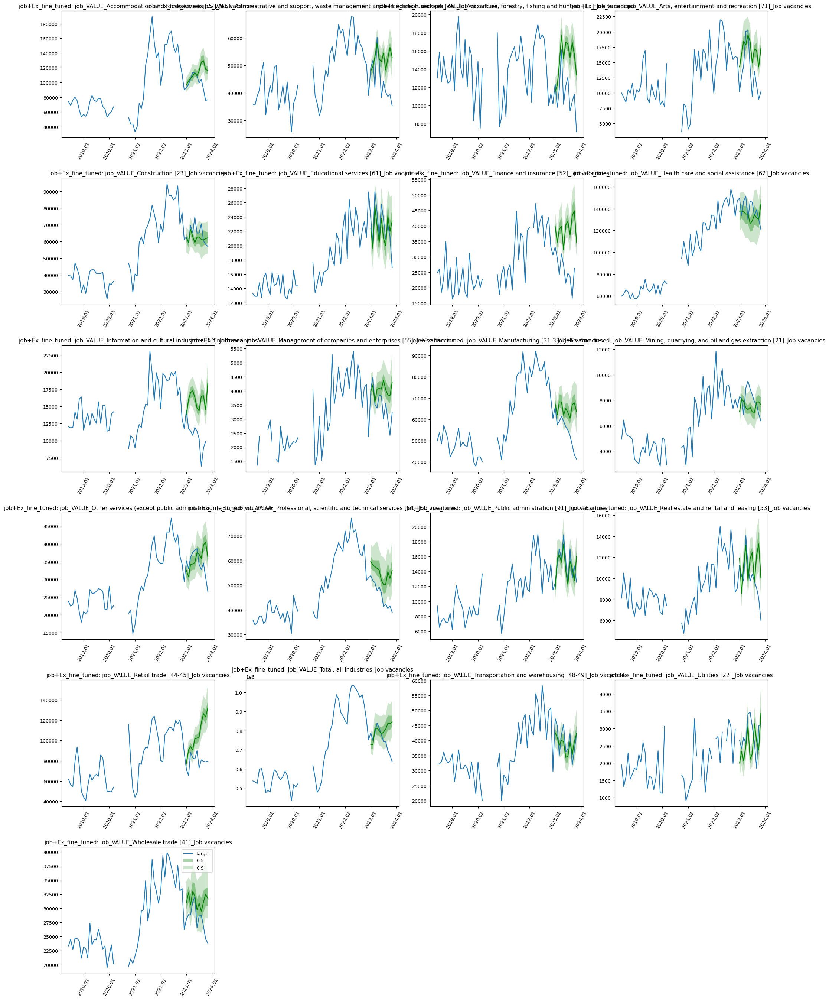

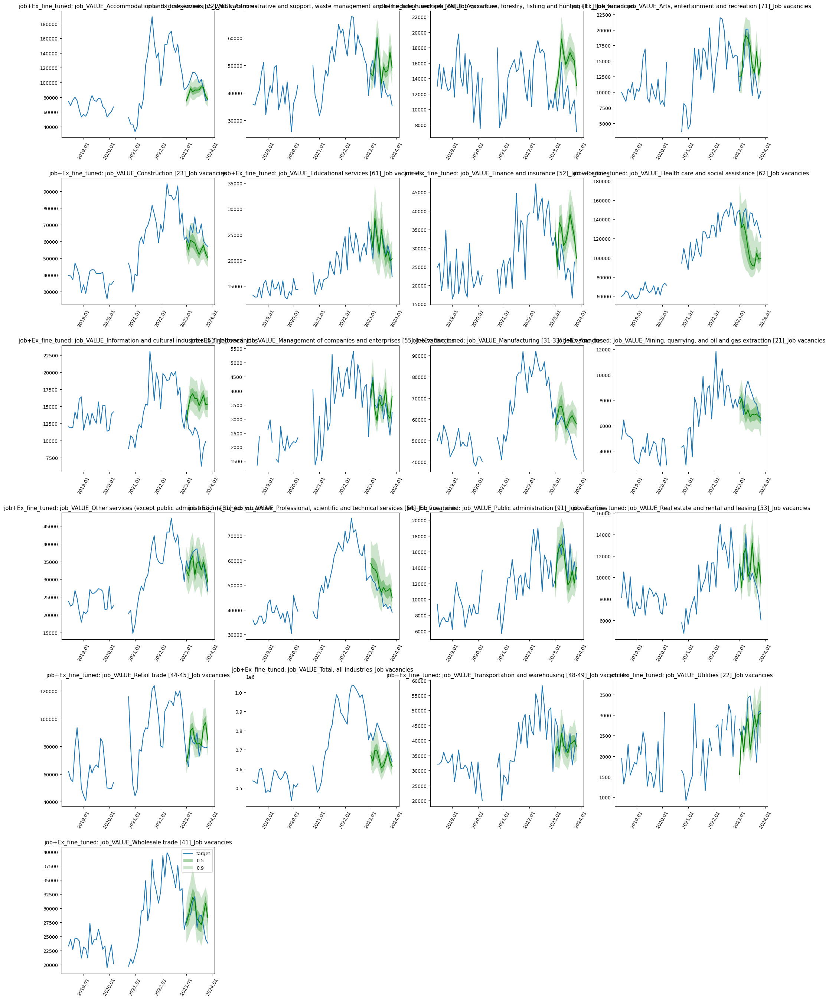

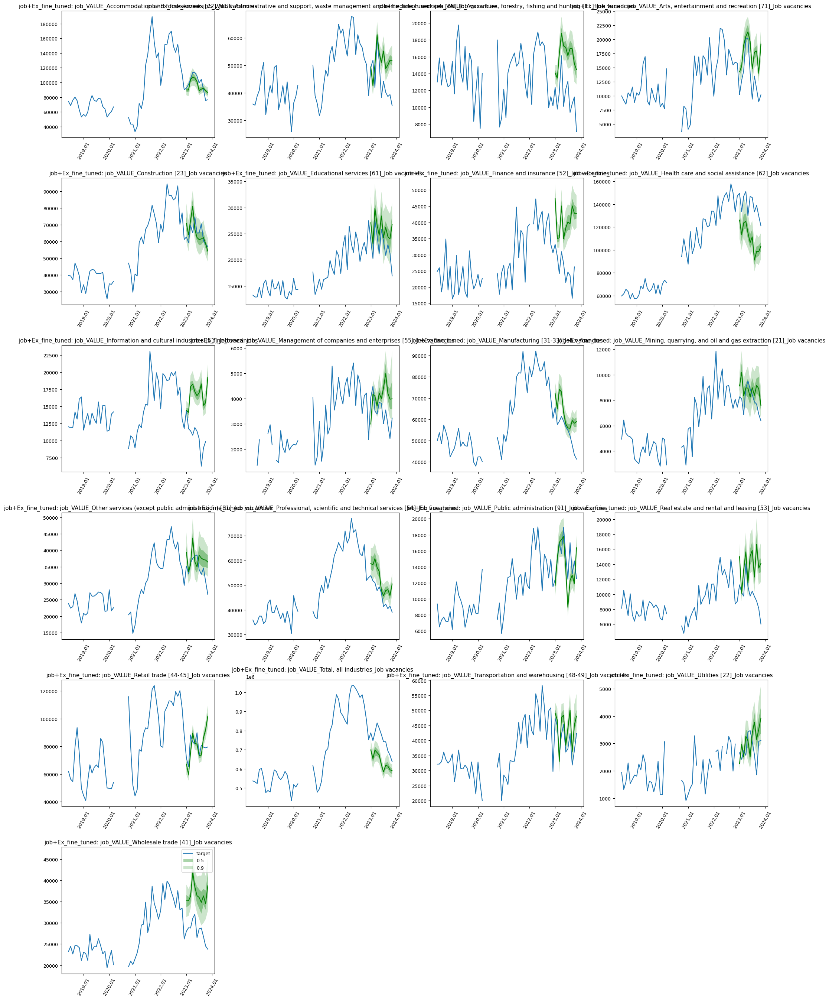

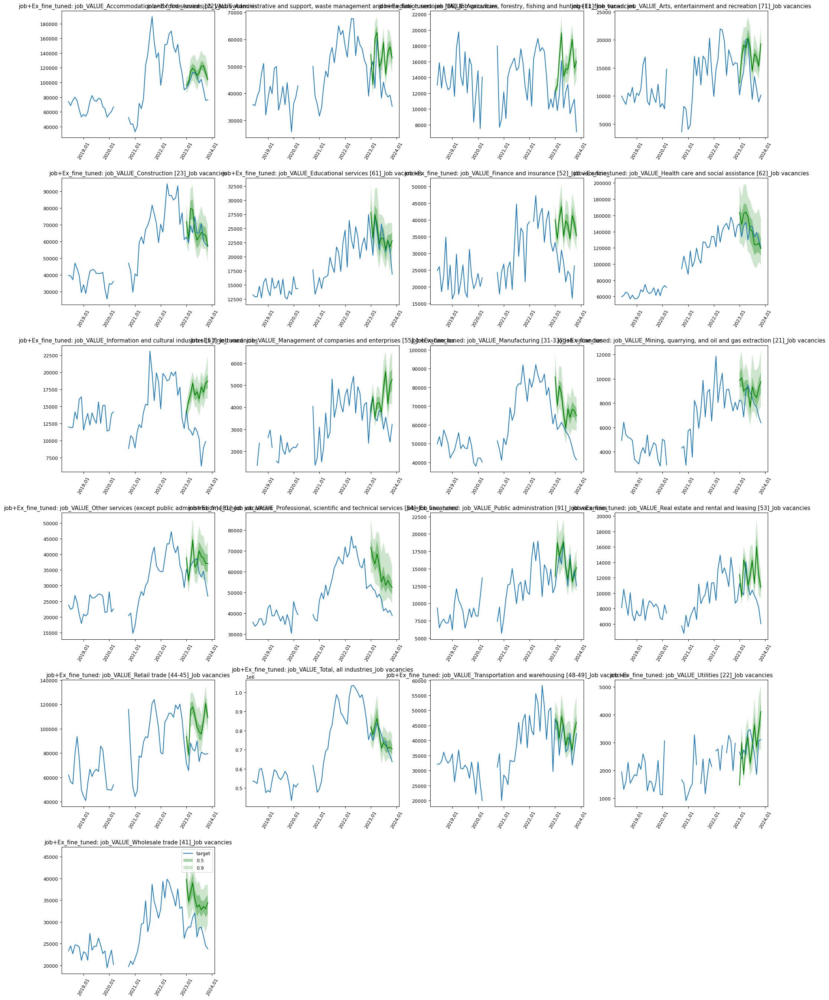

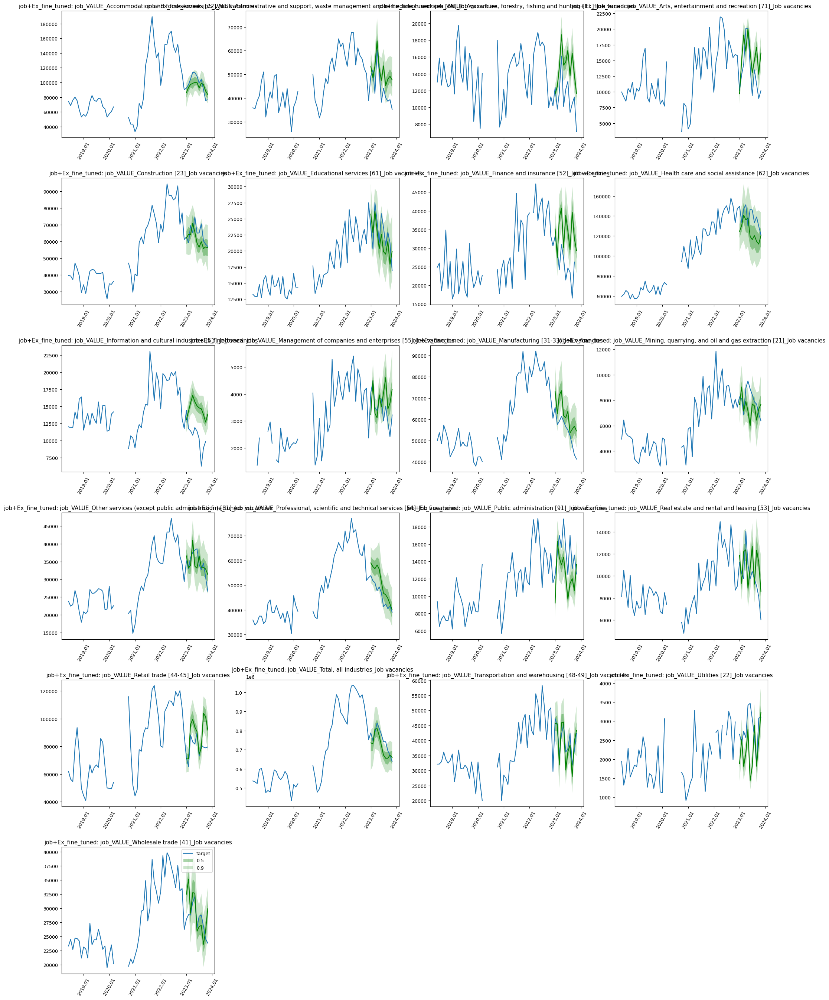

...

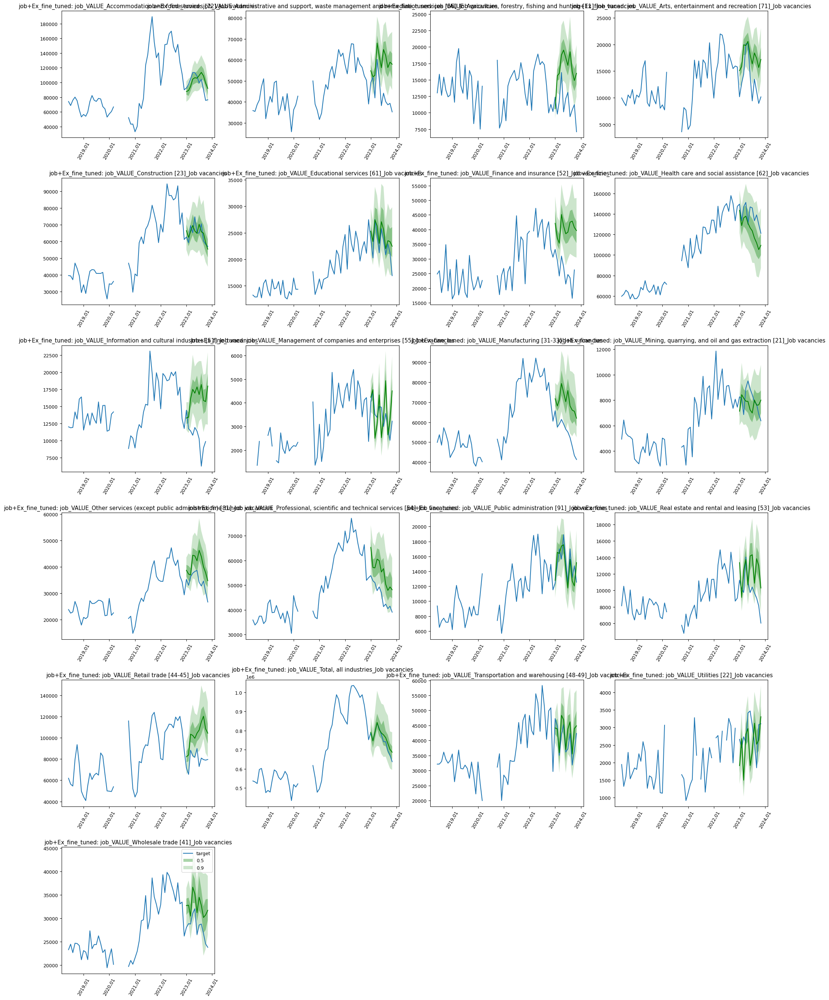

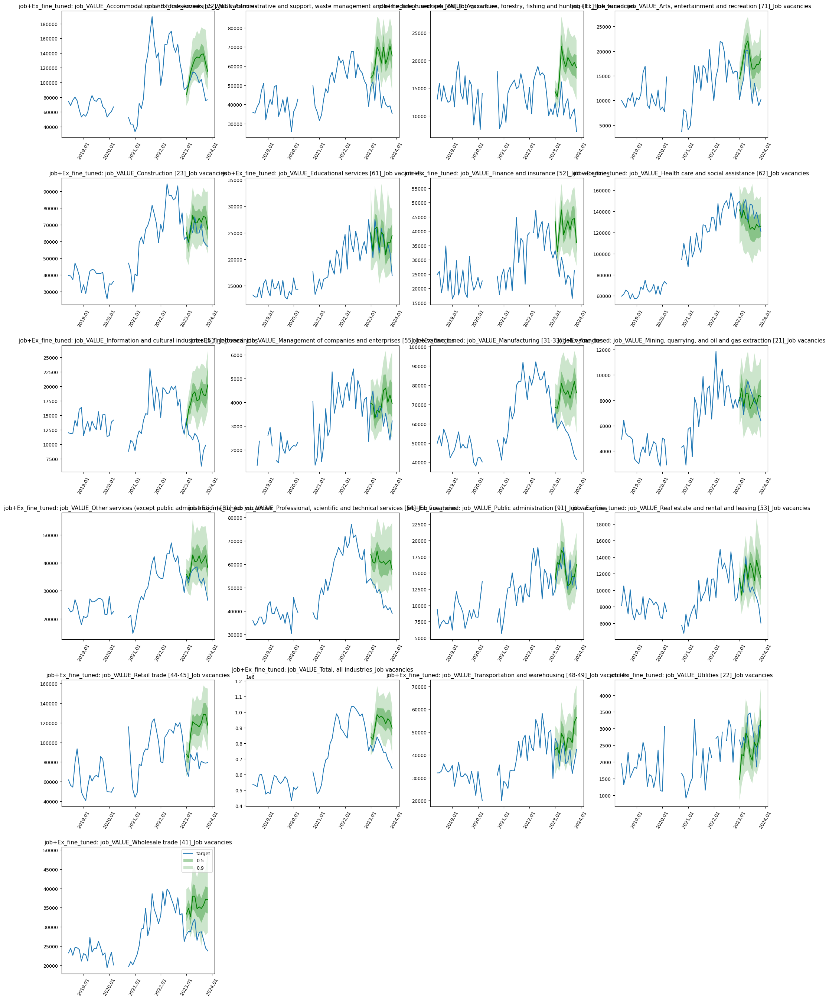

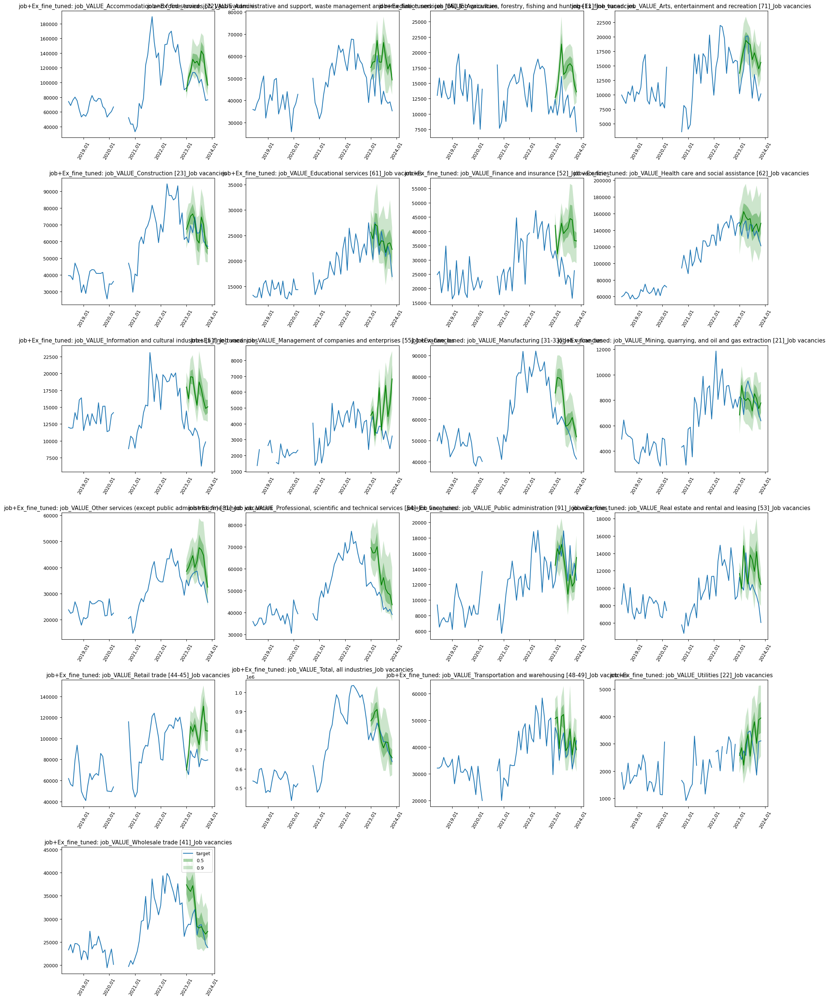

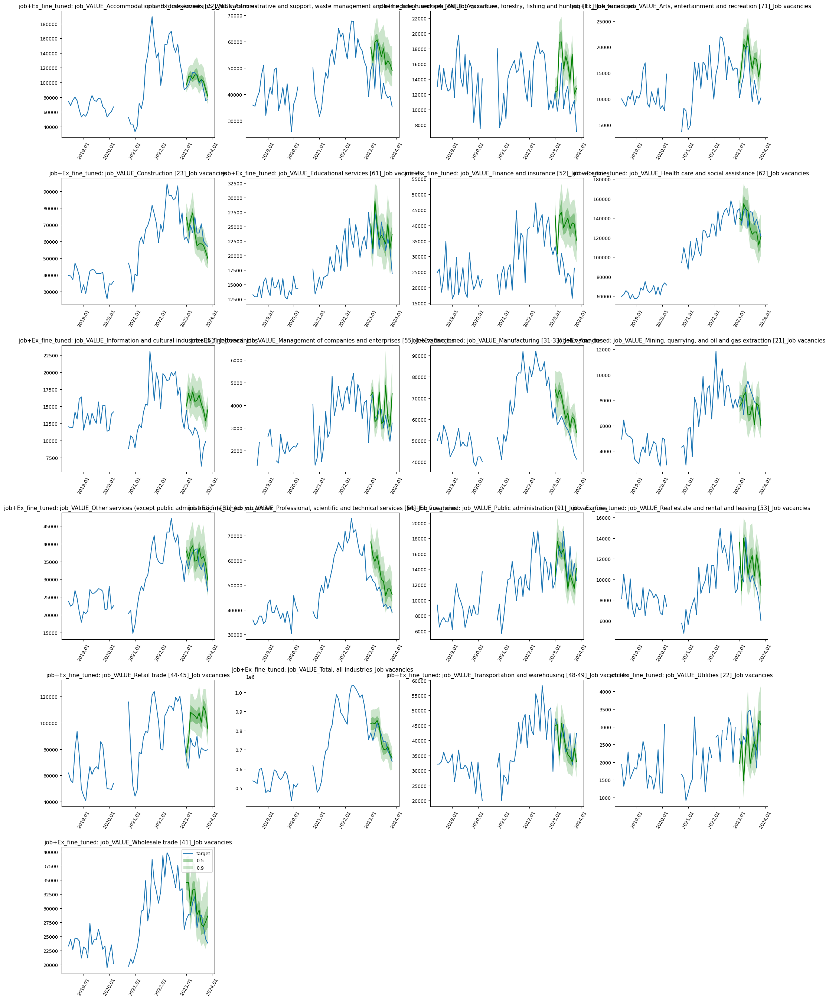

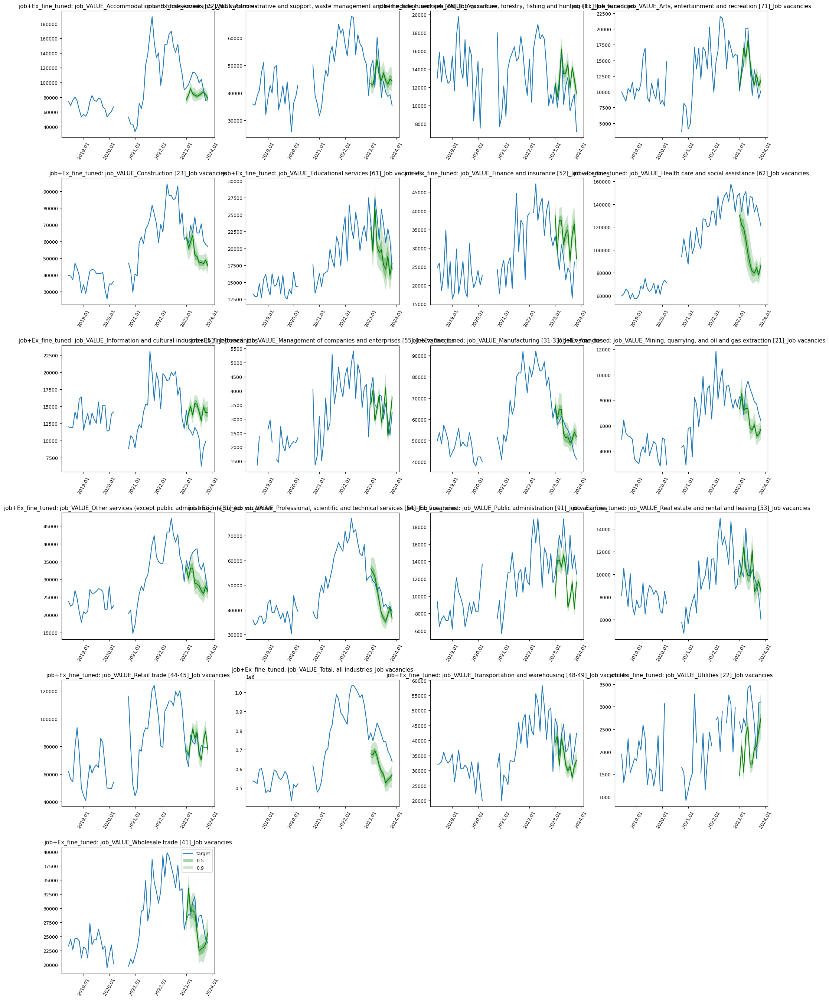

In [17]:
# Create a directory for plots if it doesn't exist
plots_dir = "one-feature-group-at-a-time-j"
os.makedirs(plots_dir, exist_ok=True)
df = pd.read_csv('job_melt_complete_data.csv')

# Define feature groups
feature_groups = [
    [col for col in df.columns if col.startswith(prefix)] 
    for prefix in ['covid', 'indeed', 'inf_VALUE_Bank rate', 'inf_VALUE_Target rate',
                   'cpi_VALUE', 'gdp_VALUE', 'bus', 'job', 'ear', 'emp', 'hou']
]

# Initialize variables
results = []
datasets = [('job+Ex', './job_melt_complete_data.csv', 6)]
model_name = 'lag-llama'
best_scores = {i: float('inf') for i in range(len(feature_groups))}  # Keep track of the best score for each feature group

# Establish baseline performance with no additional features
baseline_result = evaluate_model(model_name, datasets[0][0], datasets[0][1], 'baseline',
                                 with_external=True, context_length_factor=datasets[0][2])
baseline_score = baseline_result.overall_mape
results.append(baseline_result.to_dict())

# Process to evaluate each feature group individually
for dataset_name, path_to_csv, cl in tqdm(datasets, desc="Processing datasets"):
    for i, feature_group in tqdm(enumerate(feature_groups), desc="Evaluating feature groups"):
        current_feature_indices = [i]  # Reset to only the current index
        print(f'Processing {dataset_name} with feature group {i}')

        # Evaluate with the current feature group only
        for model_type in ['fine_tuned']:
            result = evaluate_model(model_name, dataset_name, path_to_csv, model_type,
                                    with_external=True, context_length_factor=cl,
                                    selected_features=feature_group)  # Only use the current feature group
            new_score = result.overall_mape

            # Check if this feature group has the best score so far for its group
            if new_score < best_scores[i]:
                best_scores[i] = new_score
                print(f'New best score for feature group {i}: {best_score}')

            # Convert the result to a dictionary and include the feature group index
            result_dict = result.to_dict(feature_indices=current_feature_indices)
            results.append(result_dict)

            # Save plots and results
            plot_obj = plots_and_evaluation(forecasts=result.forecasts, tss=result.ts,
                                            title=f'{dataset_name}_{model_type}')
            save_path = os.path.join(plots_dir, f"{dataset_name}_{model_type}_with_feature_group_{i}_forecasts.png")
            plot_obj.plot_forcasts_all(save_path=save_path)

# Save final results to CSV
results_df = pd.DataFrame(results)
results_df.to_csv(os.path.join(plots_dir, f"{plots_dir}_evaluation_results.csv"), index=False)

# Output the best score for each feature group
for i, score in best_scores.items():
    print(f"Best score for feature group {i}: {score}")


In [18]:
for i, score in best_scores.items():
    print(f"Best score for feature group {i}: {score}")

Best score for feature group 0: 0.21960057845879422
Best score for feature group 1: 0.1797772072610401
Best score for feature group 2: 0.24851051687678222
Best score for feature group 3: 0.2590574939529618
Best score for feature group 4: 0.1730519042386637
Best score for feature group 5: 0.166134301150516
Best score for feature group 6: 0.2471371994390116
Best score for feature group 7: 0.3152378937898776
Best score for feature group 8: 0.26681867038016704
Best score for feature group 9: 0.20514295968142418
Best score for feature group 10: 0.18131588934819934


# Backward Selection

In [8]:
import os
import pandas as pd
from tqdm import tqdm

# Setup
plots_dir = "backwardS-j-finetuned"
os.makedirs(plots_dir, exist_ok=True)
df = pd.read_csv('job_melt_complete_data.csv')

# Define feature groups
feature_groups = [
    [col for col in df.columns if col.startswith(prefix)] 
    for prefix in ['covid', 'indeed', 'inf_VALUE_Bank rate', 'inf_VALUE_Target rate',
                   'cpi_VALUE', 'gdp_VALUE', 'bus', 'job', 'ear', 'emp', 'hou']
]

# Initialize variables
results = []
datasets = [('job+Ex', './job_melt_complete_data.csv', 5.2)]
model_name = 'lag-llama'
remaining_feature_groups_idxs = list(range(len(feature_groups)))  # Start with all feature groups
best_score = float('inf')

# Baseline performance with all features
all_features = [feature for group in feature_groups for feature in group]
baseline_result = evaluate_model(model_name, datasets[0][0], datasets[0][1], 'fine_tuned',
                                 with_external=True, context_length_factor=datasets[0][2], selected_features=all_features)
baseline_score = baseline_result.all_industries_mape
results.append(baseline_result.to_dict())

# Backward selection process
for dataset_name, path_to_csv, cl in tqdm(datasets, desc="Processing datasets"):
    while remaining_feature_groups_idxs:
        score_improved = False
        for i in list(remaining_feature_groups_idxs):  # Iterate over a copy since we might modify the list
            # Try model without the current feature group
            trial_feature_groups_idxs = [idx for idx in remaining_feature_groups_idxs if idx != i]
            trial_features = [feature for idx in trial_feature_groups_idxs for feature in feature_groups[idx]]

            print(f'Trying without feature group {i}...')
            trial_result = evaluate_model(model_name, dataset_name, path_to_csv, 'fine_tuned',
                                          with_external=True, context_length_factor=cl,
                                          selected_features=trial_features)
            trial_score = trial_result.all_industries_mape

            # Convert the result to a dictionary and include the trial feature indices
            result_dict = trial_result.to_dict(feature_indices=trial_feature_groups_idxs)
            results.append(result_dict)

            # If performance improved, update best score and remove the feature group
            if trial_score < best_score:
                best_score = trial_score
                remaining_feature_groups_idxs = trial_feature_groups_idxs  # Update remaining groups
                score_improved = True
                print(f'Removing feature group {i} improved score to {best_score}')


            results_df = pd.DataFrame(results)
            results_df.to_csv(os.path.join(plots_dir, f"{plots_dir}_evaluation_results.csv"), index=False)

        if not score_improved:
            print("No improvement from removing any more features.")
            break

        

# Compile final selected features based on remaining indices
final_selected_features = [feature for idx in remaining_feature_groups_idxs for feature in feature_groups[idx]]
print("Final selected features:", final_selected_features)


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\Abdul-AzizAlNajjar\CU\DATA 5001\lag-llama\lag_llama\model\module.py:316: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:263.)
  y = F.scaled_dot_product_attention(


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.794
Epoch 0, global step 50: 'val_loss' reached 9.79412 (best 9.79412), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_393\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.151 >= min_delta = 0.0. New best score: 9.643
Epoch 1, global step 100: 'val_loss' reached 9.64271 (best 9.64271), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_393\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.139 >= min_delta = 0.0. New best score: 9.504
Epoch 3, global step 200: 'val_loss' reached 9.50365 (best 9.50365), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_393\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.044 >= min_delta = 0.0. New best score: 9.460
Epoch 9, global step 500: 'val_loss' reached 9.45974 (best 9.45974), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_393\\checkpoints\\epoch=9-step=500.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.134 >= min_delta = 0.0. New best score: 9.326
Epoch 11, global step 600: 'val_loss' reached 9.32606 (best 9.32606), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_393\\checkpoints\\epoch=11-step=600.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 33, global step 1700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 34, global step 1750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 35, global step 1800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 25 records. Best score: 9.326. Signaling Trainer to stop.
Epoch 36, global step 1850: 'val_loss' was not in top 1
Ground truth: 100%|██████████| 21/21 [00:00<00:00, 424.56it/s]
Running evaluation: 21it [00:00, 224.23it/s]


ITS JOB TIME


Processing datasets:   0%|          | 0/1 [00:00<?, ?it/s]

Trying without feature group 0...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.802
Epoch 0, global step 50: 'val_loss' reached 9.80227 (best 9.80227), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_394\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.125 >= min_delta = 0.0. New best score: 9.677
Epoch 1, global step 100: 'val_loss' reached 9.67700 (best 9.67700), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_394\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.174 >= min_delta = 0.0. New best score: 9.503
Epoch 3, global step 200: 'val_loss' reached 9.50332 (best 9.50332), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_394\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.016 >= min_delta = 0.0. New best score: 9.487
Epoch 5, global step 300: 'val_loss' reached 9.48740 (best 9.48740), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_394\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.039 >= min_delta = 0.0. New best score: 9.448
Epoch 6, global step 350: 'val_loss' reached 9.44829 (best 9.44829), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_394\\checkpoints\\epoch=6-step=350.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.149 >= min_delta = 0.0. New best score: 9.299
Epoch 26, global step 1350: 'val_loss' reached 9.29938 (best 9.29938), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_394\\checkpoints\\epoch=26-step=1350.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 33, global step 1700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 34, global step 1750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 35, global step 1800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 36, global step 1850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 37, global step 1900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 38, global step 1950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 39, global step 2000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 40, global step 2050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 41, global step 2100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 42, global step 2150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 43, global step 2200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 44, global step 2250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 45, global step 2300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 46, global step 2350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 47, global step 2400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 48, global step 2450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 49, global step 2500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 50, global step 2550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 25 records. Best score: 9.299. Signaling Trainer to stop.
Epoch 51, global step 2600: 'val_loss' was not in top 1
Ground truth: 100%|██████████| 21/21 [00:00<00:00, 377.73it/s]
Running evaluation: 21it [00:00, 229.17it/s]


ITS JOB TIME
Removing feature group 0 improved score to 0.08600025827234442
Trying without feature group 1...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.860
Epoch 0, global step 50: 'val_loss' reached 9.86036 (best 9.86036), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_395\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.091 >= min_delta = 0.0. New best score: 9.769
Epoch 1, global step 100: 'val_loss' reached 9.76930 (best 9.76930), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_395\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.140 >= min_delta = 0.0. New best score: 9.629
Epoch 2, global step 150: 'val_loss' reached 9.62937 (best 9.62937), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_395\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.120 >= min_delta = 0.0. New best score: 9.509
Epoch 3, global step 200: 'val_loss' reached 9.50947 (best 9.50947), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_395\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.073 >= min_delta = 0.0. New best score: 9.436
Epoch 6, global step 350: 'val_loss' reached 9.43613 (best 9.43613), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_395\\checkpoints\\epoch=6-step=350.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.071 >= min_delta = 0.0. New best score: 9.365
Epoch 7, global step 400: 'val_loss' reached 9.36535 (best 9.36535), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_395\\checkpoints\\epoch=7-step=400.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 25 records. Best score: 9.365. Signaling Trainer to stop.
Epoch 32, global step 1650: 'val_loss' was not in top 1
Ground truth: 100%|██████████| 21/21 [00:00<00:00, 381.96it/s]
Running evaluation: 21it [00:00, 177.17it/s]


ITS JOB TIME
Removing feature group 1 improved score to 0.06634806502949107
Trying without feature group 2...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.922
Epoch 0, global step 50: 'val_loss' reached 9.92204 (best 9.92204), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_396\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.306 >= min_delta = 0.0. New best score: 9.616
Epoch 1, global step 100: 'val_loss' reached 9.61589 (best 9.61589), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_396\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.074 >= min_delta = 0.0. New best score: 9.542
Epoch 5, global step 300: 'val_loss' reached 9.54228 (best 9.54228), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_396\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.143 >= min_delta = 0.0. New best score: 9.399
Epoch 16, global step 850: 'val_loss' reached 9.39947 (best 9.39947), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_396\\checkpoints\\epoch=16-step=850.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.235 >= min_delta = 0.0. New best score: 9.164
Epoch 30, global step 1550: 'val_loss' reached 9.16440 (best 9.16440), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_396\\checkpoints\\epoch=30-step=1550.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 33, global step 1700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 34, global step 1750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 35, global step 1800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 36, global step 1850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 37, global step 1900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 38, global step 1950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 39, global step 2000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 40, global step 2050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 41, global step 2100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 42, global step 2150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 43, global step 2200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 44, global step 2250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 45, global step 2300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 46, global step 2350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 47, global step 2400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 48, global step 2450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 49, global step 2500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 50, global step 2550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 51, global step 2600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 52, global step 2650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 53, global step 2700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 54, global step 2750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 25 records. Best score: 9.164. Signaling Trainer to stop.
Epoch 55, global step 2800: 'val_loss' was not in top 1
Ground truth: 100%|██████████| 21/21 [00:00<00:00, 399.83it/s]
Running evaluation: 21it [00:00, 223.79it/s]


ITS JOB TIME
Trying without feature group 3...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.861
Epoch 0, global step 50: 'val_loss' reached 9.86134 (best 9.86134), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_397\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.235 >= min_delta = 0.0. New best score: 9.627
Epoch 1, global step 100: 'val_loss' reached 9.62661 (best 9.62661), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_397\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.122 >= min_delta = 0.0. New best score: 9.505
Epoch 3, global step 200: 'val_loss' reached 9.50501 (best 9.50501), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_397\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.054 >= min_delta = 0.0. New best score: 9.451
Epoch 5, global step 300: 'val_loss' reached 9.45131 (best 9.45131), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_397\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.085 >= min_delta = 0.0. New best score: 9.366
Epoch 9, global step 500: 'val_loss' reached 9.36649 (best 9.36649), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_397\\checkpoints\\epoch=9-step=500.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.070 >= min_delta = 0.0. New best score: 9.296
Epoch 14, global step 750: 'val_loss' reached 9.29605 (best 9.29605), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_397\\checkpoints\\epoch=14-step=750.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 33, global step 1700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 34, global step 1750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 35, global step 1800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 36, global step 1850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 37, global step 1900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 38, global step 1950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 25 records. Best score: 9.296. Signaling Trainer to stop.
Epoch 39, global step 2000: 'val_loss' was not in top 1
Ground truth: 100%|██████████| 21/21 [00:00<00:00, 248.37it/s]
Running evaluation: 21it [00:00, 147.40it/s]


ITS JOB TIME
Removing feature group 3 improved score to 0.03987614404071461
Trying without feature group 4...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.874
Epoch 0, global step 50: 'val_loss' reached 9.87363 (best 9.87363), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_398\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.217 >= min_delta = 0.0. New best score: 9.656
Epoch 1, global step 100: 'val_loss' reached 9.65649 (best 9.65649), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_398\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.073 >= min_delta = 0.0. New best score: 9.584
Epoch 2, global step 150: 'val_loss' reached 9.58353 (best 9.58353), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_398\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.041 >= min_delta = 0.0. New best score: 9.543
Epoch 3, global step 200: 'val_loss' reached 9.54261 (best 9.54261), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_398\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.020 >= min_delta = 0.0. New best score: 9.522
Epoch 4, global step 250: 'val_loss' reached 9.52212 (best 9.52212), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_398\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.014 >= min_delta = 0.0. New best score: 9.508
Epoch 5, global step 300: 'val_loss' reached 9.50772 (best 9.50772), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_398\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.071 >= min_delta = 0.0. New best score: 9.437
Epoch 6, global step 350: 'val_loss' reached 9.43656 (best 9.43656), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_398\\checkpoints\\epoch=6-step=350.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 25 records. Best score: 9.437. Signaling Trainer to stop.
Epoch 31, global step 1600: 'val_loss' was not in top 1
Ground truth: 100%|██████████| 21/21 [00:00<00:00, 441.77it/s]
Running evaluation: 21it [00:00, 224.08it/s]


ITS JOB TIME
Trying without feature group 5...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.945
Epoch 0, global step 50: 'val_loss' reached 9.94517 (best 9.94517), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_399\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.095 >= min_delta = 0.0. New best score: 9.850
Epoch 1, global step 100: 'val_loss' reached 9.85036 (best 9.85036), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_399\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.131 >= min_delta = 0.0. New best score: 9.719
Epoch 2, global step 150: 'val_loss' reached 9.71886 (best 9.71886), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_399\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.189 >= min_delta = 0.0. New best score: 9.530
Epoch 3, global step 200: 'val_loss' reached 9.52974 (best 9.52974), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_399\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.017 >= min_delta = 0.0. New best score: 9.513
Epoch 6, global step 350: 'val_loss' reached 9.51285 (best 9.51285), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_399\\checkpoints\\epoch=6-step=350.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.116 >= min_delta = 0.0. New best score: 9.397
Epoch 13, global step 700: 'val_loss' reached 9.39691 (best 9.39691), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_399\\checkpoints\\epoch=13-step=700.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.095 >= min_delta = 0.0. New best score: 9.302
Epoch 20, global step 1050: 'val_loss' reached 9.30228 (best 9.30228), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_399\\checkpoints\\epoch=20-step=1050.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 33, global step 1700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 34, global step 1750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 35, global step 1800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 36, global step 1850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 37, global step 1900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 38, global step 1950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 39, global step 2000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 40, global step 2050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 41, global step 2100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 42, global step 2150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 43, global step 2200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 44, global step 2250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 25 records. Best score: 9.302. Signaling Trainer to stop.
Epoch 45, global step 2300: 'val_loss' was not in top 1
Ground truth: 100%|██████████| 21/21 [00:00<00:00, 499.57it/s]
Running evaluation: 21it [00:00, 268.71it/s]


ITS JOB TIME
Trying without feature group 6...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.806
Epoch 0, global step 50: 'val_loss' reached 9.80559 (best 9.80559), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_400\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.090 >= min_delta = 0.0. New best score: 9.716
Epoch 1, global step 100: 'val_loss' reached 9.71564 (best 9.71564), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_400\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.155 >= min_delta = 0.0. New best score: 9.561
Epoch 2, global step 150: 'val_loss' reached 9.56090 (best 9.56090), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_400\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.118 >= min_delta = 0.0. New best score: 9.443
Epoch 5, global step 300: 'val_loss' reached 9.44324 (best 9.44324), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_400\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.113 >= min_delta = 0.0. New best score: 9.330
Epoch 9, global step 500: 'val_loss' reached 9.32985 (best 9.32985), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_400\\checkpoints\\epoch=9-step=500.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 33, global step 1700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 25 records. Best score: 9.330. Signaling Trainer to stop.
Epoch 34, global step 1750: 'val_loss' was not in top 1
Ground truth: 100%|██████████| 21/21 [00:00<00:00, 450.43it/s]
Running evaluation: 21it [00:00, 249.68it/s]


ITS JOB TIME
Trying without feature group 7...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.869
Epoch 0, global step 50: 'val_loss' reached 9.86860 (best 9.86860), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_401\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.262 >= min_delta = 0.0. New best score: 9.606
Epoch 1, global step 100: 'val_loss' reached 9.60629 (best 9.60629), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_401\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.050 >= min_delta = 0.0. New best score: 9.557
Epoch 2, global step 150: 'val_loss' reached 9.55671 (best 9.55671), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_401\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.108 >= min_delta = 0.0. New best score: 9.449
Epoch 4, global step 250: 'val_loss' reached 9.44869 (best 9.44869), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_401\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.129 >= min_delta = 0.0. New best score: 9.319
Epoch 11, global step 600: 'val_loss' reached 9.31934 (best 9.31934), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_401\\checkpoints\\epoch=11-step=600.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 33, global step 1700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 34, global step 1750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 35, global step 1800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 25 records. Best score: 9.319. Signaling Trainer to stop.
Epoch 36, global step 1850: 'val_loss' was not in top 1
Ground truth: 100%|██████████| 21/21 [00:00<00:00, 524.81it/s]
Running evaluation: 21it [00:00, 241.64it/s]


ITS JOB TIME
Removing feature group 7 improved score to 0.03613244403492321
Trying without feature group 8...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.758
Epoch 0, global step 50: 'val_loss' reached 9.75842 (best 9.75842), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_402\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.165 >= min_delta = 0.0. New best score: 9.593
Epoch 1, global step 100: 'val_loss' reached 9.59317 (best 9.59317), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_402\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.037 >= min_delta = 0.0. New best score: 9.556
Epoch 2, global step 150: 'val_loss' reached 9.55639 (best 9.55639), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_402\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.094 >= min_delta = 0.0. New best score: 9.462
Epoch 24, global step 1250: 'val_loss' reached 9.46239 (best 9.46239), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_402\\checkpoints\\epoch=24-step=1250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 33, global step 1700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 34, global step 1750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 35, global step 1800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 36, global step 1850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 37, global step 1900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 38, global step 1950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 39, global step 2000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 40, global step 2050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 41, global step 2100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 42, global step 2150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 43, global step 2200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 44, global step 2250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 45, global step 2300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 46, global step 2350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 47, global step 2400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 48, global step 2450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 25 records. Best score: 9.462. Signaling Trainer to stop.
Epoch 49, global step 2500: 'val_loss' was not in top 1
Ground truth: 100%|██████████| 21/21 [00:00<00:00, 549.52it/s]
Running evaluation: 21it [00:00, 239.57it/s]


ITS JOB TIME
Trying without feature group 9...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.861
Epoch 0, global step 50: 'val_loss' reached 9.86055 (best 9.86055), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_403\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.243 >= min_delta = 0.0. New best score: 9.618
Epoch 1, global step 100: 'val_loss' reached 9.61773 (best 9.61773), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_403\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.049 >= min_delta = 0.0. New best score: 9.568
Epoch 2, global step 150: 'val_loss' reached 9.56835 (best 9.56835), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_403\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.019 >= min_delta = 0.0. New best score: 9.549
Epoch 3, global step 200: 'val_loss' reached 9.54895 (best 9.54895), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_403\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.032 >= min_delta = 0.0. New best score: 9.517
Epoch 4, global step 250: 'val_loss' reached 9.51655 (best 9.51655), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_403\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.034 >= min_delta = 0.0. New best score: 9.482
Epoch 5, global step 300: 'val_loss' reached 9.48220 (best 9.48220), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_403\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.038 >= min_delta = 0.0. New best score: 9.444
Epoch 24, global step 1250: 'val_loss' reached 9.44388 (best 9.44388), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_403\\checkpoints\\epoch=24-step=1250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 33, global step 1700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 34, global step 1750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 35, global step 1800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 36, global step 1850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 37, global step 1900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 38, global step 1950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 39, global step 2000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 40, global step 2050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 41, global step 2100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 42, global step 2150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 43, global step 2200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 44, global step 2250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 45, global step 2300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 46, global step 2350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 47, global step 2400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 48, global step 2450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 25 records. Best score: 9.444. Signaling Trainer to stop.
Epoch 49, global step 2500: 'val_loss' was not in top 1
Ground truth: 100%|██████████| 21/21 [00:00<00:00, 446.54it/s]
Running evaluation: 21it [00:00, 238.04it/s]


ITS JOB TIME
Trying without feature group 10...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.895
Epoch 0, global step 50: 'val_loss' reached 9.89452 (best 9.89452), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_404\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.177 >= min_delta = 0.0. New best score: 9.718
Epoch 1, global step 100: 'val_loss' reached 9.71778 (best 9.71778), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_404\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.135 >= min_delta = 0.0. New best score: 9.583
Epoch 2, global step 150: 'val_loss' reached 9.58316 (best 9.58316), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_404\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.022 >= min_delta = 0.0. New best score: 9.561
Epoch 3, global step 200: 'val_loss' reached 9.56078 (best 9.56078), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_404\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.030 >= min_delta = 0.0. New best score: 9.531
Epoch 4, global step 250: 'val_loss' reached 9.53125 (best 9.53125), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_404\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 9.525
Epoch 5, global step 300: 'val_loss' reached 9.52487 (best 9.52487), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_404\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.146 >= min_delta = 0.0. New best score: 9.379
Epoch 10, global step 550: 'val_loss' reached 9.37874 (best 9.37874), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_404\\checkpoints\\epoch=10-step=550.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.068 >= min_delta = 0.0. New best score: 9.311
Epoch 31, global step 1600: 'val_loss' reached 9.31060 (best 9.31060), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_404\\checkpoints\\epoch=31-step=1600.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 33, global step 1700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 34, global step 1750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 35, global step 1800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 36, global step 1850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 37, global step 1900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 38, global step 1950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 39, global step 2000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 40, global step 2050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 41, global step 2100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 42, global step 2150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 43, global step 2200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 44, global step 2250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 45, global step 2300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.020 >= min_delta = 0.0. New best score: 9.290
Epoch 46, global step 2350: 'val_loss' reached 9.29029 (best 9.29029), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_404\\checkpoints\\epoch=46-step=2350.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 47, global step 2400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 48, global step 2450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 49, global step 2500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 50, global step 2550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 51, global step 2600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 52, global step 2650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 53, global step 2700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 54, global step 2750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.031 >= min_delta = 0.0. New best score: 9.259
Epoch 55, global step 2800: 'val_loss' reached 9.25936 (best 9.25936), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_404\\checkpoints\\epoch=55-step=2800.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 56, global step 2850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 57, global step 2900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 58, global step 2950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 59, global step 3000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 60, global step 3050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 61, global step 3100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 62, global step 3150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 63, global step 3200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 64, global step 3250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 65, global step 3300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 66, global step 3350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 67, global step 3400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 68, global step 3450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 69, global step 3500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 70, global step 3550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 71, global step 3600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 72, global step 3650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 73, global step 3700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 74, global step 3750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 75, global step 3800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 76, global step 3850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 77, global step 3900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 78, global step 3950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 79, global step 4000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 25 records. Best score: 9.259. Signaling Trainer to stop.
Epoch 80, global step 4050: 'val_loss' was not in top 1
Ground truth: 100%|██████████| 21/21 [00:00<00:00, 566.00it/s]
Running evaluation: 21it [00:00, 257.02it/s]


ITS JOB TIME
Trying without feature group 2...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.914
Epoch 0, global step 50: 'val_loss' reached 9.91399 (best 9.91399), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_405\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.231 >= min_delta = 0.0. New best score: 9.683
Epoch 1, global step 100: 'val_loss' reached 9.68316 (best 9.68316), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_405\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.042 >= min_delta = 0.0. New best score: 9.641
Epoch 2, global step 150: 'val_loss' reached 9.64134 (best 9.64134), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_405\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.065 >= min_delta = 0.0. New best score: 9.576
Epoch 3, global step 200: 'val_loss' reached 9.57596 (best 9.57596), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_405\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 9.571
Epoch 4, global step 250: 'val_loss' reached 9.57079 (best 9.57079), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_405\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.099 >= min_delta = 0.0. New best score: 9.472
Epoch 5, global step 300: 'val_loss' reached 9.47217 (best 9.47217), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_405\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 25 records. Best score: 9.472. Signaling Trainer to stop.
Epoch 30, global step 1550: 'val_loss' was not in top 1
Ground truth: 100%|██████████| 21/21 [00:00<00:00, 502.71it/s]
Running evaluation: 21it [00:00, 269.50it/s]


ITS JOB TIME
Trying without feature group 4...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.860
Epoch 0, global step 50: 'val_loss' reached 9.86029 (best 9.86029), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_406\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.228 >= min_delta = 0.0. New best score: 9.633
Epoch 1, global step 100: 'val_loss' reached 9.63276 (best 9.63276), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_406\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.051 >= min_delta = 0.0. New best score: 9.581
Epoch 2, global step 150: 'val_loss' reached 9.58150 (best 9.58150), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_406\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.017 >= min_delta = 0.0. New best score: 9.564
Epoch 4, global step 250: 'val_loss' reached 9.56419 (best 9.56419), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_406\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.116 >= min_delta = 0.0. New best score: 9.448
Epoch 5, global step 300: 'val_loss' reached 9.44784 (best 9.44784), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_406\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.026 >= min_delta = 0.0. New best score: 9.422
Epoch 6, global step 350: 'val_loss' reached 9.42207 (best 9.42207), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_406\\checkpoints\\epoch=6-step=350.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 25 records. Best score: 9.422. Signaling Trainer to stop.
Epoch 31, global step 1600: 'val_loss' was not in top 1
Ground truth: 100%|██████████| 21/21 [00:00<00:00, 535.82it/s]
Running evaluation: 21it [00:00, 257.47it/s]


ITS JOB TIME
Trying without feature group 5...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.949
Epoch 0, global step 50: 'val_loss' reached 9.94893 (best 9.94893), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_407\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.251 >= min_delta = 0.0. New best score: 9.698
Epoch 1, global step 100: 'val_loss' reached 9.69811 (best 9.69811), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_407\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.134 >= min_delta = 0.0. New best score: 9.564
Epoch 2, global step 150: 'val_loss' reached 9.56441 (best 9.56441), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_407\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.042 >= min_delta = 0.0. New best score: 9.523
Epoch 10, global step 550: 'val_loss' reached 9.52288 (best 9.52288), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_407\\checkpoints\\epoch=10-step=550.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 33, global step 1700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 34, global step 1750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 25 records. Best score: 9.523. Signaling Trainer to stop.
Epoch 35, global step 1800: 'val_loss' was not in top 1
Ground truth: 100%|██████████| 21/21 [00:00<00:00, 498.82it/s]
Running evaluation: 21it [00:00, 242.34it/s]


ITS JOB TIME
Trying without feature group 6...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.844
Epoch 0, global step 50: 'val_loss' reached 9.84386 (best 9.84386), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_408\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.104 >= min_delta = 0.0. New best score: 9.739
Epoch 1, global step 100: 'val_loss' reached 9.73940 (best 9.73940), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_408\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.037 >= min_delta = 0.0. New best score: 9.703
Epoch 2, global step 150: 'val_loss' reached 9.70269 (best 9.70269), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_408\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.088 >= min_delta = 0.0. New best score: 9.615
Epoch 3, global step 200: 'val_loss' reached 9.61483 (best 9.61483), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_408\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.117 >= min_delta = 0.0. New best score: 9.498
Epoch 4, global step 250: 'val_loss' reached 9.49804 (best 9.49804), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_408\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.246 >= min_delta = 0.0. New best score: 9.252
Epoch 20, global step 1050: 'val_loss' reached 9.25209 (best 9.25209), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_408\\checkpoints\\epoch=20-step=1050.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 33, global step 1700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 34, global step 1750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 35, global step 1800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 36, global step 1850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 37, global step 1900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 38, global step 1950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 39, global step 2000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 40, global step 2050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 41, global step 2100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 42, global step 2150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 43, global step 2200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 44, global step 2250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 25 records. Best score: 9.252. Signaling Trainer to stop.
Epoch 45, global step 2300: 'val_loss' was not in top 1
Ground truth: 100%|██████████| 21/21 [00:00<00:00, 526.15it/s]
Running evaluation: 21it [00:00, 255.55it/s]


ITS JOB TIME
Trying without feature group 8...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.813
Epoch 0, global step 50: 'val_loss' reached 9.81303 (best 9.81303), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_409\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.183 >= min_delta = 0.0. New best score: 9.630
Epoch 1, global step 100: 'val_loss' reached 9.63040 (best 9.63040), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_409\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.070 >= min_delta = 0.0. New best score: 9.560
Epoch 2, global step 150: 'val_loss' reached 9.56030 (best 9.56030), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_409\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.064 >= min_delta = 0.0. New best score: 9.497
Epoch 3, global step 200: 'val_loss' reached 9.49657 (best 9.49657), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_409\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 25 records. Best score: 9.497. Signaling Trainer to stop.
Epoch 28, global step 1450: 'val_loss' was not in top 1
Ground truth: 100%|██████████| 21/21 [00:00<00:00, 527.91it/s]
Running evaluation: 21it [00:00, 256.90it/s]


ITS JOB TIME
Trying without feature group 9...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.823
Epoch 0, global step 50: 'val_loss' reached 9.82323 (best 9.82323), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_410\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.118 >= min_delta = 0.0. New best score: 9.705
Epoch 1, global step 100: 'val_loss' reached 9.70495 (best 9.70495), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_410\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.097 >= min_delta = 0.0. New best score: 9.608
Epoch 2, global step 150: 'val_loss' reached 9.60810 (best 9.60810), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_410\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.069 >= min_delta = 0.0. New best score: 9.539
Epoch 3, global step 200: 'val_loss' reached 9.53935 (best 9.53935), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_410\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.056 >= min_delta = 0.0. New best score: 9.483
Epoch 8, global step 450: 'val_loss' reached 9.48345 (best 9.48345), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_410\\checkpoints\\epoch=8-step=450.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 25 records. Best score: 9.483. Signaling Trainer to stop.
Epoch 33, global step 1700: 'val_loss' was not in top 1
Ground truth: 100%|██████████| 21/21 [00:00<00:00, 488.43it/s]
Running evaluation: 21it [00:00, 246.21it/s]


ITS JOB TIME
Trying without feature group 10...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.939
Epoch 0, global step 50: 'val_loss' reached 9.93939 (best 9.93939), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_411\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.225 >= min_delta = 0.0. New best score: 9.714
Epoch 1, global step 100: 'val_loss' reached 9.71400 (best 9.71400), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_411\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.153 >= min_delta = 0.0. New best score: 9.561
Epoch 2, global step 150: 'val_loss' reached 9.56101 (best 9.56101), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_411\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.126 >= min_delta = 0.0. New best score: 9.435
Epoch 10, global step 550: 'val_loss' reached 9.43502 (best 9.43502), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_411\\checkpoints\\epoch=10-step=550.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 33, global step 1700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 34, global step 1750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.164 >= min_delta = 0.0. New best score: 9.271
Epoch 35, global step 1800: 'val_loss' reached 9.27116 (best 9.27116), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_411\\checkpoints\\epoch=35-step=1800.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 36, global step 1850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 37, global step 1900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 38, global step 1950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 39, global step 2000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 40, global step 2050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 41, global step 2100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.033 >= min_delta = 0.0. New best score: 9.238
Epoch 42, global step 2150: 'val_loss' reached 9.23778 (best 9.23778), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_411\\checkpoints\\epoch=42-step=2150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 43, global step 2200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 44, global step 2250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 45, global step 2300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 46, global step 2350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 47, global step 2400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 48, global step 2450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 49, global step 2500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 50, global step 2550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 51, global step 2600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 52, global step 2650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 53, global step 2700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 54, global step 2750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 55, global step 2800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 56, global step 2850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 57, global step 2900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 58, global step 2950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 59, global step 3000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 60, global step 3050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 61, global step 3100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 62, global step 3150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 63, global step 3200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 64, global step 3250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 65, global step 3300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 66, global step 3350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 25 records. Best score: 9.238. Signaling Trainer to stop.
Epoch 67, global step 3400: 'val_loss' was not in top 1
Ground truth: 100%|██████████| 21/21 [00:00<00:00, 552.46it/s]
Running evaluation: 21it [00:00, 251.20it/s]
Processing datasets: 100%|██████████| 1/1 [38:10<00:00, 2290.31s/it]

ITS JOB TIME
No improvement from removing any more features.
Final selected features: ['inf_VALUE_Bank rate', 'cpi_VALUE', 'gdp_VALUE', 'bus_EMPLOY', 'bus_COSTS', 'bus_OUTPUTS', 'ear_VALUE_Accommodation and food services [72]', 'ear_VALUE_Administrative and support, waste management and remediation services [56]', 'ear_VALUE_Arts, entertainment and recreation [71]', 'ear_VALUE_Construction [23]', 'ear_VALUE_Educational services [61,611]', 'ear_VALUE_Finance and insurance [52]', 'ear_VALUE_Forestry, logging and support [11N]', 'ear_VALUE_Goods producing industries [11-33N]', 'ear_VALUE_Health care and social assistance [62]', 'ear_VALUE_Industrial aggregate excluding unclassified businesses [11-91N]', 'ear_VALUE_Information and cultural industries [51]', 'ear_VALUE_Management of companies and enterprises [55,551,5511]', 'ear_VALUE_Manufacturing [31-33]', 'ear_VALUE_Mining, quarrying, and oil and gas extraction [21]', 'ear_VALUE_Other services (except public administration) [81]', 'ear_V

In [28]:
# Compile final selected features based on remaining indices
final_selected_features = [feature for idx in remaining_feature_groups_idxs for feature in feature_groups[idx]]
print("Final selected features:", final_selected_features)

Final selected features: ['inf_VALUE_Bank rate', 'cpi_VALUE', 'gdp_VALUE', 'bus_EMPLOY', 'bus_COSTS', 'bus_OUTPUTS', 'ear_VALUE_Accommodation and food services [72]', 'ear_VALUE_Administrative and support, waste management and remediation services [56]', 'ear_VALUE_Arts, entertainment and recreation [71]', 'ear_VALUE_Construction [23]', 'ear_VALUE_Educational services [61,611]', 'ear_VALUE_Finance and insurance [52]', 'ear_VALUE_Forestry, logging and support [11N]', 'ear_VALUE_Goods producing industries [11-33N]', 'ear_VALUE_Health care and social assistance [62]', 'ear_VALUE_Industrial aggregate excluding unclassified businesses [11-91N]', 'ear_VALUE_Information and cultural industries [51]', 'ear_VALUE_Management of companies and enterprises [55,551,5511]', 'ear_VALUE_Manufacturing [31-33]', 'ear_VALUE_Mining, quarrying, and oil and gas extraction [21]', 'ear_VALUE_Other services (except public administration) [81]', 'ear_VALUE_Professional, scientific and technical services [54,541]

In [27]:
# Compile final selected features based on remaining indices
feature_groups = [
    [col for col in df.columns if col.startswith(prefix)] 
    for prefix in ['covid', 'indeed', 'inf_VALUE_Bank rate', 'inf_VALUE_Target rate',
                   'cpi_VALUE', 'gdp_VALUE', 'bus', 'job', 'ear', 'emp', 'hou']
]
print(remaining_feature_groups_idxs)
final_selected_features = [feature for idx in remaining_feature_groups_idxs for feature in feature_groups[idx]]
for i in remaining_feature_groups_idxs:
    print(feature_groups[i])

[2, 4, 5, 6, 8, 9, 10]
['inf_VALUE_Bank rate']
['cpi_VALUE']
['gdp_VALUE']
['bus_EMPLOY', 'bus_COSTS', 'bus_OUTPUTS']
['ear_VALUE_Accommodation and food services [72]', 'ear_VALUE_Administrative and support, waste management and remediation services [56]', 'ear_VALUE_Arts, entertainment and recreation [71]', 'ear_VALUE_Construction [23]', 'ear_VALUE_Educational services [61,611]', 'ear_VALUE_Finance and insurance [52]', 'ear_VALUE_Forestry, logging and support [11N]', 'ear_VALUE_Goods producing industries [11-33N]', 'ear_VALUE_Health care and social assistance [62]', 'ear_VALUE_Industrial aggregate excluding unclassified businesses [11-91N]', 'ear_VALUE_Information and cultural industries [51]', 'ear_VALUE_Management of companies and enterprises [55,551,5511]', 'ear_VALUE_Manufacturing [31-33]', 'ear_VALUE_Mining, quarrying, and oil and gas extraction [21]', 'ear_VALUE_Other services (except public administration) [81]', 'ear_VALUE_Professional, scientific and technical services [54,54

# Fine tuning cl

In [8]:
plots_dir = "Fine_tuning_CL_with_val_split-EEH-3-baseline"
os.makedirs(plots_dir, exist_ok=True)
torch.cuda.empty_cache()

# Evaluate models and save plots
results = []
model_name = 'lag-llama'
datasets = [('Earn', 'Project Data\Data_without_external\Earnings_ByIndustry.csv'), ('Hours', 'Project Data\Data_without_external\Hours_ByIndustry.csv')]
context_length_factors = np.arange(15.2, 20, 0.4).tolist()
print(context_length_factors)
for dataset_name, path_to_csv in tqdm(datasets, desc=f"Processing datasets"): 
    for cl in tqdm(context_length_factors, desc=f'Context length'):
        torch.cuda.empty_cache()   
        print(f'processing{dataset_name} with {cl} context_length factor')   
        for model_type in ['baseline']:
            result = evaluate_model(model_name, dataset_name, path_to_csv, model_type,
                                    with_external=False, context_length_factor=cl,batch_size=32,
                                    selected_features=None)
            results.append(result)

            # Save plots
            # plot_obj = plots_and_evaluation(forecasts= result.forecasts, tss= result.ts, title = dataset_name+'_'+model_type)
            # save_path = os.path.join(plots_dir, f"{result.dataset_name}_{cl}_{result.model_type}_forecasts.png")
            # plot_obj.plot_forcasts_all(save_path=save_path)
        # Create DataFrame
        results_df = pd.DataFrame([result.to_dict() for result in results])
        # Save results to CSV
        results_df.to_csv(plots_dir+'\eh-5-evaluation_results.csv', index=False)

[0.1, 0.5, 0.9, 1.3000000000000003, 1.7000000000000002, 2.1, 2.5000000000000004, 2.9000000000000004, 3.3000000000000003, 3.7, 4.1, 4.5, 4.9, 5.3, 5.7, 6.1, 6.5, 6.9, 7.3, 7.7, 8.1, 8.5, 8.9, 9.3, 9.700000000000001, 10.1, 10.5, 10.9, 11.3, 11.700000000000001, 12.1, 12.5, 12.9, 13.3, 13.700000000000001, 14.1, 14.5, 14.9, 15.3, 15.700000000000001, 16.1, 16.500000000000004, 16.900000000000002, 17.3, 17.700000000000003, 18.1, 18.500000000000004, 18.900000000000002, 19.300000000000004, 19.700000000000003]


Processing datasets:   0%|          | 0/1 [00:00<?, ?it/s]

Context length:   0%|          | 0/50 [00:00<?, ?it/s]

processingHours with 0.1 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

c:\Users\Abdul-AzizAlNajjar\CU\DATA 5001\lag-llama\lag_llama\model\module.py:316: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:263.)
  y = F.scaled_dot_product_attention(


Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 213.08it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 0.5 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 256.77it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 0.9 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 251.20it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 1.3000000000000003 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 263.28it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 1.7000000000000002 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 249.99it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 2.1 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 208.34it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 2.5000000000000004 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 243.06it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 2.9000000000000004 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 263.24it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 3.3000000000000003 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 254.31it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 3.7 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 232.41it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 4.1 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 251.20it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 4.5 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 193.21it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 4.9 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 239.56it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 5.3 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 260.02it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 5.7 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 243.04it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 6.1 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 230.21it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 6.5 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 255.80it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 6.9 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 212.61it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 7.3 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 254.11it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 7.7 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 258.68it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 8.1 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 265.06it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 8.5 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 245.73it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 8.9 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 241.39it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 9.3 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 248.30it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 9.700000000000001 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 237.63it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 10.1 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 251.25it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 10.5 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 251.86it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 10.9 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 189.33it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 11.3 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 155.95it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 11.700000000000001 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 149.02it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 12.1 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 160.94it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 12.5 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 157.97it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 12.9 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 185.62it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 13.3 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 183.93it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 13.700000000000001 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 182.43it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 14.1 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 195.52it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 14.5 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 145.20it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 14.9 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 157.98it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 15.3 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 187.81it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 15.700000000000001 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 173.24it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 16.1 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 165.34it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 16.500000000000004 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 143.74it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 16.900000000000002 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 158.95it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 17.3 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 162.98it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 17.700000000000003 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 182.93it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 18.1 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 141.40it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 18.500000000000004 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 179.53it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 18.900000000000002 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 260.09it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 19.300000000000004 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 212.50it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

processingHours with 19.700000000000003 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]


c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 188.80it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: User

In [8]:
plots_dir = "Fine_tuning_CL_with_val_split-j-2-finetuned"
os.makedirs(plots_dir, exist_ok=True)

# Evaluate models and save plots
results = []
model_name = 'lag-llama'
Job_datasets = [('job', 'Project Data\Data_without_external\JobVacancies_ByIndustry.csv')]
context_length_factors = np.arange(0.2, 10.5, 0.2).tolist()
print(context_length_factors)
for dataset_name, path_to_csv in tqdm(Job_datasets, desc=f"Processing datasets"): 
    for cl in tqdm(context_length_factors, desc=f'Context length'):

        print(f'processing{dataset_name} with {cl} context_length factor')   
        for model_type in ['fine_tuned']:
            result = evaluate_model(model_name, dataset_name, path_to_csv, model_type,
                                    with_external=False, context_length_factor=cl,
                                    selected_features=None)
            results.append(result)

            # Save plots
            # plot_obj = plots_and_evaluation(forecasts= result.forecasts, tss= result.ts, title = dataset_name+'_'+model_type)
            # save_path = os.path.join(plots_dir, f"{result.dataset_name}_{cl}_{result.model_type}_forecasts.png")
            # plot_obj.plot_forcasts_all(save_path=save_path)
        # Create DataFrame
        results_df = pd.DataFrame([result.to_dict() for result in results])
        # Save results to CSV
        results_df.to_csv(plots_dir+'\evaluation_results.csv', index=False)

[0.2, 0.4, 0.6000000000000001, 0.8, 1.0, 1.2, 1.4000000000000001, 1.6, 1.8, 2.0, 2.2, 2.4000000000000004, 2.6000000000000005, 2.8000000000000003, 3.0000000000000004, 3.2, 3.4000000000000004, 3.6000000000000005, 3.8000000000000003, 4.0, 4.2, 4.4, 4.6000000000000005, 4.800000000000001, 5.000000000000001, 5.2, 5.4, 5.6000000000000005, 5.800000000000001, 6.000000000000001, 6.2, 6.4, 6.6000000000000005, 6.800000000000001, 7.000000000000001, 7.2, 7.4, 7.6000000000000005, 7.800000000000001, 8.0, 8.2, 8.4, 8.6, 8.799999999999999, 9.0, 9.2, 9.4, 9.6, 9.8, 10.0, 10.2, 10.4]


Processing datasets:   0%|          | 0/1 [00:00<?, ?it/s]

processingjob with 0.2 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 10.145
Epoch 0, global step 50: 'val_loss' reached 10.14515 (best 10.14515), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_340\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 1, global step 100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.154 >= min_delta = 0.0. New best score: 9.991
Epoch 3, global step 200: 'val_loss' reached 9.99087 (best 9.99087), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_340\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.075 >= min_delta = 0.0. New best score: 9.916
Epoch 4, global step 250: 'val_loss' reached 9.91613 (best 9.91613), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_340\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.916. Signaling Trainer to stop.
Epoch 19, global step 1000: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:00<00:00, 31.59it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 4208.73it/s]

Running evaluation: 21it [00:00, 292.45it/s]


ITS JOB TIME
processingjob with 0.4 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 10.128
Epoch 0, global step 50: 'val_loss' reached 10.12798 (best 10.12798), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_341\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 1, global step 100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.087 >= min_delta = 0.0. New best score: 10.041
Epoch 2, global step 150: 'val_loss' reached 10.04103 (best 10.04103), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_341\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 10.041. Signaling Trainer to stop.
Epoch 17, global step 900: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:00<00:00, 28.89it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3523.78it/s]

Running evaluation: 21it [00:00, 281.36it/s]


ITS JOB TIME
processingjob with 0.6000000000000001 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 10.152
Epoch 0, global step 50: 'val_loss' reached 10.15224 (best 10.15224), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_342\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.055 >= min_delta = 0.0. New best score: 10.097
Epoch 1, global step 100: 'val_loss' reached 10.09724 (best 10.09724), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_342\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.017 >= min_delta = 0.0. New best score: 10.081
Epoch 2, global step 150: 'val_loss' reached 10.08062 (best 10.08062), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_342\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.025 >= min_delta = 0.0. New best score: 10.056
Epoch 6, global step 350: 'val_loss' reached 10.05574 (best 10.05574), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_342\\checkpoints\\epoch=6-step=350.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.129 >= min_delta = 0.0. New best score: 9.926
Epoch 8, global step 450: 'val_loss' reached 9.92631 (best 9.92631), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_342\\checkpoints\\epoch=8-step=450.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.063 >= min_delta = 0.0. New best score: 9.863
Epoch 10, global step 550: 'val_loss' reached 9.86324 (best 9.86324), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_342\\checkpoints\\epoch=10-step=550.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.863. Signaling Trainer to stop.
Epoch 25, global step 1300: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:00<00:00, 25.02it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 2624.49it/s]

Running evaluation: 21it [00:00, 232.25it/s]


ITS JOB TIME
processingjob with 0.8 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 10.147
Epoch 0, global step 50: 'val_loss' reached 10.14732 (best 10.14732), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_343\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.099 >= min_delta = 0.0. New best score: 10.048
Epoch 1, global step 100: 'val_loss' reached 10.04797 (best 10.04797), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_343\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 10.044
Epoch 7, global step 400: 'val_loss' reached 10.04438 (best 10.04438), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_343\\checkpoints\\epoch=7-step=400.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 10.044. Signaling Trainer to stop.
Epoch 22, global step 1150: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:00<00:00, 24.07it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3186.24it/s]

Running evaluation: 21it [00:00, 208.19it/s]


ITS JOB TIME
processingjob with 1.0 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 10.125
Epoch 0, global step 50: 'val_loss' reached 10.12461 (best 10.12461), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_344\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 1, global step 100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.054 >= min_delta = 0.0. New best score: 10.071
Epoch 2, global step 150: 'val_loss' reached 10.07062 (best 10.07062), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_344\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.021 >= min_delta = 0.0. New best score: 10.050
Epoch 4, global step 250: 'val_loss' reached 10.05007 (best 10.05007), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_344\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 10.050. Signaling Trainer to stop.
Epoch 19, global step 1000: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:00<00:00, 21.72it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3477.18it/s]

Running evaluation: 21it [00:00, 223.53it/s]


ITS JOB TIME
processingjob with 1.2 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 10.058
Epoch 0, global step 50: 'val_loss' reached 10.05757 (best 10.05757), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_345\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.012 >= min_delta = 0.0. New best score: 10.046
Epoch 1, global step 100: 'val_loss' reached 10.04588 (best 10.04588), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_345\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 10.037
Epoch 2, global step 150: 'val_loss' reached 10.03716 (best 10.03716), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_345\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.037 >= min_delta = 0.0. New best score: 10.000
Epoch 3, global step 200: 'val_loss' reached 9.99996 (best 9.99996), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_345\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.029 >= min_delta = 0.0. New best score: 9.971
Epoch 7, global step 400: 'val_loss' reached 9.97106 (best 9.97106), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_345\\checkpoints\\epoch=7-step=400.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.971. Signaling Trainer to stop.
Epoch 22, global step 1150: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:01<00:00, 20.25it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 2329.24it/s]

Running evaluation: 21it [00:00, 169.72it/s]


ITS JOB TIME
processingjob with 1.4000000000000001 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 10.108
Epoch 0, global step 50: 'val_loss' reached 10.10776 (best 10.10776), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_346\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.057 >= min_delta = 0.0. New best score: 10.050
Epoch 1, global step 100: 'val_loss' reached 10.05041 (best 10.05041), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_346\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.056 >= min_delta = 0.0. New best score: 9.995
Epoch 2, global step 150: 'val_loss' reached 9.99451 (best 9.99451), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_346\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.995. Signaling Trainer to stop.
Epoch 17, global step 900: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:01<00:00, 19.00it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3007.29it/s]

Running evaluation: 21it [00:00, 153.00it/s]


ITS JOB TIME
processingjob with 1.6 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 10.125
Epoch 0, global step 50: 'val_loss' reached 10.12526 (best 10.12526), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_347\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.119 >= min_delta = 0.0. New best score: 10.006
Epoch 1, global step 100: 'val_loss' reached 10.00627 (best 10.00627), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_347\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 10.006. Signaling Trainer to stop.
Epoch 16, global step 850: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:01<00:00, 17.87it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3675.38it/s]

Running evaluation: 21it [00:00, 163.00it/s]


ITS JOB TIME
processingjob with 1.8 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 10.089
Epoch 0, global step 50: 'val_loss' reached 10.08878 (best 10.08878), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_348\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.114 >= min_delta = 0.0. New best score: 9.975
Epoch 1, global step 100: 'val_loss' reached 9.97489 (best 9.97489), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_348\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.021 >= min_delta = 0.0. New best score: 9.954
Epoch 2, global step 150: 'val_loss' reached 9.95437 (best 9.95437), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_348\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.954. Signaling Trainer to stop.
Epoch 17, global step 900: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:01<00:00, 16.81it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 1908.65it/s]

Running evaluation: 21it [00:00, 189.97it/s]


ITS JOB TIME
processingjob with 2.0 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 10.055
Epoch 0, global step 50: 'val_loss' reached 10.05542 (best 10.05542), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_349\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 1, global step 100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.055 >= min_delta = 0.0. New best score: 10.001
Epoch 2, global step 150: 'val_loss' reached 10.00087 (best 10.00087), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_349\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.013 >= min_delta = 0.0. New best score: 9.988
Epoch 4, global step 250: 'val_loss' reached 9.98787 (best 9.98787), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_349\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.988. Signaling Trainer to stop.
Epoch 19, global step 1000: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:01<00:00, 15.56it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 2332.20it/s]

Running evaluation: 21it [00:00, 181.48it/s]


ITS JOB TIME
processingjob with 2.2 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 10.061
Epoch 0, global step 50: 'val_loss' reached 10.06095 (best 10.06095), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_350\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.133 >= min_delta = 0.0. New best score: 9.928
Epoch 1, global step 100: 'val_loss' reached 9.92786 (best 9.92786), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_350\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.035 >= min_delta = 0.0. New best score: 9.893
Epoch 2, global step 150: 'val_loss' reached 9.89278 (best 9.89278), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_350\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.011 >= min_delta = 0.0. New best score: 9.882
Epoch 4, global step 250: 'val_loss' reached 9.88212 (best 9.88212), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_350\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.112 >= min_delta = 0.0. New best score: 9.770
Epoch 9, global step 500: 'val_loss' reached 9.77011 (best 9.77011), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_350\\checkpoints\\epoch=9-step=500.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.770. Signaling Trainer to stop.
Epoch 24, global step 1250: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:01<00:00, 14.50it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3473.89it/s]

Running evaluation: 21it [00:00, 247.55it/s]


ITS JOB TIME
processingjob with 2.4000000000000004 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 10.051
Epoch 0, global step 50: 'val_loss' reached 10.05109 (best 10.05109), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_351\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.159 >= min_delta = 0.0. New best score: 9.892
Epoch 1, global step 100: 'val_loss' reached 9.89223 (best 9.89223), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_351\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.027 >= min_delta = 0.0. New best score: 9.865
Epoch 2, global step 150: 'val_loss' reached 9.86537 (best 9.86537), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_351\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.057 >= min_delta = 0.0. New best score: 9.808
Epoch 4, global step 250: 'val_loss' reached 9.80814 (best 9.80814), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_351\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 9.800
Epoch 9, global step 500: 'val_loss' reached 9.80011 (best 9.80011), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_351\\checkpoints\\epoch=9-step=500.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.320 >= min_delta = 0.0. New best score: 9.480
Epoch 19, global step 1000: 'val_loss' reached 9.48028 (best 9.48028), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_351\\checkpoints\\epoch=19-step=1000.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 33, global step 1700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.480. Signaling Trainer to stop.
Epoch 34, global step 1750: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:01<00:00, 13.81it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3501.09it/s]

Running evaluation: 21it [00:00, 256.79it/s]


ITS JOB TIME
processingjob with 2.6000000000000005 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 10.172
Epoch 0, global step 50: 'val_loss' reached 10.17240 (best 10.17240), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_352\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.277 >= min_delta = 0.0. New best score: 9.896
Epoch 1, global step 100: 'val_loss' reached 9.89563 (best 9.89563), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_352\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.074 >= min_delta = 0.0. New best score: 9.821
Epoch 3, global step 200: 'val_loss' reached 9.82123 (best 9.82123), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_352\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.336 >= min_delta = 0.0. New best score: 9.485
Epoch 14, global step 750: 'val_loss' reached 9.48545 (best 9.48545), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_352\\checkpoints\\epoch=14-step=750.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.485. Signaling Trainer to stop.
Epoch 29, global step 1500: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:01<00:00, 13.01it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3014.59it/s]

Running evaluation: 21it [00:00, 263.24it/s]


ITS JOB TIME
processingjob with 2.8000000000000003 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 10.010
Epoch 0, global step 50: 'val_loss' reached 10.01021 (best 10.01021), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_353\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.023 >= min_delta = 0.0. New best score: 9.987
Epoch 1, global step 100: 'val_loss' reached 9.98675 (best 9.98675), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_353\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.124 >= min_delta = 0.0. New best score: 9.863
Epoch 2, global step 150: 'val_loss' reached 9.86260 (best 9.86260), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_353\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.035 >= min_delta = 0.0. New best score: 9.828
Epoch 3, global step 200: 'val_loss' reached 9.82773 (best 9.82773), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_353\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.115 >= min_delta = 0.0. New best score: 9.713
Epoch 4, global step 250: 'val_loss' reached 9.71285 (best 9.71285), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_353\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.149 >= min_delta = 0.0. New best score: 9.564
Epoch 5, global step 300: 'val_loss' reached 9.56374 (best 9.56374), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_353\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.564. Signaling Trainer to stop.
Epoch 20, global step 1050: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:01<00:00, 12.37it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 4199.10it/s]

Running evaluation: 21it [00:00, 234.59it/s]


ITS JOB TIME
processingjob with 3.0000000000000004 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 10.156
Epoch 0, global step 50: 'val_loss' reached 10.15596 (best 10.15596), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_354\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.245 >= min_delta = 0.0. New best score: 9.911
Epoch 1, global step 100: 'val_loss' reached 9.91108 (best 9.91108), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_354\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.178 >= min_delta = 0.0. New best score: 9.733
Epoch 2, global step 150: 'val_loss' reached 9.73281 (best 9.73281), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_354\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.044 >= min_delta = 0.0. New best score: 9.689
Epoch 4, global step 250: 'val_loss' reached 9.68882 (best 9.68882), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_354\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.091 >= min_delta = 0.0. New best score: 9.598
Epoch 6, global step 350: 'val_loss' reached 9.59801 (best 9.59801), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_354\\checkpoints\\epoch=6-step=350.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.163 >= min_delta = 0.0. New best score: 9.435
Epoch 7, global step 400: 'val_loss' reached 9.43490 (best 9.43490), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_354\\checkpoints\\epoch=7-step=400.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.435. Signaling Trainer to stop.
Epoch 22, global step 1150: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:02<00:00,  7.29it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3129.19it/s]

Running evaluation: 21it [00:00, 212.61it/s]


ITS JOB TIME
processingjob with 3.2 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.893
Epoch 0, global step 50: 'val_loss' reached 9.89301 (best 9.89301), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_355\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.109 >= min_delta = 0.0. New best score: 9.784
Epoch 1, global step 100: 'val_loss' reached 9.78415 (best 9.78415), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_355\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.072 >= min_delta = 0.0. New best score: 9.712
Epoch 2, global step 150: 'val_loss' reached 9.71168 (best 9.71168), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_355\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.090 >= min_delta = 0.0. New best score: 9.622
Epoch 8, global step 450: 'val_loss' reached 9.62208 (best 9.62208), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_355\\checkpoints\\epoch=8-step=450.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.046 >= min_delta = 0.0. New best score: 9.576
Epoch 9, global step 500: 'val_loss' reached 9.57596 (best 9.57596), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_355\\checkpoints\\epoch=9-step=500.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.576. Signaling Trainer to stop.
Epoch 24, global step 1250: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:03<00:00,  6.17it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3000.83it/s]

Running evaluation: 21it [00:00, 219.45it/s]


ITS JOB TIME
processingjob with 3.4000000000000004 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.921
Epoch 0, global step 50: 'val_loss' reached 9.92097 (best 9.92097), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_356\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.153 >= min_delta = 0.0. New best score: 9.768
Epoch 1, global step 100: 'val_loss' reached 9.76807 (best 9.76807), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_356\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.186 >= min_delta = 0.0. New best score: 9.582
Epoch 3, global step 200: 'val_loss' reached 9.58234 (best 9.58234), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_356\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.108 >= min_delta = 0.0. New best score: 9.474
Epoch 5, global step 300: 'val_loss' reached 9.47403 (best 9.47403), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_356\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.028 >= min_delta = 0.0. New best score: 9.446
Epoch 8, global step 450: 'val_loss' reached 9.44618 (best 9.44618), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_356\\checkpoints\\epoch=8-step=450.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.446. Signaling Trainer to stop.
Epoch 23, global step 1200: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:03<00:00,  5.76it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3489.02it/s]

Running evaluation: 21it [00:00, 225.83it/s]


ITS JOB TIME
processingjob with 3.6000000000000005 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 10.081
Epoch 0, global step 50: 'val_loss' reached 10.08142 (best 10.08142), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_357\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.277 >= min_delta = 0.0. New best score: 9.805
Epoch 1, global step 100: 'val_loss' reached 9.80479 (best 9.80479), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_357\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.101 >= min_delta = 0.0. New best score: 9.704
Epoch 2, global step 150: 'val_loss' reached 9.70416 (best 9.70416), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_357\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.055 >= min_delta = 0.0. New best score: 9.649
Epoch 4, global step 250: 'val_loss' reached 9.64926 (best 9.64926), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_357\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.057 >= min_delta = 0.0. New best score: 9.593
Epoch 7, global step 400: 'val_loss' reached 9.59272 (best 9.59272), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_357\\checkpoints\\epoch=7-step=400.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.159 >= min_delta = 0.0. New best score: 9.434
Epoch 20, global step 1050: 'val_loss' reached 9.43370 (best 9.43370), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_357\\checkpoints\\epoch=20-step=1050.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 33, global step 1700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 34, global step 1750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.434. Signaling Trainer to stop.
Epoch 35, global step 1800: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:05<00:00,  3.83it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3000.12it/s]

Running evaluation: 21it [00:00, 226.48it/s]


ITS JOB TIME
processingjob with 3.8000000000000003 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.872
Epoch 0, global step 50: 'val_loss' reached 9.87227 (best 9.87227), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_358\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.138 >= min_delta = 0.0. New best score: 9.734
Epoch 1, global step 100: 'val_loss' reached 9.73398 (best 9.73398), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_358\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.094 >= min_delta = 0.0. New best score: 9.640
Epoch 2, global step 150: 'val_loss' reached 9.63961 (best 9.63961), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_358\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.052 >= min_delta = 0.0. New best score: 9.587
Epoch 3, global step 200: 'val_loss' reached 9.58719 (best 9.58719), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_358\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.042 >= min_delta = 0.0. New best score: 9.545
Epoch 4, global step 250: 'val_loss' reached 9.54510 (best 9.54510), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_358\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.023 >= min_delta = 0.0. New best score: 9.522
Epoch 5, global step 300: 'val_loss' reached 9.52196 (best 9.52196), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_358\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.160 >= min_delta = 0.0. New best score: 9.361
Epoch 6, global step 350: 'val_loss' reached 9.36147 (best 9.36147), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_358\\checkpoints\\epoch=6-step=350.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 9.352
Epoch 19, global step 1000: 'val_loss' reached 9.35154 (best 9.35154), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_358\\checkpoints\\epoch=19-step=1000.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 33, global step 1700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.352. Signaling Trainer to stop.
Epoch 34, global step 1750: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:10<00:00,  2.00it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 2638.56it/s]

Running evaluation: 21it [00:00, 203.93it/s]


ITS JOB TIME
processingjob with 4.0 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.835
Epoch 0, global step 50: 'val_loss' reached 9.83535 (best 9.83535), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_359\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.084 >= min_delta = 0.0. New best score: 9.752
Epoch 1, global step 100: 'val_loss' reached 9.75184 (best 9.75184), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_359\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.129 >= min_delta = 0.0. New best score: 9.623
Epoch 2, global step 150: 'val_loss' reached 9.62306 (best 9.62306), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_359\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 9.621
Epoch 3, global step 200: 'val_loss' reached 9.62055 (best 9.62055), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_359\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.215 >= min_delta = 0.0. New best score: 9.405
Epoch 5, global step 300: 'val_loss' reached 9.40506 (best 9.40506), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_359\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.269 >= min_delta = 0.0. New best score: 9.136
Epoch 13, global step 700: 'val_loss' reached 9.13609 (best 9.13609), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_359\\checkpoints\\epoch=13-step=700.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.136. Signaling Trainer to stop.
Epoch 28, global step 1450: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:08<00:00,  2.56it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 2617.39it/s]

Running evaluation: 21it [00:00, 179.54it/s]


ITS JOB TIME
processingjob with 4.2 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.922
Epoch 0, global step 50: 'val_loss' reached 9.92167 (best 9.92167), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_360\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.227 >= min_delta = 0.0. New best score: 9.695
Epoch 1, global step 100: 'val_loss' reached 9.69485 (best 9.69485), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_360\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.137 >= min_delta = 0.0. New best score: 9.558
Epoch 3, global step 200: 'val_loss' reached 9.55778 (best 9.55778), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_360\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.081 >= min_delta = 0.0. New best score: 9.476
Epoch 6, global step 350: 'val_loss' reached 9.47638 (best 9.47638), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_360\\checkpoints\\epoch=6-step=350.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.050 >= min_delta = 0.0. New best score: 9.426
Epoch 7, global step 400: 'val_loss' reached 9.42626 (best 9.42626), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_360\\checkpoints\\epoch=7-step=400.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.426. Signaling Trainer to stop.
Epoch 22, global step 1150: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:09<00:00,  2.18it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3035.89it/s]

Running evaluation: 21it [00:00, 210.38it/s]


ITS JOB TIME
processingjob with 4.4 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.888
Epoch 0, global step 50: 'val_loss' reached 9.88757 (best 9.88757), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_361\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.243 >= min_delta = 0.0. New best score: 9.644
Epoch 1, global step 100: 'val_loss' reached 9.64445 (best 9.64445), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_361\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.075 >= min_delta = 0.0. New best score: 9.570
Epoch 2, global step 150: 'val_loss' reached 9.56988 (best 9.56988), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_361\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.026 >= min_delta = 0.0. New best score: 9.544
Epoch 3, global step 200: 'val_loss' reached 9.54393 (best 9.54393), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_361\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.026 >= min_delta = 0.0. New best score: 9.518
Epoch 9, global step 500: 'val_loss' reached 9.51765 (best 9.51765), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_361\\checkpoints\\epoch=9-step=500.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.069 >= min_delta = 0.0. New best score: 9.449
Epoch 10, global step 550: 'val_loss' reached 9.44898 (best 9.44898), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_361\\checkpoints\\epoch=10-step=550.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.449. Signaling Trainer to stop.
Epoch 25, global step 1300: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:11<00:00,  1.80it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3507.92it/s]

Running evaluation: 21it [00:00, 210.40it/s]


ITS JOB TIME
processingjob with 4.6000000000000005 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.921
Epoch 0, global step 50: 'val_loss' reached 9.92080 (best 9.92080), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_362\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.170 >= min_delta = 0.0. New best score: 9.751
Epoch 1, global step 100: 'val_loss' reached 9.75095 (best 9.75095), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_362\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.047 >= min_delta = 0.0. New best score: 9.704
Epoch 2, global step 150: 'val_loss' reached 9.70365 (best 9.70365), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_362\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.178 >= min_delta = 0.0. New best score: 9.525
Epoch 3, global step 200: 'val_loss' reached 9.52537 (best 9.52537), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_362\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.140 >= min_delta = 0.0. New best score: 9.386
Epoch 11, global step 600: 'val_loss' reached 9.38580 (best 9.38580), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_362\\checkpoints\\epoch=11-step=600.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.386. Signaling Trainer to stop.
Epoch 26, global step 1350: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:13<00:00,  1.58it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3501.51it/s]

Running evaluation: 21it [00:00, 242.51it/s]


ITS JOB TIME
processingjob with 4.800000000000001 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.888
Epoch 0, global step 50: 'val_loss' reached 9.88830 (best 9.88830), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_363\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 1, global step 100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.263 >= min_delta = 0.0. New best score: 9.625
Epoch 2, global step 150: 'val_loss' reached 9.62543 (best 9.62543), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_363\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.091 >= min_delta = 0.0. New best score: 9.534
Epoch 4, global step 250: 'val_loss' reached 9.53407 (best 9.53407), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_363\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.039 >= min_delta = 0.0. New best score: 9.495
Epoch 5, global step 300: 'val_loss' reached 9.49526 (best 9.49526), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_363\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.258 >= min_delta = 0.0. New best score: 9.238
Epoch 10, global step 550: 'val_loss' reached 9.23762 (best 9.23762), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_363\\checkpoints\\epoch=10-step=550.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.238. Signaling Trainer to stop.
Epoch 25, global step 1300: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:15<00:00,  1.36it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3444.54it/s]

Running evaluation: 21it [00:00, 219.21it/s]


ITS JOB TIME
processingjob with 5.000000000000001 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.804
Epoch 0, global step 50: 'val_loss' reached 9.80383 (best 9.80383), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_364\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.038 >= min_delta = 0.0. New best score: 9.766
Epoch 1, global step 100: 'val_loss' reached 9.76580 (best 9.76580), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_364\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.176 >= min_delta = 0.0. New best score: 9.590
Epoch 2, global step 150: 'val_loss' reached 9.59019 (best 9.59019), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_364\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.024 >= min_delta = 0.0. New best score: 9.566
Epoch 3, global step 200: 'val_loss' reached 9.56650 (best 9.56650), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_364\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 9.558
Epoch 5, global step 300: 'val_loss' reached 9.55794 (best 9.55794), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_364\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.029 >= min_delta = 0.0. New best score: 9.529
Epoch 6, global step 350: 'val_loss' reached 9.52850 (best 9.52850), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_364\\checkpoints\\epoch=6-step=350.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.529. Signaling Trainer to stop.
Epoch 21, global step 1100: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:15<00:00,  1.33it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 2625.74it/s]

Running evaluation: 21it [00:00, 228.85it/s]


ITS JOB TIME
processingjob with 5.2 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.839
Epoch 0, global step 50: 'val_loss' reached 9.83946 (best 9.83946), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_365\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.206 >= min_delta = 0.0. New best score: 9.633
Epoch 1, global step 100: 'val_loss' reached 9.63330 (best 9.63330), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_365\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.091 >= min_delta = 0.0. New best score: 9.542
Epoch 3, global step 200: 'val_loss' reached 9.54201 (best 9.54201), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_365\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.071 >= min_delta = 0.0. New best score: 9.471
Epoch 4, global step 250: 'val_loss' reached 9.47126 (best 9.47126), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_365\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.020 >= min_delta = 0.0. New best score: 9.451
Epoch 8, global step 450: 'val_loss' reached 9.45125 (best 9.45125), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_365\\checkpoints\\epoch=8-step=450.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.451. Signaling Trainer to stop.
Epoch 23, global step 1200: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:17<00:00,  1.19it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3498.17it/s]

Running evaluation: 21it [00:00, 213.04it/s]


ITS JOB TIME
processingjob with 5.4 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.849
Epoch 0, global step 50: 'val_loss' reached 9.84883 (best 9.84883), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_366\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.274 >= min_delta = 0.0. New best score: 9.575
Epoch 1, global step 100: 'val_loss' reached 9.57503 (best 9.57503), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_366\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.029 >= min_delta = 0.0. New best score: 9.546
Epoch 4, global step 250: 'val_loss' reached 9.54575 (best 9.54575), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_366\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.109 >= min_delta = 0.0. New best score: 9.437
Epoch 5, global step 300: 'val_loss' reached 9.43672 (best 9.43672), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_366\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.437. Signaling Trainer to stop.
Epoch 20, global step 1050: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:18<00:00,  1.12it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 2962.58it/s]

Running evaluation: 21it [00:00, 227.48it/s]


ITS JOB TIME
processingjob with 5.6000000000000005 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.813
Epoch 0, global step 50: 'val_loss' reached 9.81260 (best 9.81260), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_367\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.116 >= min_delta = 0.0. New best score: 9.696
Epoch 1, global step 100: 'val_loss' reached 9.69642 (best 9.69642), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_367\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.200 >= min_delta = 0.0. New best score: 9.496
Epoch 2, global step 150: 'val_loss' reached 9.49649 (best 9.49649), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_367\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 9.495
Epoch 5, global step 300: 'val_loss' reached 9.49467 (best 9.49467), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_367\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.036 >= min_delta = 0.0. New best score: 9.459
Epoch 14, global step 750: 'val_loss' reached 9.45875 (best 9.45875), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_367\\checkpoints\\epoch=14-step=750.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.459. Signaling Trainer to stop.
Epoch 29, global step 1500: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:20<00:00,  1.03it/s]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3000.32it/s]

Running evaluation: 21it [00:00, 242.05it/s]


ITS JOB TIME
processingjob with 5.800000000000001 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.787
Epoch 0, global step 50: 'val_loss' reached 9.78704 (best 9.78704), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_368\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.235 >= min_delta = 0.0. New best score: 9.552
Epoch 1, global step 100: 'val_loss' reached 9.55211 (best 9.55211), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_368\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.064 >= min_delta = 0.0. New best score: 9.488
Epoch 2, global step 150: 'val_loss' reached 9.48795 (best 9.48795), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_368\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 9.480
Epoch 4, global step 250: 'val_loss' reached 9.48048 (best 9.48048), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_368\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.121 >= min_delta = 0.0. New best score: 9.359
Epoch 8, global step 450: 'val_loss' reached 9.35947 (best 9.35947), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_368\\checkpoints\\epoch=8-step=450.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.106 >= min_delta = 0.0. New best score: 9.254
Epoch 9, global step 500: 'val_loss' reached 9.25395 (best 9.25395), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_368\\checkpoints\\epoch=9-step=500.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.135 >= min_delta = 0.0. New best score: 9.119
Epoch 10, global step 550: 'val_loss' reached 9.11884 (best 9.11884), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_368\\checkpoints\\epoch=10-step=550.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.119. Signaling Trainer to stop.
Epoch 25, global step 1300: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:22<00:00,  1.08s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 2624.64it/s]

Running evaluation: 21it [00:00, 222.18it/s]


ITS JOB TIME
processingjob with 6.000000000000001 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.790
Epoch 0, global step 50: 'val_loss' reached 9.79010 (best 9.79010), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_369\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.236 >= min_delta = 0.0. New best score: 9.554
Epoch 1, global step 100: 'val_loss' reached 9.55423 (best 9.55423), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_369\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.152 >= min_delta = 0.0. New best score: 9.402
Epoch 4, global step 250: 'val_loss' reached 9.40192 (best 9.40192), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_369\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.098 >= min_delta = 0.0. New best score: 9.304
Epoch 8, global step 450: 'val_loss' reached 9.30368 (best 9.30368), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_369\\checkpoints\\epoch=8-step=450.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.304. Signaling Trainer to stop.
Epoch 23, global step 1200: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:24<00:00,  1.17s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3501.92it/s]

Running evaluation: 21it [00:00, 247.59it/s]


ITS JOB TIME
processingjob with 6.2 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.733
Epoch 0, global step 50: 'val_loss' reached 9.73315 (best 9.73315), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_370\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.191 >= min_delta = 0.0. New best score: 9.542
Epoch 1, global step 100: 'val_loss' reached 9.54213 (best 9.54213), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_370\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.013 >= min_delta = 0.0. New best score: 9.529
Epoch 2, global step 150: 'val_loss' reached 9.52929 (best 9.52929), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_370\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.036 >= min_delta = 0.0. New best score: 9.493
Epoch 3, global step 200: 'val_loss' reached 9.49309 (best 9.49309), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_370\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.227 >= min_delta = 0.0. New best score: 9.266
Epoch 11, global step 600: 'val_loss' reached 9.26644 (best 9.26644), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_370\\checkpoints\\epoch=11-step=600.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.266. Signaling Trainer to stop.
Epoch 26, global step 1350: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:25<00:00,  1.20s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 4126.32it/s]

Running evaluation: 21it [00:00, 247.55it/s]


ITS JOB TIME
processingjob with 6.4 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.676
Epoch 0, global step 50: 'val_loss' reached 9.67571 (best 9.67571), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_371\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.172 >= min_delta = 0.0. New best score: 9.503
Epoch 1, global step 100: 'val_loss' reached 9.50327 (best 9.50327), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_371\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.026 >= min_delta = 0.0. New best score: 9.478
Epoch 2, global step 150: 'val_loss' reached 9.47773 (best 9.47773), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_371\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.478. Signaling Trainer to stop.
Epoch 17, global step 900: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:25<00:00,  1.23s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 4152.58it/s]

Running evaluation: 21it [00:00, 231.89it/s]


ITS JOB TIME
processingjob with 6.6000000000000005 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.770
Epoch 0, global step 50: 'val_loss' reached 9.77044 (best 9.77044), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_372\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.083 >= min_delta = 0.0. New best score: 9.688
Epoch 1, global step 100: 'val_loss' reached 9.68769 (best 9.68769), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_372\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.223 >= min_delta = 0.0. New best score: 9.464
Epoch 2, global step 150: 'val_loss' reached 9.46422 (best 9.46422), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_372\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.029 >= min_delta = 0.0. New best score: 9.435
Epoch 5, global step 300: 'val_loss' reached 9.43521 (best 9.43521), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_372\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.435. Signaling Trainer to stop.
Epoch 20, global step 1050: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:28<00:00,  1.34s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 5115.90it/s]

Running evaluation: 21it [00:00, 233.50it/s]


ITS JOB TIME
processingjob with 6.800000000000001 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.787
Epoch 0, global step 50: 'val_loss' reached 9.78667 (best 9.78667), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_373\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.077 >= min_delta = 0.0. New best score: 9.710
Epoch 1, global step 100: 'val_loss' reached 9.71003 (best 9.71003), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_373\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.262 >= min_delta = 0.0. New best score: 9.448
Epoch 2, global step 150: 'val_loss' reached 9.44839 (best 9.44839), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_373\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.448. Signaling Trainer to stop.
Epoch 17, global step 900: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:28<00:00,  1.37s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3008.21it/s]

Running evaluation: 21it [00:00, 238.80it/s]


ITS JOB TIME
processingjob with 7.000000000000001 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.699
Epoch 0, global step 50: 'val_loss' reached 9.69870 (best 9.69870), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_374\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.034 >= min_delta = 0.0. New best score: 9.665
Epoch 1, global step 100: 'val_loss' reached 9.66466 (best 9.66466), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_374\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.198 >= min_delta = 0.0. New best score: 9.466
Epoch 2, global step 150: 'val_loss' reached 9.46638 (best 9.46638), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_374\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.466. Signaling Trainer to stop.
Epoch 17, global step 900: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:30<00:00,  1.44s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3002.98it/s]

Running evaluation: 21it [00:00, 247.16it/s]


ITS JOB TIME
processingjob with 7.2 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.771
Epoch 0, global step 50: 'val_loss' reached 9.77142 (best 9.77142), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_375\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.137 >= min_delta = 0.0. New best score: 9.635
Epoch 1, global step 100: 'val_loss' reached 9.63454 (best 9.63454), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_375\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.086 >= min_delta = 0.0. New best score: 9.549
Epoch 2, global step 150: 'val_loss' reached 9.54865 (best 9.54865), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_375\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.549. Signaling Trainer to stop.
Epoch 17, global step 900: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:30<00:00,  1.47s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3489.99it/s]

Running evaluation: 21it [00:00, 242.27it/s]


ITS JOB TIME
processingjob with 7.4 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.732
Epoch 0, global step 50: 'val_loss' reached 9.73186 (best 9.73186), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_376\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.114 >= min_delta = 0.0. New best score: 9.618
Epoch 1, global step 100: 'val_loss' reached 9.61800 (best 9.61800), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_376\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.618. Signaling Trainer to stop.
Epoch 16, global step 850: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:32<00:00,  1.53s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3498.17it/s]

Running evaluation: 21it [00:00, 224.01it/s]


ITS JOB TIME
processingjob with 7.6000000000000005 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.724
Epoch 0, global step 50: 'val_loss' reached 9.72373 (best 9.72373), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_377\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.179 >= min_delta = 0.0. New best score: 9.545
Epoch 1, global step 100: 'val_loss' reached 9.54508 (best 9.54508), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_377\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.149 >= min_delta = 0.0. New best score: 9.397
Epoch 2, global step 150: 'val_loss' reached 9.39658 (best 9.39658), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_377\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 9.395
Epoch 3, global step 200: 'val_loss' reached 9.39461 (best 9.39461), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_377\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.395. Signaling Trainer to stop.
Epoch 18, global step 950: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:33<00:00,  1.60s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 2950.87it/s]

Running evaluation: 21it [00:00, 236.76it/s]


ITS JOB TIME
processingjob with 7.800000000000001 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.752
Epoch 0, global step 50: 'val_loss' reached 9.75205 (best 9.75205), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_378\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.190 >= min_delta = 0.0. New best score: 9.562
Epoch 1, global step 100: 'val_loss' reached 9.56198 (best 9.56198), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_378\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.153 >= min_delta = 0.0. New best score: 9.409
Epoch 2, global step 150: 'val_loss' reached 9.40937 (best 9.40937), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_378\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.092 >= min_delta = 0.0. New best score: 9.318
Epoch 3, global step 200: 'val_loss' reached 9.31775 (best 9.31775), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_378\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.092 >= min_delta = 0.0. New best score: 9.226
Epoch 9, global step 500: 'val_loss' reached 9.22553 (best 9.22553), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_378\\checkpoints\\epoch=9-step=500.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.226. Signaling Trainer to stop.
Epoch 24, global step 1250: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [01:16<00:00,  3.63s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 4166.13it/s]

Running evaluation: 21it [00:00, 256.87it/s]


ITS JOB TIME
processingjob with 8.0 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.727
Epoch 0, global step 50: 'val_loss' reached 9.72725 (best 9.72725), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_379\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.161 >= min_delta = 0.0. New best score: 9.566
Epoch 1, global step 100: 'val_loss' reached 9.56583 (best 9.56583), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_379\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.153 >= min_delta = 0.0. New best score: 9.413
Epoch 2, global step 150: 'val_loss' reached 9.41302 (best 9.41302), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_379\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.047 >= min_delta = 0.0. New best score: 9.366
Epoch 3, global step 200: 'val_loss' reached 9.36599 (best 9.36599), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_379\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.122 >= min_delta = 0.0. New best score: 9.244
Epoch 4, global step 250: 'val_loss' reached 9.24371 (best 9.24371), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_379\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.462 >= min_delta = 0.0. New best score: 8.782
Epoch 15, global step 800: 'val_loss' reached 8.78176 (best 8.78176), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_379\\checkpoints\\epoch=15-step=800.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.238 >= min_delta = 0.0. New best score: 8.544
Epoch 26, global step 1350: 'val_loss' reached 8.54383 (best 8.54383), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_379\\checkpoints\\epoch=26-step=1350.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 33, global step 1700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 34, global step 1750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 35, global step 1800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 36, global step 1850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 37, global step 1900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 38, global step 1950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 39, global step 2000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 40, global step 2050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 8.544. Signaling Trainer to stop.
Epoch 41, global step 2100: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:36<00:00,  1.73s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 2992.27it/s]

Running evaluation: 21it [00:00, 223.73it/s]


ITS JOB TIME
processingjob with 8.2 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.717
Epoch 0, global step 50: 'val_loss' reached 9.71702 (best 9.71702), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_380\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.080 >= min_delta = 0.0. New best score: 9.638
Epoch 1, global step 100: 'val_loss' reached 9.63751 (best 9.63751), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_380\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.089 >= min_delta = 0.0. New best score: 9.549
Epoch 2, global step 150: 'val_loss' reached 9.54892 (best 9.54892), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_380\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.262 >= min_delta = 0.0. New best score: 9.287
Epoch 3, global step 200: 'val_loss' reached 9.28688 (best 9.28688), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_380\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.069 >= min_delta = 0.0. New best score: 9.218
Epoch 4, global step 250: 'val_loss' reached 9.21832 (best 9.21832), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_380\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.021 >= min_delta = 0.0. New best score: 9.197
Epoch 8, global step 450: 'val_loss' reached 9.19700 (best 9.19700), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_380\\checkpoints\\epoch=8-step=450.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.146 >= min_delta = 0.0. New best score: 9.051
Epoch 10, global step 550: 'val_loss' reached 9.05089 (best 9.05089), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_380\\checkpoints\\epoch=10-step=550.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.263 >= min_delta = 0.0. New best score: 8.788
Epoch 15, global step 800: 'val_loss' reached 8.78810 (best 8.78810), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_380\\checkpoints\\epoch=15-step=800.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 8.788. Signaling Trainer to stop.
Epoch 30, global step 1550: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:58<00:00,  2.77s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 2989.73it/s]

Running evaluation: 21it [00:00, 245.55it/s]


ITS JOB TIME
processingjob with 8.4 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.688
Epoch 0, global step 50: 'val_loss' reached 9.68847 (best 9.68847), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_381\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.137 >= min_delta = 0.0. New best score: 9.552
Epoch 1, global step 100: 'val_loss' reached 9.55163 (best 9.55163), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_381\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.103 >= min_delta = 0.0. New best score: 9.448
Epoch 3, global step 200: 'val_loss' reached 9.44836 (best 9.44836), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_381\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.047 >= min_delta = 0.0. New best score: 9.401
Epoch 4, global step 250: 'val_loss' reached 9.40092 (best 9.40092), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_381\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.099 >= min_delta = 0.0. New best score: 9.302
Epoch 5, global step 300: 'val_loss' reached 9.30178 (best 9.30178), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_381\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.047 >= min_delta = 0.0. New best score: 9.255
Epoch 6, global step 350: 'val_loss' reached 9.25454 (best 9.25454), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_381\\checkpoints\\epoch=6-step=350.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.381 >= min_delta = 0.0. New best score: 8.873
Epoch 7, global step 400: 'val_loss' reached 8.87319 (best 8.87319), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_381\\checkpoints\\epoch=7-step=400.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 8.865
Epoch 14, global step 750: 'val_loss' reached 8.86519 (best 8.86519), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_381\\checkpoints\\epoch=14-step=750.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.271 >= min_delta = 0.0. New best score: 8.594
Epoch 18, global step 950: 'val_loss' reached 8.59389 (best 8.59389), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_381\\checkpoints\\epoch=18-step=950.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 8.594. Signaling Trainer to stop.
Epoch 33, global step 1700: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:39<00:00,  1.90s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 2995.42it/s]

Running evaluation: 21it [00:00, 239.88it/s]


ITS JOB TIME
processingjob with 8.6 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.722
Epoch 0, global step 50: 'val_loss' reached 9.72206 (best 9.72206), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_382\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.164 >= min_delta = 0.0. New best score: 9.558
Epoch 1, global step 100: 'val_loss' reached 9.55817 (best 9.55817), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_382\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2, global step 150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.177 >= min_delta = 0.0. New best score: 9.381
Epoch 3, global step 200: 'val_loss' reached 9.38117 (best 9.38117), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_382\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.038 >= min_delta = 0.0. New best score: 9.343
Epoch 4, global step 250: 'val_loss' reached 9.34269 (best 9.34269), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_382\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.251 >= min_delta = 0.0. New best score: 9.091
Epoch 5, global step 300: 'val_loss' reached 9.09130 (best 9.09130), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_382\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.041 >= min_delta = 0.0. New best score: 9.050
Epoch 13, global step 700: 'val_loss' reached 9.05043 (best 9.05043), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_382\\checkpoints\\epoch=13-step=700.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.048 >= min_delta = 0.0. New best score: 9.002
Epoch 16, global step 850: 'val_loss' reached 9.00229 (best 9.00229), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_382\\checkpoints\\epoch=16-step=850.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.002. Signaling Trainer to stop.
Epoch 31, global step 1600: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:39<00:00,  1.89s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3490.27it/s]

Running evaluation: 21it [00:00, 259.55it/s]


ITS JOB TIME
processingjob with 8.799999999999999 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.714
Epoch 0, global step 50: 'val_loss' reached 9.71395 (best 9.71395), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_383\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.092 >= min_delta = 0.0. New best score: 9.622
Epoch 1, global step 100: 'val_loss' reached 9.62164 (best 9.62164), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_383\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.082 >= min_delta = 0.0. New best score: 9.540
Epoch 2, global step 150: 'val_loss' reached 9.53966 (best 9.53966), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_383\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.188 >= min_delta = 0.0. New best score: 9.351
Epoch 3, global step 200: 'val_loss' reached 9.35144 (best 9.35144), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_383\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.112 >= min_delta = 0.0. New best score: 9.240
Epoch 4, global step 250: 'val_loss' reached 9.23954 (best 9.23954), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_383\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.177 >= min_delta = 0.0. New best score: 9.063
Epoch 5, global step 300: 'val_loss' reached 9.06279 (best 9.06279), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_383\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.063. Signaling Trainer to stop.
Epoch 20, global step 1050: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [01:25<00:00,  4.07s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 4192.11it/s]

Running evaluation: 21it [00:00, 251.25it/s]


ITS JOB TIME
processingjob with 9.0 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.733
Epoch 0, global step 50: 'val_loss' reached 9.73265 (best 9.73265), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_384\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 1, global step 100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.284 >= min_delta = 0.0. New best score: 9.449
Epoch 2, global step 150: 'val_loss' reached 9.44902 (best 9.44902), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_384\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.112 >= min_delta = 0.0. New best score: 9.337
Epoch 3, global step 200: 'val_loss' reached 9.33700 (best 9.33700), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_384\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.106 >= min_delta = 0.0. New best score: 9.231
Epoch 5, global step 300: 'val_loss' reached 9.23091 (best 9.23091), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_384\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 9.222
Epoch 6, global step 350: 'val_loss' reached 9.22190 (best 9.22190), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_384\\checkpoints\\epoch=6-step=350.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.020 >= min_delta = 0.0. New best score: 9.202
Epoch 7, global step 400: 'val_loss' reached 9.20228 (best 9.20228), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_384\\checkpoints\\epoch=7-step=400.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.226 >= min_delta = 0.0. New best score: 8.976
Epoch 8, global step 450: 'val_loss' reached 8.97627 (best 8.97627), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_384\\checkpoints\\epoch=8-step=450.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.231 >= min_delta = 0.0. New best score: 8.745
Epoch 11, global step 600: 'val_loss' reached 8.74507 (best 8.74507), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_384\\checkpoints\\epoch=11-step=600.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 8.745. Signaling Trainer to stop.
Epoch 26, global step 1350: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [01:28<00:00,  4.20s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 4179.77it/s]

Running evaluation: 21it [00:00, 276.42it/s]


ITS JOB TIME
processingjob with 9.2 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.745
Epoch 0, global step 50: 'val_loss' reached 9.74495 (best 9.74495), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_385\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.037 >= min_delta = 0.0. New best score: 9.708
Epoch 1, global step 100: 'val_loss' reached 9.70783 (best 9.70783), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_385\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.255 >= min_delta = 0.0. New best score: 9.453
Epoch 2, global step 150: 'val_loss' reached 9.45311 (best 9.45311), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_385\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.028 >= min_delta = 0.0. New best score: 9.426
Epoch 3, global step 200: 'val_loss' reached 9.42555 (best 9.42555), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_385\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.198 >= min_delta = 0.0. New best score: 9.228
Epoch 5, global step 300: 'val_loss' reached 9.22802 (best 9.22802), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_385\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.178 >= min_delta = 0.0. New best score: 9.050
Epoch 6, global step 350: 'val_loss' reached 9.05033 (best 9.05033), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_385\\checkpoints\\epoch=6-step=350.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.182 >= min_delta = 0.0. New best score: 8.868
Epoch 7, global step 400: 'val_loss' reached 8.86809 (best 8.86809), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_385\\checkpoints\\epoch=7-step=400.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.081 >= min_delta = 0.0. New best score: 8.787
Epoch 14, global step 750: 'val_loss' reached 8.78719 (best 8.78719), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_385\\checkpoints\\epoch=14-step=750.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 8.787. Signaling Trainer to stop.
Epoch 29, global step 1500: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [01:11<00:00,  3.39s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3498.59it/s]

Running evaluation: 21it [00:00, 277.67it/s]


ITS JOB TIME
processingjob with 9.4 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.726
Epoch 0, global step 50: 'val_loss' reached 9.72644 (best 9.72644), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_386\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.119 >= min_delta = 0.0. New best score: 9.608
Epoch 1, global step 100: 'val_loss' reached 9.60767 (best 9.60767), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_386\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.138 >= min_delta = 0.0. New best score: 9.470
Epoch 2, global step 150: 'val_loss' reached 9.47017 (best 9.47017), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_386\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.040 >= min_delta = 0.0. New best score: 9.431
Epoch 3, global step 200: 'val_loss' reached 9.43067 (best 9.43067), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_386\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.193 >= min_delta = 0.0. New best score: 9.238
Epoch 4, global step 250: 'val_loss' reached 9.23758 (best 9.23758), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_386\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.383 >= min_delta = 0.0. New best score: 8.855
Epoch 7, global step 400: 'val_loss' reached 8.85488 (best 8.85488), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_386\\checkpoints\\epoch=7-step=400.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.074 >= min_delta = 0.0. New best score: 8.781
Epoch 8, global step 450: 'val_loss' reached 8.78052 (best 8.78052), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_386\\checkpoints\\epoch=8-step=450.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 8.781. Signaling Trainer to stop.
Epoch 23, global step 1200: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:44<00:00,  2.12s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3489.99it/s]

Running evaluation: 21it [00:00, 264.06it/s]


ITS JOB TIME
processingjob with 9.6 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.713
Epoch 0, global step 50: 'val_loss' reached 9.71297 (best 9.71297), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_387\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.108 >= min_delta = 0.0. New best score: 9.605
Epoch 1, global step 100: 'val_loss' reached 9.60480 (best 9.60480), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_387\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.124 >= min_delta = 0.0. New best score: 9.481
Epoch 2, global step 150: 'val_loss' reached 9.48071 (best 9.48071), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_387\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.088 >= min_delta = 0.0. New best score: 9.393
Epoch 3, global step 200: 'val_loss' reached 9.39315 (best 9.39315), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_387\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.129 >= min_delta = 0.0. New best score: 9.264
Epoch 4, global step 250: 'val_loss' reached 9.26413 (best 9.26413), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_387\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 9.254
Epoch 6, global step 350: 'val_loss' reached 9.25421 (best 9.25421), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_387\\checkpoints\\epoch=6-step=350.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.205 >= min_delta = 0.0. New best score: 9.049
Epoch 7, global step 400: 'val_loss' reached 9.04879 (best 9.04879), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_387\\checkpoints\\epoch=7-step=400.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.151 >= min_delta = 0.0. New best score: 8.897
Epoch 9, global step 500: 'val_loss' reached 8.89746 (best 8.89746), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_387\\checkpoints\\epoch=9-step=500.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 8.897. Signaling Trainer to stop.
Epoch 24, global step 1250: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:54<00:00,  2.58s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3500.95it/s]

Running evaluation: 21it [00:00, 248.38it/s]


ITS JOB TIME
processingjob with 9.8 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.758
Epoch 0, global step 50: 'val_loss' reached 9.75848 (best 9.75848), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_388\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.183 >= min_delta = 0.0. New best score: 9.575
Epoch 1, global step 100: 'val_loss' reached 9.57518 (best 9.57518), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_388\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.191 >= min_delta = 0.0. New best score: 9.384
Epoch 2, global step 150: 'val_loss' reached 9.38401 (best 9.38401), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_388\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.018 >= min_delta = 0.0. New best score: 9.366
Epoch 3, global step 200: 'val_loss' reached 9.36590 (best 9.36590), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_388\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.149 >= min_delta = 0.0. New best score: 9.217
Epoch 5, global step 300: 'val_loss' reached 9.21662 (best 9.21662), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_388\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.127 >= min_delta = 0.0. New best score: 9.090
Epoch 6, global step 350: 'val_loss' reached 9.08976 (best 9.08976), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_388\\checkpoints\\epoch=6-step=350.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.167 >= min_delta = 0.0. New best score: 8.923
Epoch 7, global step 400: 'val_loss' reached 8.92322 (best 8.92322), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_388\\checkpoints\\epoch=7-step=400.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 8.921
Epoch 11, global step 600: 'val_loss' reached 8.92135 (best 8.92135), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_388\\checkpoints\\epoch=11-step=600.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 8.921. Signaling Trainer to stop.
Epoch 26, global step 1350: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:46<00:00,  2.24s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3500.39it/s]

Running evaluation: 21it [00:00, 243.55it/s]


ITS JOB TIME
processingjob with 10.0 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.801
Epoch 0, global step 50: 'val_loss' reached 9.80114 (best 9.80114), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_389\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.188 >= min_delta = 0.0. New best score: 9.613
Epoch 1, global step 100: 'val_loss' reached 9.61343 (best 9.61343), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_389\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.132 >= min_delta = 0.0. New best score: 9.482
Epoch 2, global step 150: 'val_loss' reached 9.48179 (best 9.48179), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_389\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.105 >= min_delta = 0.0. New best score: 9.377
Epoch 3, global step 200: 'val_loss' reached 9.37726 (best 9.37726), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_389\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.090 >= min_delta = 0.0. New best score: 9.287
Epoch 4, global step 250: 'val_loss' reached 9.28698 (best 9.28698), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_389\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.043 >= min_delta = 0.0. New best score: 9.244
Epoch 5, global step 300: 'val_loss' reached 9.24384 (best 9.24384), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_389\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.126 >= min_delta = 0.0. New best score: 9.118
Epoch 6, global step 350: 'val_loss' reached 9.11798 (best 9.11798), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_389\\checkpoints\\epoch=6-step=350.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.095 >= min_delta = 0.0. New best score: 9.023
Epoch 8, global step 450: 'val_loss' reached 9.02283 (best 9.02283), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_389\\checkpoints\\epoch=8-step=450.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.030 >= min_delta = 0.0. New best score: 8.992
Epoch 12, global step 650: 'val_loss' reached 8.99238 (best 8.99238), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_389\\checkpoints\\epoch=12-step=650.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 8.992. Signaling Trainer to stop.
Epoch 27, global step 1400: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [01:06<00:00,  3.15s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3513.10it/s]

Running evaluation: 21it [00:00, 250.50it/s]


ITS JOB TIME
processingjob with 10.2 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.756
Epoch 0, global step 50: 'val_loss' reached 9.75615 (best 9.75615), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_390\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.181 >= min_delta = 0.0. New best score: 9.576
Epoch 1, global step 100: 'val_loss' reached 9.57554 (best 9.57554), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_390\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.143 >= min_delta = 0.0. New best score: 9.433
Epoch 2, global step 150: 'val_loss' reached 9.43289 (best 9.43289), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_390\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.051 >= min_delta = 0.0. New best score: 9.382
Epoch 3, global step 200: 'val_loss' reached 9.38175 (best 9.38175), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_390\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.127 >= min_delta = 0.0. New best score: 9.255
Epoch 4, global step 250: 'val_loss' reached 9.25478 (best 9.25478), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_390\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.013 >= min_delta = 0.0. New best score: 9.242
Epoch 5, global step 300: 'val_loss' reached 9.24158 (best 9.24158), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_390\\checkpoints\\epoch=5-step=300.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.035 >= min_delta = 0.0. New best score: 9.207
Epoch 7, global step 400: 'val_loss' reached 9.20703 (best 9.20703), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_390\\checkpoints\\epoch=7-step=400.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.043 >= min_delta = 0.0. New best score: 9.164
Epoch 8, global step 450: 'val_loss' reached 9.16398 (best 9.16398), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_390\\checkpoints\\epoch=8-step=450.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.164. Signaling Trainer to stop.
Epoch 23, global step 1200: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [00:50<00:00,  2.41s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 3001.55it/s]

Running evaluation: 21it [00:00, 247.54it/s]


ITS JOB TIME
processingjob with 10.4 context_length factor
Job Vacancies Time


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.718
Epoch 0, global step 50: 'val_loss' reached 9.71815 (best 9.71815), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_391\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.054 >= min_delta = 0.0. New best score: 9.664
Epoch 1, global step 100: 'val_loss' reached 9.66439 (best 9.66439), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_391\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.219 >= min_delta = 0.0. New best score: 9.446
Epoch 2, global step 150: 'val_loss' reached 9.44560 (best 9.44560), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_391\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.124 >= min_delta = 0.0. New best score: 9.322
Epoch 4, global step 250: 'val_loss' reached 9.32161 (best 9.32161), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_391\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.279 >= min_delta = 0.0. New best score: 9.043
Epoch 10, global step 550: 'val_loss' reached 9.04273 (best 9.04273), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_391\\checkpoints\\epoch=10-step=550.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.186 >= min_delta = 0.0. New best score: 8.857
Epoch 13, global step 700: 'val_loss' reached 8.85655 (best 8.85655), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_391\\checkpoints\\epoch=13-step=700.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 1150: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 8.857. Signaling Trainer to stop.
Epoch 28, global step 1450: 'val_loss' was not in top 1


Forecasting batches: 100%|██████████| 21/21 [01:44<00:00,  4.96s/it]

Ground truth: 100%|██████████| 21/21 [00:00<00:00, 4158.27it/s]

Running evaluation: 21it [00:00, 250.58it/s]
Processing datasets: 100%|██████████| 1/1 [1:19:40<00:00, 4780.91s/it]

ITS JOB TIME


# Final Baseline

Processing datasets:   0%|          | 0/4 [00:00<?, ?it/s]

processing emp with 5 context_length factor


Forecasting batches:   0%|          | 0/24 [00:00<?, ?it/s]

c:\Users\Abdul-AzizAlNajjar\CU\DATA 5001\lag-llama\lag_llama\model\module.py:316: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:263.)
  y = F.scaled_dot_product_attention(


Ground truth:   0%|          | 0/24 [00:00<?, ?it/s]

Running evaluation: 24it [00:00, 254.48it/s]


processing earn with 6 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]

Running evaluation: 22it [00:00, 196.22it/s]


processing hours with 6 context_length factor


Forecasting batches:   0%|          | 0/22 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/22 [00:00<?, ?it/s]

c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 201.88it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserW

processing job with 5.2 context_length factor


Forecasting batches:   0%|          | 0/21 [00:00<?, ?it/s]

Ground truth:   0%|          | 0/21 [00:00<?, ?it/s]

Running evaluation: 21it [00:00, 195.27it/s]


ITS JOB TIME


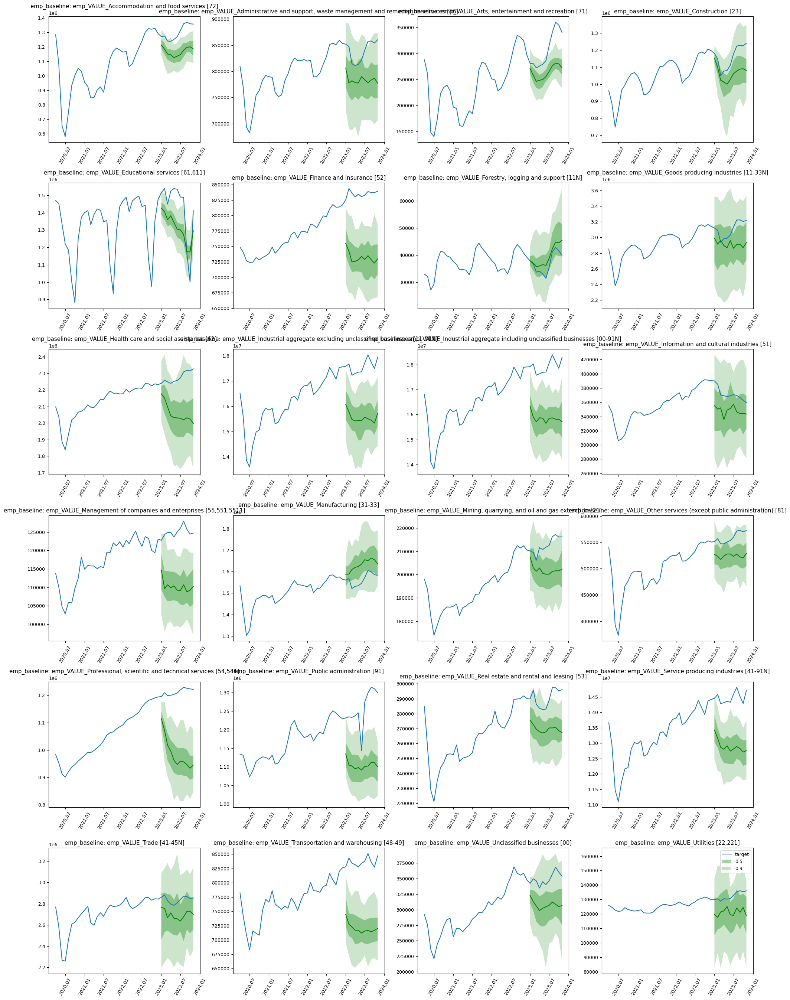

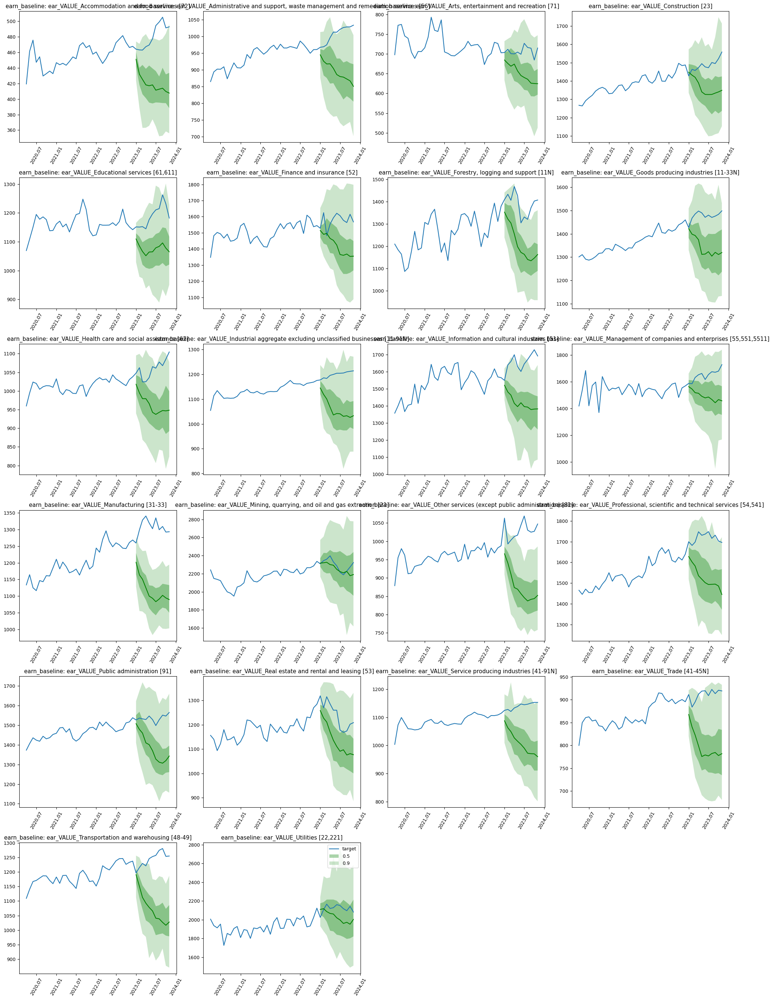

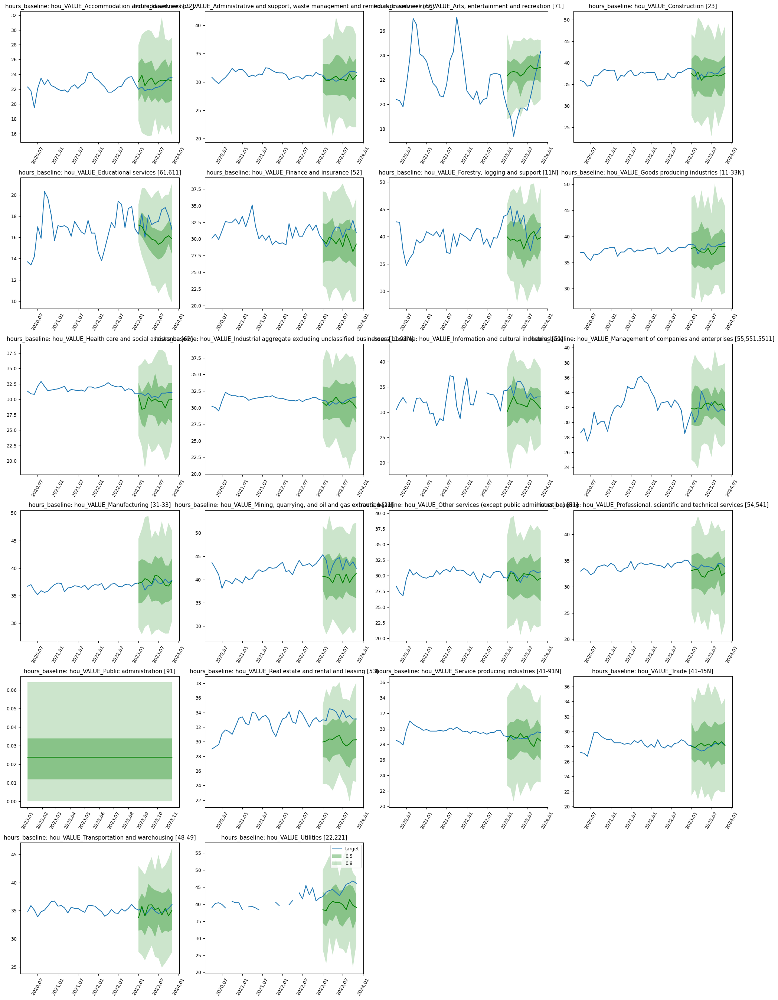

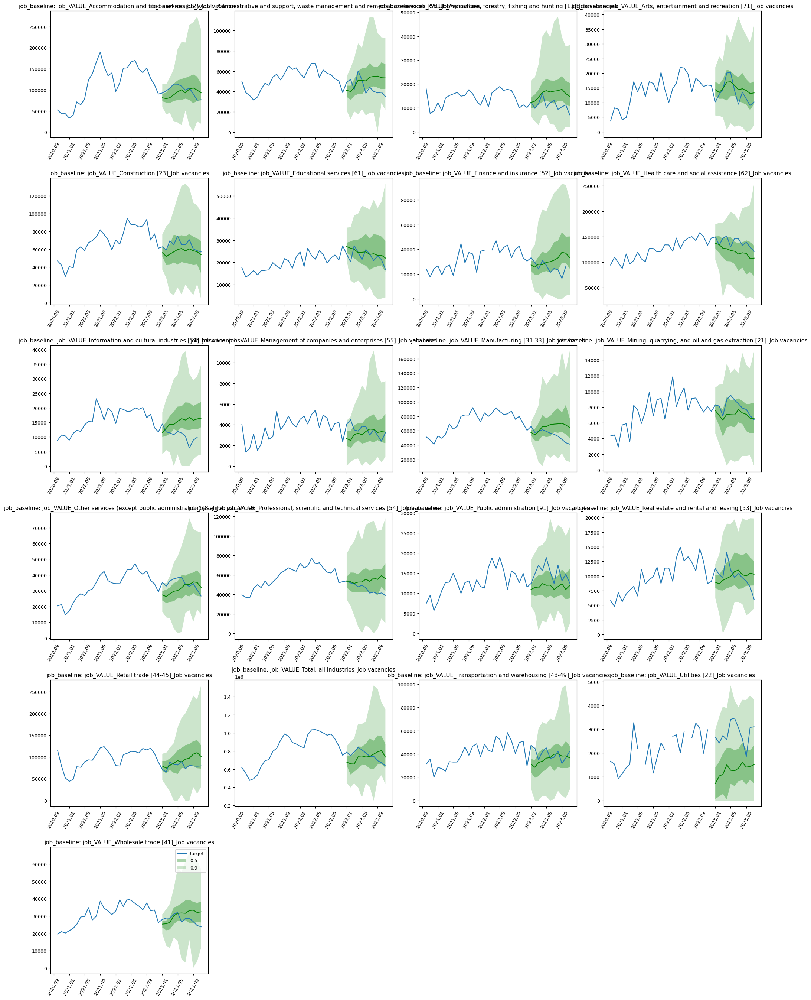

In [9]:
import pickle

# Compile final selected features based on remaining indices
df = pd.read_csv('emp_melt_complete_data.csv')

remaining_feature_groups_idxs = [2, 4, 5, 6, 8, 9, 10]
feature_groups = [
    [col for col in df.columns if col.startswith(prefix)] 
    for prefix in ['covid', 'indeed', 'inf_VALUE_Bank rate', 'inf_VALUE_Target rate',
                   'cpi_VALUE', 'gdp_VALUE', 'bus', 'job', 'ear', 'emp', 'hou']
]

final_selected_features = [feature for idx in remaining_feature_groups_idxs for feature in feature_groups[idx]]
# print("Final selected features:", final_selected_features)

plots_dir = "Final_run-EEHJ-04-13"
os.makedirs(plots_dir, exist_ok=True)

# Evaluate models and save plots
results = []
model_name = 'lag-llama'
datasets = [('emp', 'emp_melt_complete_data.csv', 5), ('earn', 'ear_melt_complete_data.csv', 6), ('hours', 'hou_melt_complete_data.csv', 6), ('job', 'job_melt_complete_data.csv', 5.2)]
hou_dataset = [('hours', 'hou_melt_complete_data.csv', 6)]
Job_datasets = [('job', 'job_melt_complete_data.csv', 5.2)]
best_score = float('inf')

for dataset_name, path_to_csv, cl in tqdm(datasets, desc=f"Processing datasets"): 
    best_score = float('inf')
    print(f'processing {dataset_name} with {cl} context_length factor')   
    # for i in range(5):
    for model_type in ['baseline']:
        result = evaluate_model(model_name, dataset_name,path_to_csv, model_type,
                                prediction_length = 11, 
                                with_external=True, context_length_factor=cl,
                                selected_features=final_selected_features)
        
        results.append(result)
        if result.overall_mase < best_score:
            best_score = result.overall_mase
            best_result = result
            # File path for the result pickle file
            
            result_pickle_path = os.path.join(plots_dir, f'{result.dataset_name}_baseline_result.pkl')

            # Check if the file exists and delete it if it does
            if os.path.exists(result_pickle_path):
                os.remove(result_pickle_path)

            # Save the new best result
            with open(result_pickle_path, 'wb') as f:
                pickle.dump(best_result, f)
            

        # Save plots
        plot_obj = plots_and_evaluation(forecasts= result.forecasts, tss= result.ts, title = dataset_name+'_'+model_type)
        save_path = os.path.join(plots_dir, f"_baseline{result.dataset_name}_{cl}_forecasts.png")
        plot_obj.plot_forcasts_all(save_path=save_path)
        # Create DataFrame
        results_df = pd.DataFrame([result.to_dict() for result in results])
        # Save results to CSV
        results_df.to_csv(plots_dir+r'\final_evaluation_results.csv', index=False)

# Final model

In [204]:
import pickle

# Compile final selected features based on remaining indices
df = pd.read_csv('emp_melt_complete_data.csv')

remaining_feature_groups_idxs = [2, 4, 5, 6, 8, 9, 10]
feature_groups = [
    [col for col in df.columns if col.startswith(prefix)] 
    for prefix in ['covid', 'indeed', 'inf_VALUE_Bank rate', 'inf_VALUE_Target rate',
                   'cpi_VALUE', 'gdp_VALUE', 'bus', 'job', 'ear', 'emp', 'hou']
]

final_selected_features = [feature for idx in remaining_feature_groups_idxs for feature in feature_groups[idx]]
# print("Final selected features:", final_selected_features)

plots_dir = "Final_run-EEHJ-04-13"
os.makedirs(plots_dir, exist_ok=True)

# Evaluate models and save plots
results = []
model_name = 'lag-llama'
datasets = [('emp', 'emp_melt_complete_data.csv', 6), ('earn', 'ear_melt_complete_data.csv', 6), ('hours', 'hou_melt_complete_data.csv', 6), ('job', 'job_melt_complete_data.csv', 5.2)]
hou_dataset = [('hours', 'hou_melt_complete_data.csv', 6)]
Job_datasets = [('job', 'job_melt_complete_data.csv', 5.2)]
best_score = float('inf')

for dataset_name, path_to_csv, cl in tqdm(hou_dataset, desc=f"Processing datasets"): 
    best_score = float('inf')
    print(f'processing {dataset_name} with {cl} context_length factor')   
    for i in range(5):
        for model_type in ['fine_tuned']:
            result = evaluate_model(model_name, dataset_name,path_to_csv, model_type,
                                    prediction_length = 11, 
                                    with_external=True, context_length_factor=cl,
                                    selected_features=final_selected_features)
            
            results.append(result)
            if result.overall_mase < best_score:
                best_score = result.overall_mase
                best_result = result
                # File path for the result pickle file
                
                result_pickle_path = os.path.join(plots_dir, f'MASE_{result.dataset_name}_best_result.pkl')

                # Check if the file exists and delete it if it does
                if os.path.exists(result_pickle_path):
                    os.remove(result_pickle_path)

                # Save the new best result
                with open(result_pickle_path, 'wb') as f:
                    pickle.dump(best_result, f)
                

            # Save plots
            plot_obj = plots_and_evaluation(forecasts= result.forecasts, tss= result.ts, title = dataset_name+'_'+model_type)
            save_path = os.path.join(plots_dir, f"{i}_MASE_{result.dataset_name}_{cl}_forecasts.png")
            plot_obj.plot_forcasts_all(save_path=save_path)
            # Create DataFrame
            results_df = pd.DataFrame([result.to_dict() for result in results])
            # Save results to CSV
            results_df.to_csv(plots_dir+r'\final_evaluation_results.csv', index=False)

Processing datasets:   0%|          | 0/1 [00:00<?, ?it/s]

processing job with 5.2 context_length factor


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type               | Params
-----------------------------------------------------
0 | model         | LagLlamaModel      | 2.4 M 
1 | augmentations | ApplyAugmentations | 0     
-----------------------------------------------------
2.4 M     Trainable params
0         Non-trainable params
2.4 M     Total params
9.797     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\Abdul-AzizAlNajjar\CU\DATA 5001\lag-llama\lag_llama\model\module.py:316: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:263.)
  y = F.scaled_dot_product_attention(


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 9.942
Epoch 0, global step 50: 'val_loss' reached 9.94239 (best 9.94239), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_498\\checkpoints\\epoch=0-step=50.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.179 >= min_delta = 0.0. New best score: 9.763
Epoch 1, global step 100: 'val_loss' reached 9.76319 (best 9.76319), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_498\\checkpoints\\epoch=1-step=100.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.168 >= min_delta = 0.0. New best score: 9.595
Epoch 2, global step 150: 'val_loss' reached 9.59477 (best 9.59477), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_498\\checkpoints\\epoch=2-step=150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.043 >= min_delta = 0.0. New best score: 9.551
Epoch 3, global step 200: 'val_loss' reached 9.55135 (best 9.55135), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_498\\checkpoints\\epoch=3-step=200.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.043 >= min_delta = 0.0. New best score: 9.508
Epoch 4, global step 250: 'val_loss' reached 9.50814 (best 9.50814), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_498\\checkpoints\\epoch=4-step=250.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.128 >= min_delta = 0.0. New best score: 9.380
Epoch 12, global step 650: 'val_loss' reached 9.38018 (best 9.38018), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_498\\checkpoints\\epoch=12-step=650.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 900: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 950: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 1000: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 1050: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 1100: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.181 >= min_delta = 0.0. New best score: 9.199
Epoch 22, global step 1150: 'val_loss' reached 9.19891 (best 9.19891), saving model to 'c:\\Users\\Abdul-AzizAlNajjar\\CU\\DATA 5001\\lag-llama\\lightning_logs\\version_498\\checkpoints\\epoch=22-step=1150.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 1200: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 1250: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 1300: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 1350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 1400: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 1450: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 1500: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 1550: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 1600: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 1650: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 33, global step 1700: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 34, global step 1750: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 35, global step 1800: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 36, global step 1850: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

Monitored metric val_loss did not improve in the last 15 records. Best score: 9.199. Signaling Trainer to stop.
Epoch 37, global step 1900: 'val_loss' was not in top 1
Ground truth: 100%|██████████| 21/21 [00:00<00:00, 346.89it/s]
Running evaluation: 21it [00:00, 194.31it/s]
Processing datasets: 100%|██████████| 1/1 [02:42<00:00, 162.47s/it]

ITS JOB TIME


## plot 1

Plotting model datasets:   0%|          | 0/4 [00:00<?, ?it/s]

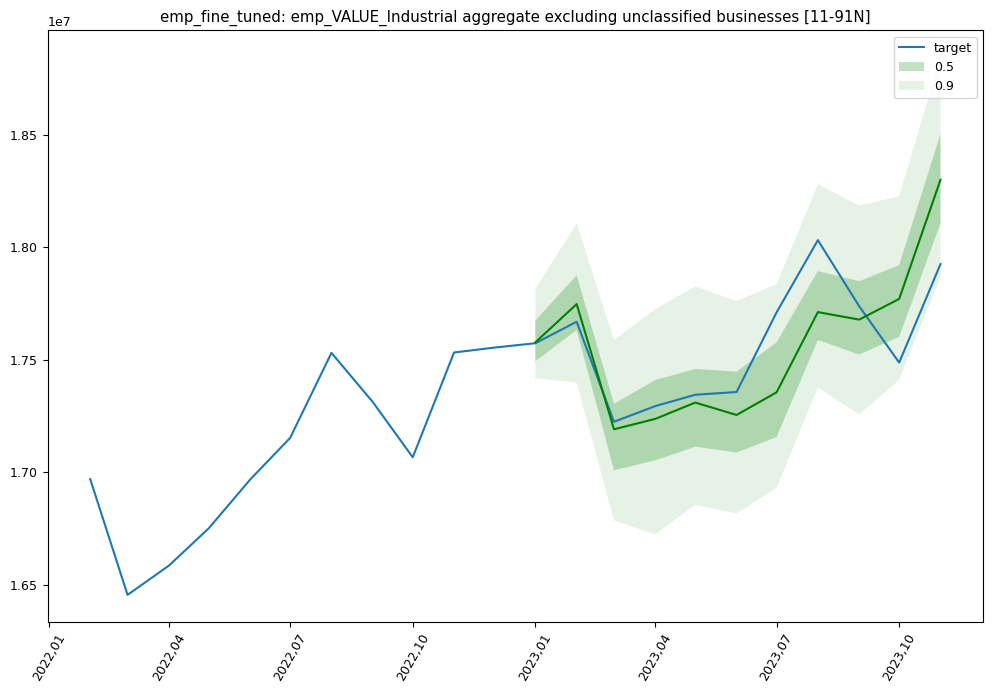

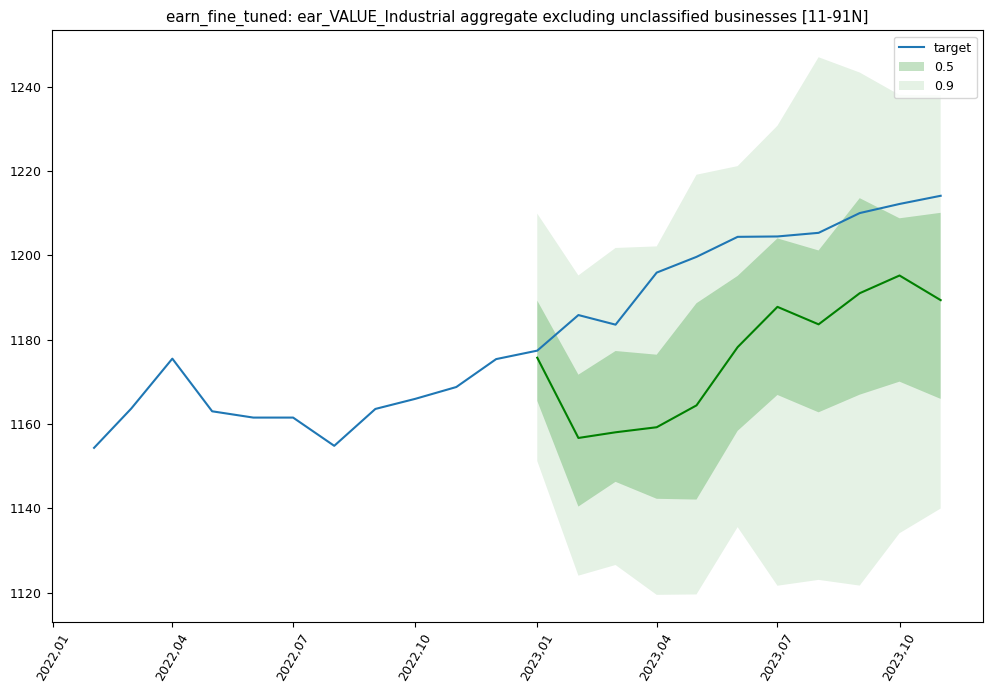

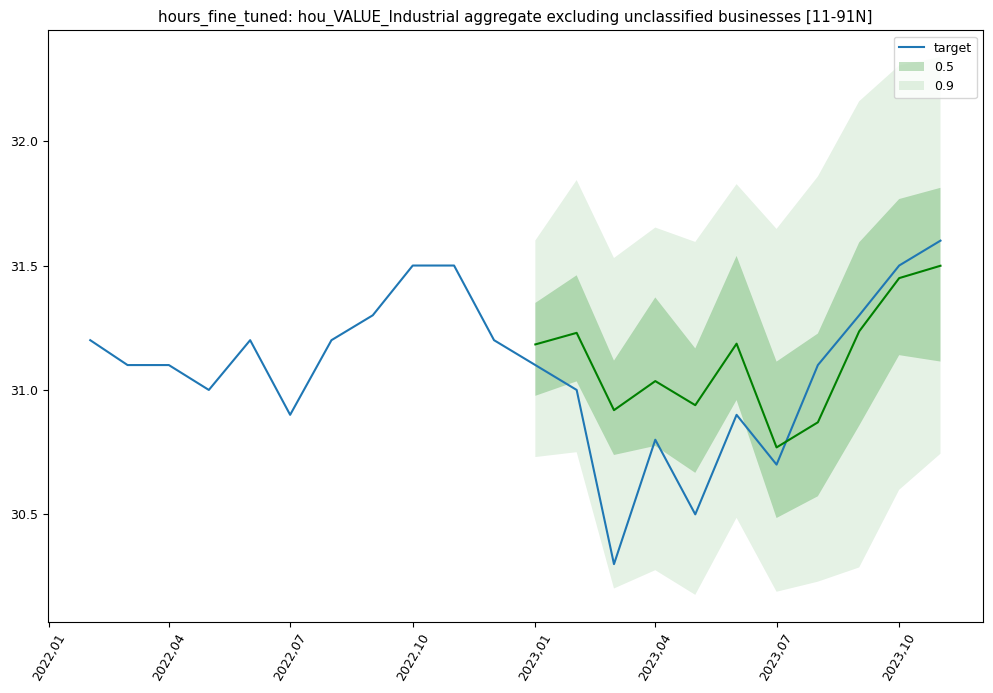

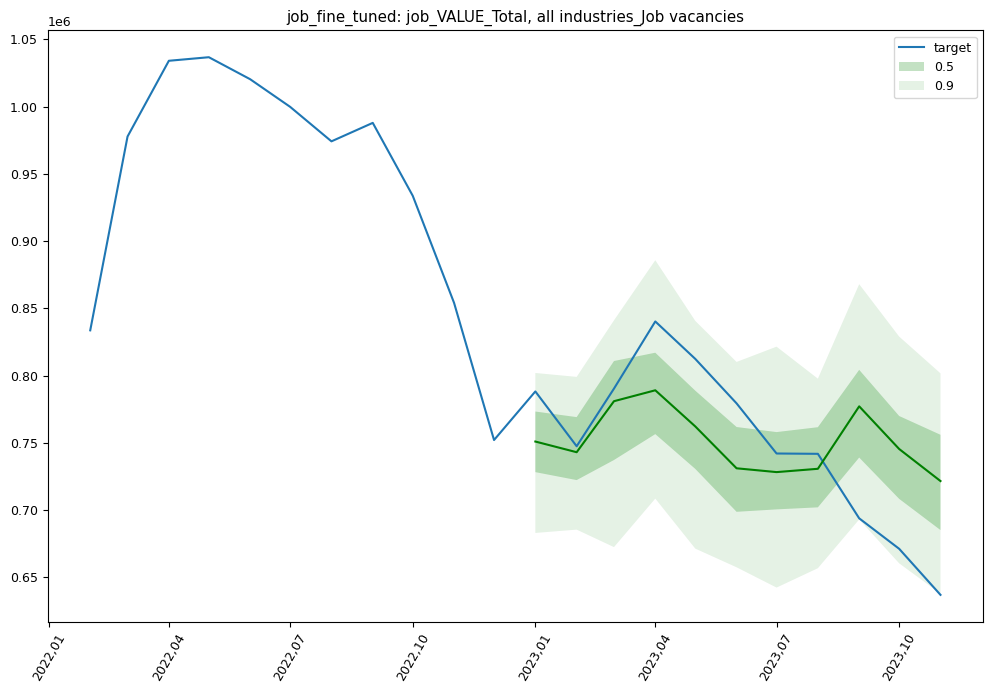

In [11]:
model_type = 'finetuned'
plots_dir = 'Final_run-EEHJ'
# plots_dir = 'Final_run-EEHJ-04-13'
datasets = [('emp', 'emp_melt_complete_data.csv', 6), ('earn', 'ear_melt_complete_data.csv', 6), ('hours', 'hou_melt_complete_data.csv', 6), ('job', 'job_melt_complete_data.csv', 5.2)]
earn_datasets =  [('earn', 'ear_melt_complete_data.csv', 6)]
for dataset_name, path_to_csv, cl in tqdm(datasets, desc=f"Plotting model datasets"):
    # Specify the path to the pickle file
    pickle_file_path = f'{plots_dir}\{dataset_name}_best_result.pkl'
    # pickle_file_path = r'Final_run-EEHJ\final_earn_best_result.pkl'

    # Load the best result from the pickle file
    with open(pickle_file_path, 'rb') as f:
        loaded_best_result = pickle.load(f)
    
    # plot_only = None
    plot_only = 'Total, all industries' if dataset_name == 'job' else 'Industrial aggregate excluding unclassified businesses [11-91N]'
    # plot_only = 'Edu'
    
    plot_obj = plots_and_evaluation(forecasts= loaded_best_result.forecasts, tss=loaded_best_result.ts, title = loaded_best_result.dataset_name+'_'+loaded_best_result.model_type, plot_only=plot_only)
    save_path = os.path.join(plots_dir, f"{loaded_best_result.dataset_name}_{loaded_best_result.model_type}_forecasts_final.png")
    plot_obj.plot_forcasts_all(save_path=save_path, zoom_to_predicted= True)

### plotting multiple traces

In [218]:
class plots_and_evaluation_2_the_all_industries_:
    
    def __init__(self, forecasts, tss, forecasts_2, tss_2, prediction_length=11, title='', plot_only=None):
        self.forecasts = forecasts
        self.tss = tss
        self.forecasts_2 = forecasts_2
        self.tss_2 = tss_2
        self.prediction_length = prediction_length
        self.title = title
        self.plot_only = plot_only
        
    def plot_forcasts_all(self, Dataset_name, zoom_to_predicted=False, save_path=None):
        # Set the size of the figure and create subplots without shared y-axis
        fig, axs = plt.subplots(figsize=(20, 28), nrows=6, ncols=4, sharex=True)
        date_formater = mdates.DateFormatter('%Y,%m')
        plt.rcParams.update({'font.size': 9})

        # Store handles and labels for the legend
        handles, labels = None, None

        for idx, ((forecast, ts), (forecast_2, ts_2)) in enumerate(zip(zip(self.forecasts, self.tss), zip(self.forecasts_2, self.tss_2))):
            if idx >= len(axs.flatten()):
                break
            ax = axs.flatten()[idx]
            if self.plot_only and self.plot_only in forecast.item_id:
                zoom = -5 if zoom_to_predicted else 20
                ax.plot(ts[zoom * self.prediction_length:].to_timestamp(), label=f"Target: {Dataset_name} - {self.plot_only}", color='blue')
            else:
                ax.plot(ts[-3 * self.prediction_length:].to_timestamp(), label="Target", color='blue')
            
            forecast.plot(ax=ax, color='green', name="Fine-Tuned", show_label=True)
            forecast_2.plot(ax=ax, color='red', name="Baseline", show_label=True)
            
            ax.xaxis.set_major_formatter(date_formater)
            ax.set_title(f"{forecast.item_id if self.plot_only else forecast.item_id[:40]}")
            ax.tick_params(axis='x', labelsize=12, rotation=60)
            ax.tick_params(axis='y', labelsize=10)

            # Collect handles and labels for legend from the first subplot
            if handles is None and labels is None:
                handles, labels = ax.get_legend_handles_labels()

        # Set a shared legend for the figure
        fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 1.0), ncol=3, fontsize=13)

        plt.tight_layout(rect=[0, 0.03, 1, 0.96])  # Adjust layout to make room for the legend at the bottom

        # Compose save path using Dataset_name
        if save_path:
            save_path = f"C:/Users/Abdul-AzizAlNajjar/CU/DATA 5001/Figures/{Dataset_name}_llama_All_industries.pdf"
        plt.savefig(save_path, format='pdf')  # Save as PDF
        plt.close(fig)  # Close the figure to free up memory

        print(f"Saved figure to {save_path}")

    def evaluate(self):
        evaluator = Evaluator()
        agg_metrics, ts_metrics = evaluator(iter(self.tss), iter(self.forecasts))
        agg_metrics_2, ts_metrics_2 = evaluator(iter(self.tss_2), iter(self.forecasts_2))
        return agg_metrics, ts_metrics, agg_metrics_2, ts_metrics_2


Running evaluation: 24it [00:00, 272.35it/s]4 [00:00<?, ?it/s]
Running evaluation: 24it [00:00, 224.11it/s]
Running evaluation: 22it [00:00, 250.39it/s]4 [00:00<00:01,  2.30it/s]
Running evaluation: 22it [00:00, 195.02it/s]
Plotting model datasets:  50%|█████     | 2/4 [00:00<00:00,  2.29it/s]c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\gluonts\evaluation\metrics.py:90: UserWarning: Warning: converting a masked element to nan.
  return float(np.mean(target <= forecast))
Running evaluation: 22it [00:00, 257.50it/s]
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\miniconda3\envs\pytorch_cuda124\lib\site-packages\pandas\core\dtypes\astype.py:134: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)
c:\Users\Abdul-AzizAlNajjar\min

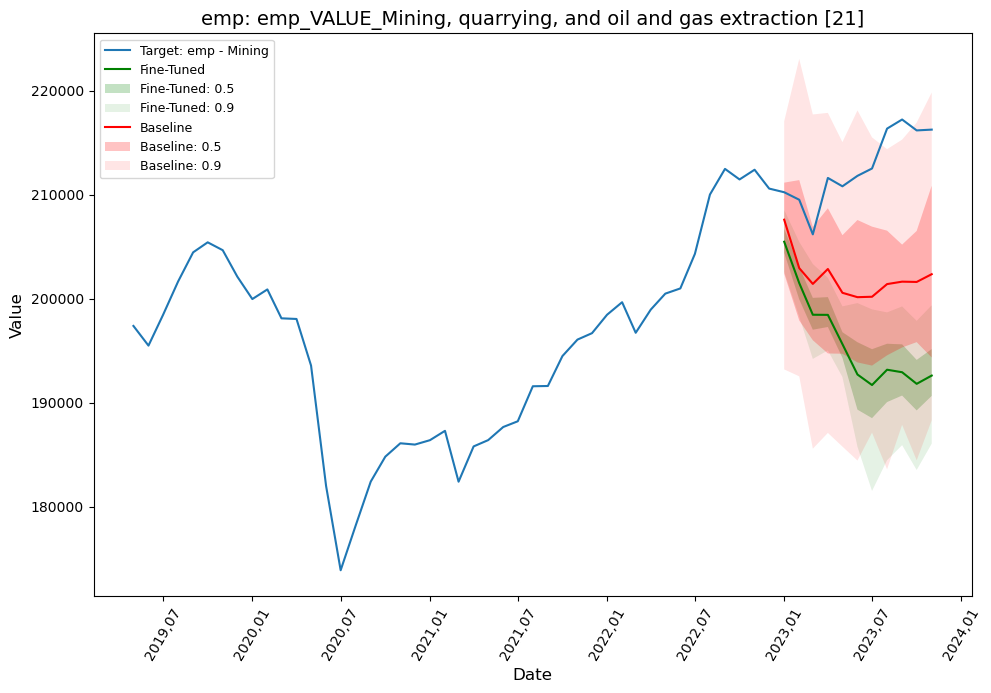

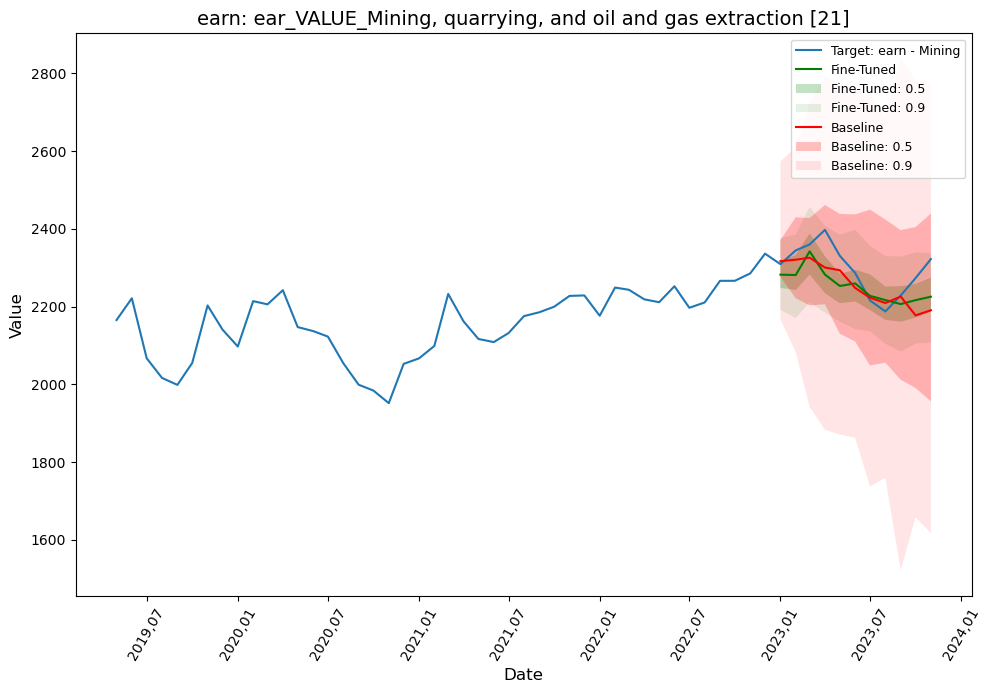

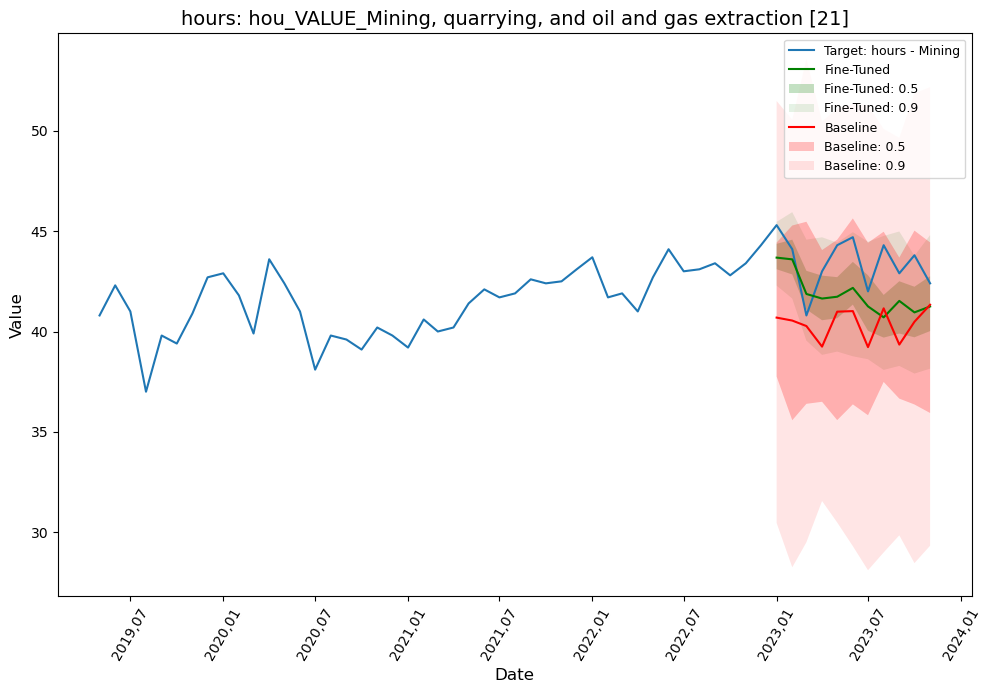

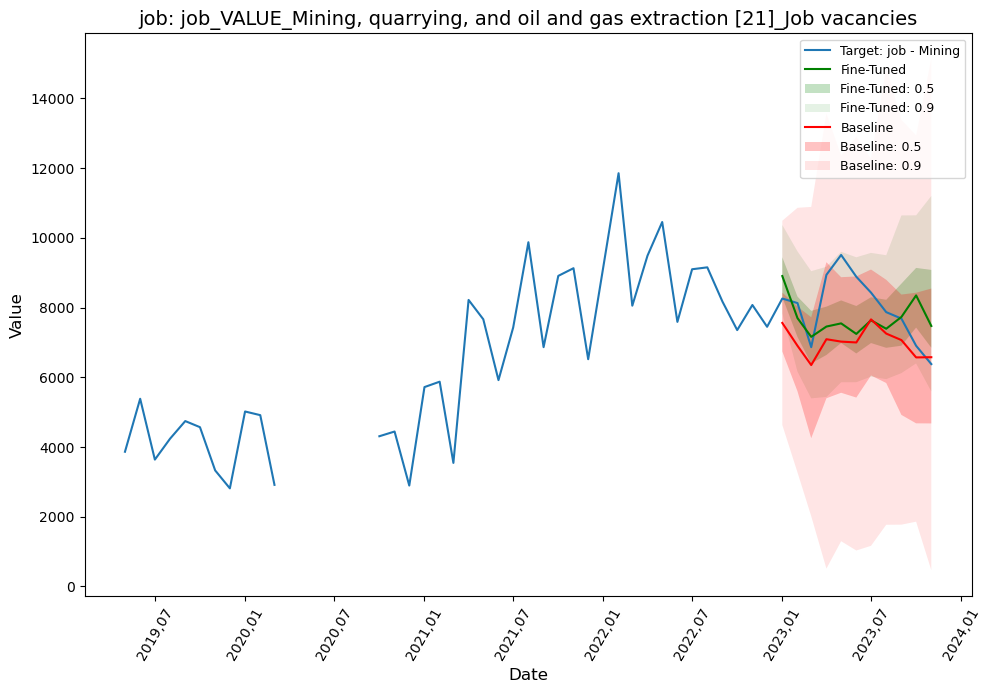

In [222]:
plots_dir_ = 'Final_run-EEHJ'
plots_dir = r'Final_run-EEHJ-04-13'
results = []
datasets = [('emp', 'emp_melt_complete_data.csv', 6), ('earn', 'ear_melt_complete_data.csv', 6), ('hours', 'hou_melt_complete_data.csv', 6), ('job', 'job_melt_complete_data.csv', 5.2)]
for dataset_name, path_to_csv, cl in tqdm(datasets, desc=f"Plotting model datasets"):
    # Specify the path to the pickle file
    pickle_file_path_fine_tuned = f'{plots_dir}\{dataset_name}_best_result.pkl'
    pickle_file_path_baseline = f'{plots_dir}\{dataset_name}_baseline_result.pkl'

    # pickle_file_path = r'Final_run-EEHJ\final_earn_best_result.pkl'

    # Load the best result from the pickle file
    with open(pickle_file_path_fine_tuned, 'rb') as f:
        loaded_best_result_fine_tuned = pickle.load(f)
    with open(pickle_file_path_baseline, 'rb') as f:
        loaded_best_result_baseline = pickle.load(f)
    # plot_only = None
    # plot_only = 'Total, all industries' if dataset_name == 'job' else 'Industrial aggregate exclu'
    plot_only = 'Mining'
    
    plot_obj = plots_and_evaluation_2(forecasts= loaded_best_result_fine_tuned.forecasts, tss=loaded_best_result_fine_tuned.ts, forecasts_2=loaded_best_result_baseline.forecasts,
                                      tss_2=loaded_best_result_baseline.ts, title = loaded_best_result_fine_tuned.dataset_name, plot_only=plot_only)
    save_path = os.path.join(plots_dir, f"{loaded_best_result_fine_tuned.dataset_name}_both_forecasts_final.png")
    plot_obj.plot_forcasts_all(Dataset_name = loaded_best_result_fine_tuned.dataset_name, save_path=save_path, zoom_to_predicted= True)
    agg_metrics, ts_metrics, agg_metrics_2, ts_metrics_2 = plot_obj.evaluate()

    if 'job' in dataset_name:
        column= dataset_name[:3]+'_VALUE_'+'Total, all industries'+'_Job vacancies'
    else: 
        column = dataset_name[:3]+'_VALUE_'+'Industrial aggregate excluding unclassified businesses [11-91N]'

    Finetuned_all_industries_mape = ts_metrics[ts_metrics['item_id'] == column]['MAPE'].item()
    baseline_all_industries_mape = ts_metrics_2[ts_metrics_2['item_id'] == column]['MAPE'].item()  

    # Store the results
    results.append({
        'Dataset': dataset_name,
        'Finetuned MAPE': agg_metrics['MAPE'],
        'Baseline MAPE': agg_metrics_2['MAPE'],
        'Finetuned MASE': agg_metrics['MASE'],
        'Baseline MASE': agg_metrics_2['MASE'],
        'Finetuned All Industries MAPE': Finetuned_all_industries_mape,
        'Baseline All Industries MAPE': baseline_all_industries_mape
    })
    
# Convert results to a DataFrame
df_results = pd.DataFrame(results)

# Save to CSV
csv_file_path = os.path.join(plots_dir, 'baseline_finetuned_comparison.csv')
df_results.to_csv(csv_file_path, index=False)   


In [210]:
result.forecasts[-4].median

array([705476.9 , 675075.75, 648309.75, 641431.94, 608865.  , 572906.5 ,
       568083.8 , 587249.5 , 594233.44, 578594.8 , 582867.9 ],
      dtype=float32)

In [260]:
import os
import pickle
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from tqdm import tqdm
import matplotlib.dates as mdates

class plots_and_evaluation_2:
    def __init__(self, forecasts, tss, forecasts_2, tss_2, prediction_length=11, title='', plot_only=None):
        self.forecasts = forecasts
        self.tss = tss
        self.forecasts_2 = forecasts_2
        self.tss_2 = tss_2
        self.prediction_length = prediction_length
        self.title = title
        self.plot_only = plot_only
    
    def plot_forcasts_all(self, Dataset_name, ax, zoom_to_predicted=False):
        date_formater = mdates.DateFormatter('%Y,%m')
        plt.sca(ax)  # Set the current axes to the provided ax
        for idx, ((forecast, ts), (forecast_2, ts_2)) in enumerate(zip(zip(self.forecasts, self.tss), zip(self.forecasts_2, self.tss_2))):
            if self.plot_only:
                if self.plot_only in forecast.item_id:
                    zoom = -5 if zoom_to_predicted else 20
                    ax.plot(ts[zoom * self.prediction_length:].to_timestamp(), label=f"Target: {Dataset_name} - {self.plot_only}")
                    forecast.plot(ax=ax, color='green', name="Fine-Tuned", show_label=True)
                    forecast_2.plot(ax=ax, color='red', name="Baseline", show_label=True)
                    ax.set_xlabel('Date')
                    ax.set_ylabel('Value')
                    ax.set_title(self.title + ': ' + forecast.item_id[:50])
                    ax.xaxis.set_major_formatter(date_formater)
                    ax.legend(loc='upper left',fontsize='small') 
                    ax.tick_params(axis='x', labelsize=10,rotation=45)
                    ax.tick_params(axis='y', labelsize=10)
            else:
                ax.plot(ts[-4 * self.prediction_length:].to_timestamp(), label="Target", color='blue')
                forecast.plot(ax=ax, color='green', name="Fine-Tuned", show_label=True)
                forecast_2.plot(ax=ax, color='red', name="Baseline", show_label=True)
                ax.set_xlabel('Date')
                ax.set_ylabel('Value')
                ax.set_title(self.title + ': ' + forecast.item_id)
                ax.legend(loc='upper left',fontsize='large') 
                ax.xaxis.set_major_formatter(date_formater)
                ax.tick_params(axis='x', labelsize=10, rotation=45)
                ax.tick_params(axis='y', labelsize=10)

plots_dir_ = 'Final_run-EEHJ'
plots_dir = r'Final_run-EEHJ-04-13'
datasets = [
    ('emp', 'emp_melt_complete_data.csv', 6),
    ('earn', 'ear_melt_complete_data.csv', 6),
    ('hours', 'hou_melt_complete_data.csv', 6),
    ('job', 'job_melt_complete_data.csv', 5.2)
]
figures_path = 'C:/Users/Abdul-AzizAlNajjar/CU/DATA 5001/Figures'

pdf_path = os.path.join(figures_path, "combined_plots_1_4_all.pdf")
with PdfPages(pdf_path) as pdf:
    fig, axs = plt.subplots(1, 4, figsize=(25, 6.2))
    axs = axs.flatten()

    for idx, (dataset_name, path_to_csv, cl) in enumerate(tqdm(datasets)):
        pickle_file_path_fine_tuned = os.path.join(plots_dir_, f"{dataset_name}_best_result.pkl")
        pickle_file_path_baseline = os.path.join(plots_dir, f"{dataset_name}_baseline_result.pkl")
        
        with open(pickle_file_path_fine_tuned, 'rb') as f:
            loaded_best_result_fine_tuned = pickle.load(f)
        with open(pickle_file_path_baseline, 'rb') as f:
            loaded_best_result_baseline = pickle.load(f)

        plot_only = 'Total, all industries' if dataset_name == 'job' else 'Industrial aggregate excluding'
        # plot_only = 'Heal'
        plot_obj = plots_and_evaluation_2(
            forecasts=loaded_best_result_fine_tuned.forecasts,
            tss=loaded_best_result_fine_tuned.ts,
            forecasts_2=loaded_best_result_baseline.forecasts,
            tss_2=loaded_best_result_baseline.ts,
            title=dataset_name,
            plot_only=plot_only
        )
        plot_obj.plot_forcasts_all(dataset_name, axs[idx], zoom_to_predicted=True)

    fig.tight_layout()
    pdf.savefig(fig)
    plt.close(fig)

print(f"Saved all plots to {pdf_path}")


  0%|          | 0/4 [00:00<?, ?it/s]

100%|██████████| 4/4 [00:00<00:00, 48.53it/s]


Saved all plots to C:/Users/Abdul-AzizAlNajjar/CU/DATA 5001/Figures\combined_plots_1_4_all.pdf


In [269]:
pickle_file_path_fine_tuned =  "Final_run-EEHJ-04-13\job_best_result.pkl"
with open(pickle_file_path_fine_tuned, 'rb') as f:
        loaded_best_result_fine_tuned = pickle.load(f) 
forecasts  = loaded_best_result_fine_tuned.forecasts 
ts = loaded_best_result_fine_tuned.ts


In [270]:
for forecast in forecasts:
    if 'job_VALUE_Total, all industries_Job vacancies' in forecast.item_id:
        job = forecast

In [ ]:
plot_obj = plots_and_evaluation(
            forecasts=forecasts,
            tss=ts,
            title=dataset_name,
            plot_only=plot_only
        )
plot_obj.

In [272]:
forecasts

[gluonts.model.forecast.SampleForecast(info=None, item_id='job_VALUE_Accommodation and food services [72]_Job vacancies', samples=array([[ 76734.52 ,  86776.836,  77055.914, ...,  99779.08 ,  87921.31 ,
          82004.96 ],
        [ 79189.2  ,  89379.26 ,  81718.16 , ...,  98895.12 ,  86738.22 ,
          84764.44 ],
        [ 78201.34 ,  81140.87 ,  86253.945, ..., 101332.43 ,  80330.63 ,
          76945.   ],
        ...,
        [ 83855.69 ,  90136.37 ,  84179.19 , ..., 101900.27 ,  91383.17 ,
          87574.31 ],
        [ 81740.7  ,  88524.34 ,  85708.48 , ...,  95107.2  ,  90611.86 ,
          84818.78 ],
        [ 80486.37 ,  81825.44 ,  86356.97 , ...,  87179.78 ,  93825.24 ,
          84498.16 ]], dtype=float32), start_date=Period('2023-01', 'M')),
 gluonts.model.forecast.SampleForecast(info=None, item_id='job_VALUE_Administrative and support, waste management and remediation services [56]_Job vacancies', samples=array([[51399.598, 46284.188, 52345.074, ..., 56583.35 , 5296

In [264]:
job.median

array([751022.2 , 743086.44, 781010.3 , 789131.56, 762260.5 , 731126.1 ,
       728299.44, 730759.44, 777196.4 , 745473.4 , 721642.7 ],
      dtype=float32)

In [275]:
# Recalculate the percentage improvement of the fine-tuned model over the baseline

baseline_mape = [0.2266, 0.1029, 0.0946, 0.0482]
fine_tuned_mape = [0.1659, 0.0269, 0.0346, 0.0422]
# baseline_all_industries_mape = [0.1107, 0.1148, 0.1146, 0.0180]
# fine_tuned_all_industries_mape = [0.0588, 0.0082, 0.0307, 0.0086]

# Calculate percentage improvement for MAPE
improvement_mape = [(baseline - fine_tuned) / baseline * 100 for baseline, fine_tuned in zip(baseline_mape, fine_tuned_mape)]
# Calculate percentage improvement for All Industries MAPE
# improvement_all_industries_mape = [(baseline - fine_tuned) / baseline * 100 for baseline, fine_tuned in zip(baseline_all_industries_mape, fine_tuned_all_industries_mape)]

# improvement_mape, improvement_all_industries_mape

np.mean(improvement_mape)


44.12962124498124

: 